# DE

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc

In [2]:
import matplotlib.pyplot as plt
from collections import Counter, defaultdict
import glob
import os

In [3]:
import gzip

In [4]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.10.4 anndata==0.11.1 umap==0.5.7 numpy==2.0.2 scipy==1.14.1 pandas==2.2.3 scikit-learn==1.6.0 statsmodels==0.14.4 igraph==0.11.8 pynndescent==0.5.13


In [5]:
run_dirs = glob.glob('../TX4[56]/*LamC') + glob.glob('../TX4[56]/*ctrl')
run_dirs.sort()
run_names = [os.path.basename(rd) for rd in run_dirs]
run_labels = ['TX45 ctrl', 'TX45 LamC', 'TX46 ctrl', 'TX46 LamC']
list(zip(run_dirs, run_names, run_labels))

[('../TX45/DS-0023A_ctrl', 'DS-0023A_ctrl', 'TX45 ctrl'),
 ('../TX45/DS-0023C_LamC', 'DS-0023C_LamC', 'TX45 LamC'),
 ('../TX46/DS-0024E_ctrl', 'DS-0024E_ctrl', 'TX46 ctrl'),
 ('../TX46/DS-00250_LamC', 'DS-00250_LamC', 'TX46 LamC')]

In [6]:
goi = 'LamC'

In [7]:
results_dir = f'results/{goi}'
if not os.path.exists(results_dir):
    os.makedirs(results_dir)

In [8]:
figs_dir = f'figures/{goi}'
if not os.path.exists(figs_dir):
    os.makedirs(figs_dir)

### Mutation helper function

In [9]:
import re

In [10]:
ins_re = re.compile('^I(\d+)([ACGT]+)$')
def parse_mutation(mut):
    """
    Return struct of form 
       [mut_type, ref_pos_start, ref_pos_end, bases]
       
    Del has bases == None
    Ins and sub have same ref_pos_start and ref_pos_end
    Sub has tuple of ref and new bases
    """
    if mut.startswith('J'):
        if '>' not in mut:  # Standard splice location
            us_pos = mut.index('_')
            return ['splice', int(mut[1:us_pos]), int(mut[us_pos+1:]), None]
        arrow_pos = mut.index('>')
        pos_str, delta_str = mut[1:arrow_pos], mut[arrow_pos+1:]
        us_pos = pos_str.index('_')
        start, end = int(pos_str[:us_pos]), int(pos_str[us_pos+1:])
        if delta_str == '-':  # Splice missing
            return ['splice', start, end, 'missing']
        else:  # Splicing error
            us_pos = delta_str.index('_')
            return ['splice', start, end, (int(delta_str[:us_pos]), int(delta_str[us_pos+1:]))]
    elif mut.startswith('D'):
        dash_pos = mut.index('-')
        return ['del', int(mut[1:dash_pos]), int(mut[dash_pos+1:]), None]
    elif mut.startswith('I'):
        m = ins_re.match(mut)
        pos = int(m.group(1))
        return ['ins', pos, pos, m.group(2)]
    else:
        pos = int(mut[1:-1])
        return ['sub', pos, pos, (mut[0], mut[-1])]

### Add celltype and mutation information and combine

In [11]:
celltype_given_bc_given_run_label = {}
for run_label, run_dir in zip(run_labels, run_dirs):
    tx, samp = run_label.split()
    fname = f'{tx}_{samp}_in_joint_celltypes.txt'
    fpath = os.path.join('celltype_files', fname)
    celltype_given_bc_given_run_label[run_label] = {line.strip().split()[0]: line.strip().split()[1] for line in open(fpath)}
    print(fpath, len(celltype_given_bc_given_run_label[run_label]))
# celltype_given_bc_given_run_label

celltype_files/TX45_ctrl_in_joint_celltypes.txt 3823
celltype_files/TX45_LamC_in_joint_celltypes.txt 4997
celltype_files/TX46_ctrl_in_joint_celltypes.txt 5206
celltype_files/TX46_LamC_in_joint_celltypes.txt 5726


In [12]:
run_labels

['TX45 ctrl', 'TX45 LamC', 'TX46 ctrl', 'TX46 LamC']

In [13]:
mutation_fpath_given_run_label = {
    'TX45 LamC': '../241023/results/TX45_LamC_mutation_statuses.txt',
    'TX46 LamC': '../250407/results/TX46_LamC_mutation_statuses.txt'
}

In [14]:
uncalled_set = set(['n/a', 'low_cov_uncalled', 'high_cov_uncalled'])

In [15]:
mutation_signature_given_bc_given_run_label = {}
het_hom_status_given_bc_given_run_label = {}
combined_indel_lens_given_bc_given_run_label = {}
wtlike_status_given_bc_given_run_label = {}
mut_sig_cntr_given_run_label = {}
clone_id_given_bc_given_run_label = {}
cells_in_clone_given_bc_given_run_label = {}
clone_id_cntr_given_run_label = {}

for run_label in run_labels:
    if 'ctrl' in run_label:
        continue
    for d in [mutation_signature_given_bc_given_run_label, 
              het_hom_status_given_bc_given_run_label,
              combined_indel_lens_given_bc_given_run_label,
              wtlike_status_given_bc_given_run_label,
              clone_id_given_bc_given_run_label]:
        d[run_label] = {}
    for i, line in enumerate(open(mutation_fpath_given_run_label[run_label])):
        if i == 0:
            continue
        bc, maternal_mut, paternal_mut = line.strip().split()
        bc = f'{bc}-1'
        
        mat_pat_muts = [maternal_mut, paternal_mut]
        mat_pat_muts = ['uncalled' if mut in uncalled_set else mut for mut in mat_pat_muts]
        if 'uncalled' in mat_pat_muts:
            continue
        mut_str = '/'.join(mat_pat_muts)
        mutation_signature_given_bc_given_run_label[run_label][bc] = mut_str

        if 'uncalled' in mat_pat_muts:
            het_hom_status = 'uncalled'
        elif mat_pat_muts == ['wt', 'wt']:
            het_hom_status = 'wt'
        elif 'wt' in mat_pat_muts:
            het_hom_status = 'het'
        else:
            het_hom_status = 'hom'
        het_hom_status_given_bc_given_run_label[run_label][bc] = het_hom_status

        indel_lens = []
        for mut_str in mat_pat_muts:
            indel_len = 0
            for mut in mut_str.split(','):
                if mut in ['wt', 'uncalled']:
                    continue
                mut_type, start, end, bases = parse_mutation(mut)
                if mut_type == 'del':
                    mut_len = end - start + 1
                    indel_len -= mut_len
                if mut_type == 'ins':
                    mut_len = len(bases)
                    indel_len += mut_len
            indel_lens.append(indel_len)
        indel_lens = tuple(indel_lens)
        combined_indel_lens_given_bc_given_run_label[run_label][bc] = indel_lens

        indel_mod3_lens = [il % 3 == 0 if il <= 30 else -1 for il in indel_lens]
        if 'uncalled' in mat_pat_muts:
            wtlike_status = 'uncalled'
        elif mat_pat_muts == ['wt', 'wt']:
            wtlike_status = 'wt'
        elif indel_mod3_lens == [0, 0]:
            wtlike_status = 'wt-like'
        elif 'wt' in mat_pat_muts:
            wtlike_status = 'het'
        elif 0 in indel_mod3_lens:
            wtlike_status = 'het-like'
        else:
            wtlike_status = 'hom'
        wtlike_status_given_bc_given_run_label[run_label][bc] = wtlike_status

    mut_sig_cntr = Counter(mutation_signature_given_bc_given_run_label[run_label].values())
    mut_sig_cntr_given_run_label[run_label] = mut_sig_cntr
    clones = set([mut_sig for mut_sig in mut_sig_cntr.keys() if 'uncalled' not in mut_sig and mut_sig != 'wt/wt'])
    clone_id_given_bc_given_run_label[run_label] = {}
    cells_in_clone_given_bc_given_run_label[run_label] = {}
    for bc, mut_sig in mutation_signature_given_bc_given_run_label[run_label].items():
        if mut_sig in clones:
            clone_id_given_bc_given_run_label[run_label][bc] = f'{run_label} {mut_sig}'
            cells_in_clone_given_bc_given_run_label[run_label][bc] = mut_sig_cntr[mut_sig]
        else:
            clone_id_given_bc_given_run_label[run_label][bc] = ''
            cells_in_clone_given_bc_given_run_label[run_label][bc] = 0
    clone_id_cntr_given_run_label[run_label] = Counter(clone_id_given_bc_given_run_label[run_label].values())

# DE

In [16]:
from pydeseq2.dds import DeseqDataSet
from pydeseq2.default_inference import DefaultInference
from pydeseq2.ds import DeseqStats

In [17]:
raw_adatas = [
    sc.read_10x_mtx(
    '{}/counts/outs/filtered_feature_bc_matrix/'.format(run_dir),  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                              # write a cache file for faster subsequent reading
    for run_dir in run_dirs
]

... reading from cache file cache/..-TX45-DS-0023A_ctrl-counts-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/..-TX45-DS-0023C_LamC-counts-outs-filtered_feature_bc_matrix-matrix.h5ad


/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


... reading from cache file cache/..-TX46-DS-0024E_ctrl-counts-outs-filtered_feature_bc_matrix-matrix.h5ad


/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


... reading from cache file cache/..-TX46-DS-00250_LamC-counts-outs-filtered_feature_bc_matrix-matrix.h5ad


/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [18]:
tmps = []
use_labels = run_labels 
for label in use_labels:
    assert label in run_labels, label
for adata, run_label in zip(raw_adatas, run_labels):
    if run_label not in use_labels:
        continue
    tmp = adata.copy()
    tmp.obs['batch'] = run_label
    
    celltypes = []
    for bc in tmp.obs.index:
        try:
            celltypes.append(celltype_given_bc_given_run_label[run_label][bc])
        except KeyError:
            celltypes.append('')
    tmp.obs['celltype'] = celltypes

    if 'ctrl' in run_label:
        tmp.obs['mut_sig'] = ''
        tmp.obs['het_hom_status'] = 'wt'
        tmp.obs['indel_lens'] = [(0, 0) for _ in tmp.obs.index]
        tmp.obs['maternal_indel_len'] = 0
        tmp.obs['paternal_indel_len'] = 0
        tmp.obs['wtlike_status'] = 'wt'
        tmp.obs['clone_id'] = ''
        tmp.obs['clone_cell_ct'] = 0
    else:
        mut_sig, het_hom_status, indel_lens, wtlike_status, clone_id, clone_cell_ct = [], [], [], [], [], []
        for bc in tmp.obs.index:
            try:
                mut_sig.append(mutation_signature_given_bc_given_run_label[run_label][bc])
                het_hom_status.append(het_hom_status_given_bc_given_run_label[run_label][bc])
                indel_lens.append(combined_indel_lens_given_bc_given_run_label[run_label][bc])
                wtlike_status.append(wtlike_status_given_bc_given_run_label[run_label][bc])
                clone_id.append(clone_id_given_bc_given_run_label[run_label][bc])
                clone_cell_ct.append(cells_in_clone_given_bc_given_run_label[run_label][bc])
            except:
                mut_sig.append('')
                het_hom_status.append('')
                indel_lens.append((None, None))
                wtlike_status.append('')
                clone_id.append('')
                clone_cell_ct.append(0)
        tmp.obs['mut_sig'] = mut_sig
        tmp.obs['het_hom_status'] = het_hom_status
        tmp.obs['indel_lens'] = indel_lens
        tmp.obs['maternal_indel_len'] = [tup[0] for tup in indel_lens]
        tmp.obs['paternal_indel_len'] = [tup[1] for tup in indel_lens]
        tmp.obs['wtlike_status'] = wtlike_status
        tmp.obs['clone_id'] = clone_id
        tmp.obs['clone_cell_ct'] = clone_cell_ct      
    
    tmps.append(tmp)

In [19]:
raw_comb_adata = tmps[0].concatenate(*tmps[1:], **dict(join='outer', batch_categories=[rl for rl in run_labels if rl in use_labels]))

In [20]:
raw_comb_adata

AnnData object with n_obs × n_vars = 24982 × 13942
    obs: 'batch', 'celltype', 'mut_sig', 'het_hom_status', 'indel_lens', 'maternal_indel_len', 'paternal_indel_len', 'wtlike_status', 'clone_id', 'clone_cell_ct'
    var: 'gene_ids', 'feature_types'

### Volcano plot code

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from adjustText import adjust_text

def plot_volcano(
    results_df,
    log2fc_thresh=1,
    padj_thresh=0.05,
    top_n_genes=10,
    figsize=(6, 5),
    annotate_up_down=True,
    fig_title='Volcano Plot',
):
    """
    Plot a volcano plot from pyDESeq2 results_df with gene annotations.

    Parameters:
        results_df (pd.DataFrame): Output from pyDESeq2 with 'log2FoldChange' and 'padj' columns.
        log2fc_thresh (float): Threshold for log2 fold change.
        padj_thresh (float): Threshold for adjusted p-value.
        top_n_genes (int): Number of top significant genes to annotate.
        figsize (tuple): Size of the plot.
        annotate_up_down (bool): If True, annotate both Up and Down genes; otherwise just by significance.
    """

    # Ensure necessary columns are present
    if 'log2FoldChange' not in results_df.columns or 'padj' not in results_df.columns:
        raise ValueError("results_df must contain 'log2FoldChange' and 'padj' columns.")

    # Clean up and preprocess
    df = results_df.copy()
    df = df.dropna(subset=['padj', 'log2FoldChange'])
    df['-log10(padj)'] = -np.log10(df['padj'])

    # Classify significance
    df['Significance'] = 'Not significant'
    df.loc[
        (df['padj'] < padj_thresh) & (df['log2FoldChange'] > log2fc_thresh),
        'Significance'
    ] = 'Up'
    df.loc[
        (df['padj'] < padj_thresh) & (df['log2FoldChange'] < -log2fc_thresh),
        'Significance'
    ] = 'Down'

    # Prepare top genes to annotate
    if annotate_up_down:
        top_genes = pd.concat([
            df[df['Significance'] == 'Up'].nsmallest(top_n_genes, 'padj'),
            df[df['Significance'] == 'Down'].nsmallest(top_n_genes, 'padj')
        ])
    else:
        top_genes = df[df['padj'] < padj_thresh].nsmallest(top_n_genes, 'padj')

    # Plot
    sns.set(style='whitegrid')
    plt.figure(figsize=figsize)

    ax = sns.scatterplot(
        data=df,
        x='log2FoldChange',
        y='-log10(padj)',
        hue='Significance',
        palette={'Up': 'red', 'Down': 'blue', 'Not significant': 'grey'},
        alpha=0.8,
        edgecolor=None
    )

    # Threshold lines
    plt.axhline(-np.log10(padj_thresh), linestyle='--', color='black', linewidth=1)
    plt.axvline(log2fc_thresh, linestyle='--', color='black', linewidth=1)
    plt.axvline(-log2fc_thresh, linestyle='--', color='black', linewidth=1)

    # Annotate genes
    texts = []
    for idx, row in top_genes.iterrows():
        texts.append(
            plt.text(
                row['log2FoldChange'],
                row['-log10(padj)'],
                str(idx),
                fontsize=9,
                weight='bold',
                color='black'
            )
        )
    adjust_text(texts, arrowprops=dict(arrowstyle="->", color='black', lw=0.5))

    # Final touches
    plt.title(fig_title)
    plt.xlabel('log2(Fold Change)')
    plt.ylabel('-log10(adjusted p-value)')
    plt.legend(title='Gene Status')
    plt.tight_layout()
    plt.show()

In [22]:
def get_significant_genes(
    results_df,
    log2fc_thresh=1,
    padj_thresh=0.05,
    output_file=None,
):
    """
    Filter DESeq2 results for significant genes and save to CSV.

    Parameters:
        results_df (pd.DataFrame): Output from pyDESeq2 with 'log2FoldChange' and 'padj'.
        log2fc_thresh (float): Minimum absolute log2 fold change.
        padj_thresh (float): Maximum adjusted p-value.
        output_file (str): Filename to write the filtered results.
    
    Returns:
        pd.DataFrame: Filtered and sorted significant genes.
    """

    # Ensure required columns exist
    if 'log2FoldChange' not in results_df.columns or 'padj' not in results_df.columns:
        raise ValueError("results_df must contain 'log2FoldChange' and 'padj' columns.")

    # Drop missing values
    df = results_df.dropna(subset=['log2FoldChange', 'padj']).copy()

    # Filter for significant genes
    sig_genes = df[
        (df['padj'] < padj_thresh) & (np.abs(df['log2FoldChange']) >= log2fc_thresh)
    ].copy()

    # Sort by log2FC 
    sig_genes = sig_genes.sort_values('log2FoldChange')

    # Save to CSV
    if output_file:
        sig_genes.to_csv(output_file)

        print(f"Saved to: {output_file}")
    return sig_genes


# DE

In [23]:
cluster_celltypes = sorted(ct for ct in set(raw_comb_adata.obs['celltype']) if ct not in ['', 'unk1', 'unk3']) + ['ISC/EB']
cluster_celltypes

['CC',
 'EB',
 'EE',
 'EEP',
 'ISC',
 'LFC',
 'MT',
 'VM',
 'aEC',
 'dEC',
 'dMT',
 'mEC',
 'pEC',
 'ISC/EB']

In [24]:
min_cells_per_condition = 10
min_max_reads_per_gene = 10

In [25]:
metadata = pd.DataFrame([rl.split()[-1] for rl in run_labels], index=run_labels, columns=['condition'])
metadata

,condition
TX45 ctrl,ctrl
TX45 LamC,LamC
TX46 ctrl,ctrl
TX46 LamC,LamC


## Full Sample Comparison

CC
Cell counts: [97, 77, 94, 49]
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.60 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.67 seconds.

Fitting LFCs...
... done in 0.55 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.20 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
Parp        18.456161        0.052537  0.703957  0.074631  0.940509  0.99957
Alg-2      133.888644       -0.600740  0.390038 -1.540210  0.123509  0.99957
Tim17b     160.838439       -0.470489  0.363925 -1.292819  0.196074  0.99957
CG41128     63.849654       -0.356504  0.471645 -0.755875  0.449724  0.99957
CG41099     12.417262        0.204045  0.807936  0.252551  0.800615  0.99957
...               ...             ...       ...       ...       ...      ...
mt:ND4     264.808427        0.322040  0.354148  0.909338  0.363172  0.99957
mt:ND4L     45.942873        0.432626  0.528546  0.818520  0.413060  0.99957
mt:ND6      77.421051        0.031767  0.489414  0.064909  0.948247  0.99957
mt:Cyt-b  2628.333117        0.147730  0.396246  0.372824  0.709279  0.99957
mt:ND1     220.473333        0.311355  0.351067  0.886883  0.375142  0.99957

[4500 rows x 6

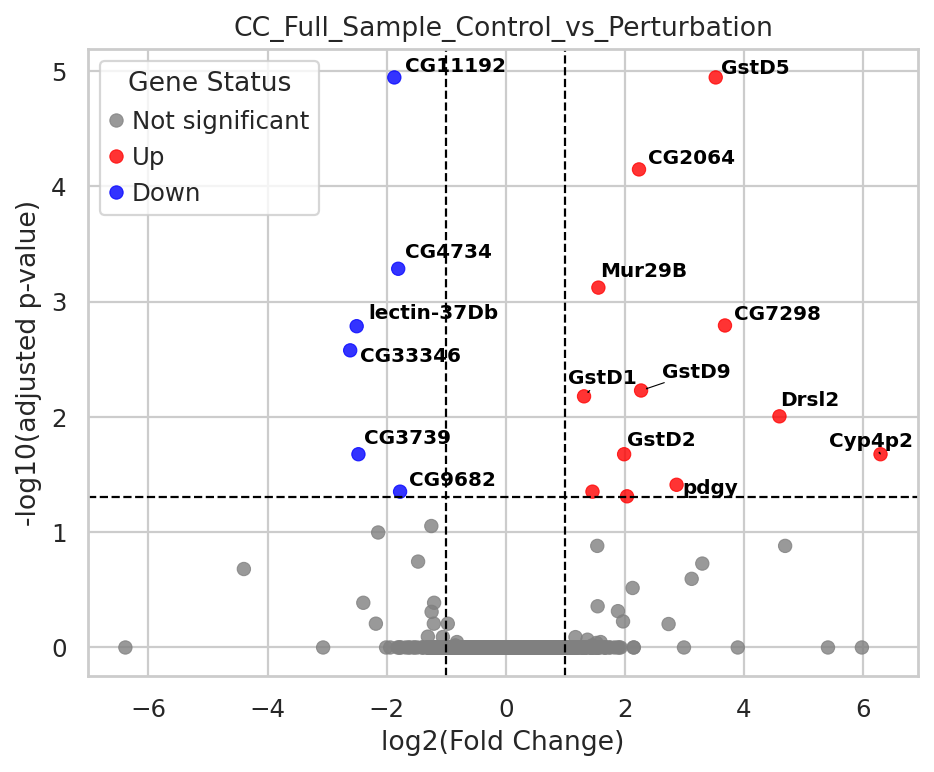


EB
Cell counts: [942, 977, 1385, 1216]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.05 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.12 seconds.

Fitting LFCs...
... done in 0.71 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.35 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       36.713443        0.129477  0.596781  0.216959  0.828240  0.999925
Pzl          11.659488       -0.711191  0.956259 -0.743722  0.457045  0.999925
Parp       1579.433707       -0.324755  0.332326 -0.977219  0.328461  0.999925
Alg-2      1031.099020       -0.184918  0.331386 -0.558014  0.576835  0.999925
Tim17b     1821.596619       -0.003618  0.326512 -0.011080  0.991159  0.999925
...                ...             ...       ...       ...       ...       ...
mt:ND4     5006.243520       -0.540591  0.390391 -1.384743  0.166131  0.999925
mt:ND4L    1805.181268       -0.846976  0.379490 -2.231880  0.025623  0.610045
mt:ND6     1824.847741       -0.942838  0.448183 -2.103691  0.035405  0.668474
mt:Cyt-b  55806.774360       -0.651431  0.433435 -1.502948  0.132852  0.999925
mt:ND1     2719.952816       -0.595336  0.411917 -1.445281  0.148379  

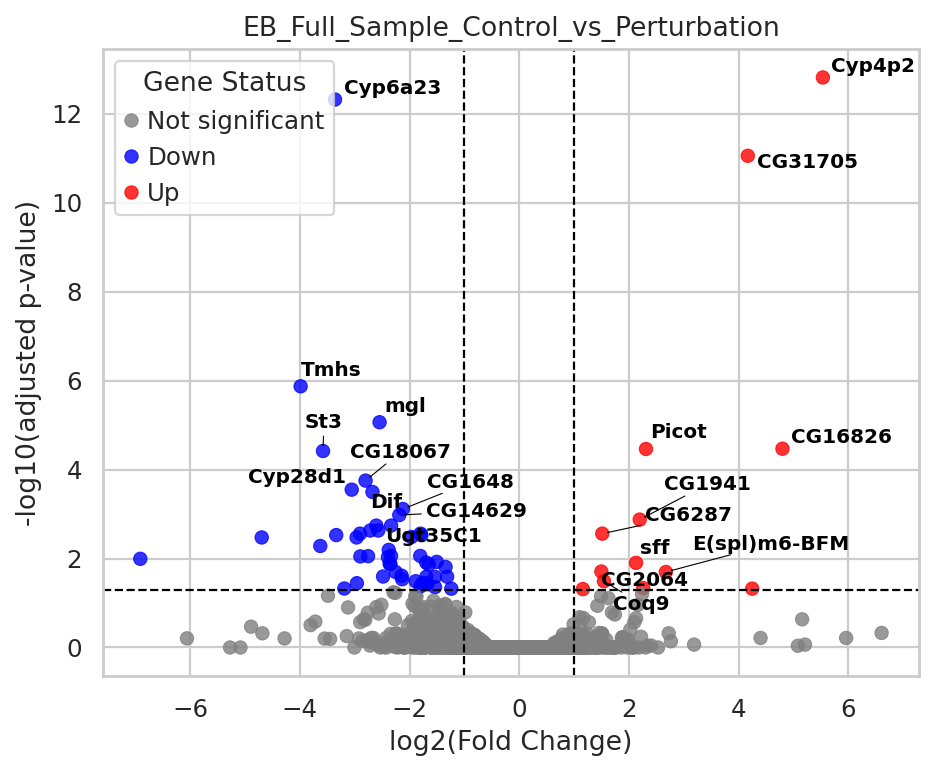


EE
Cell counts: [23, 91, 131, 174]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.64 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.73 seconds.

Fitting LFCs...
... done in 0.50 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.24 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        42.137646       -0.379687  0.541882 -0.700682  0.483502  0.999848
Alg-2       63.048721       -0.179260  0.488631 -0.366862  0.713722  0.999848
Tim17b      57.974589        0.058269  0.489961  0.118927  0.905333  0.999848
CG41128     21.797540        0.282173  0.721306  0.391198  0.695651  0.999848
CG41099     16.646159       -1.103405  0.810918 -1.360686  0.173613  0.999848
...               ...             ...       ...       ...       ...       ...
mt:ND4     171.226389        0.009187  0.389860  0.023564  0.981200  0.999848
mt:ND4L     50.157507        0.081365  0.545142  0.149254  0.881353  0.999848
mt:ND6      49.914230        0.022911  0.557058  0.041129  0.967193  0.999848
mt:Cyt-b  1846.641577        0.186574  0.370464  0.503621  0.614527  0.999848
mt:ND1     100.582973       -0.220275  0.432828 -0.508921  0.610807  0.999848

[5

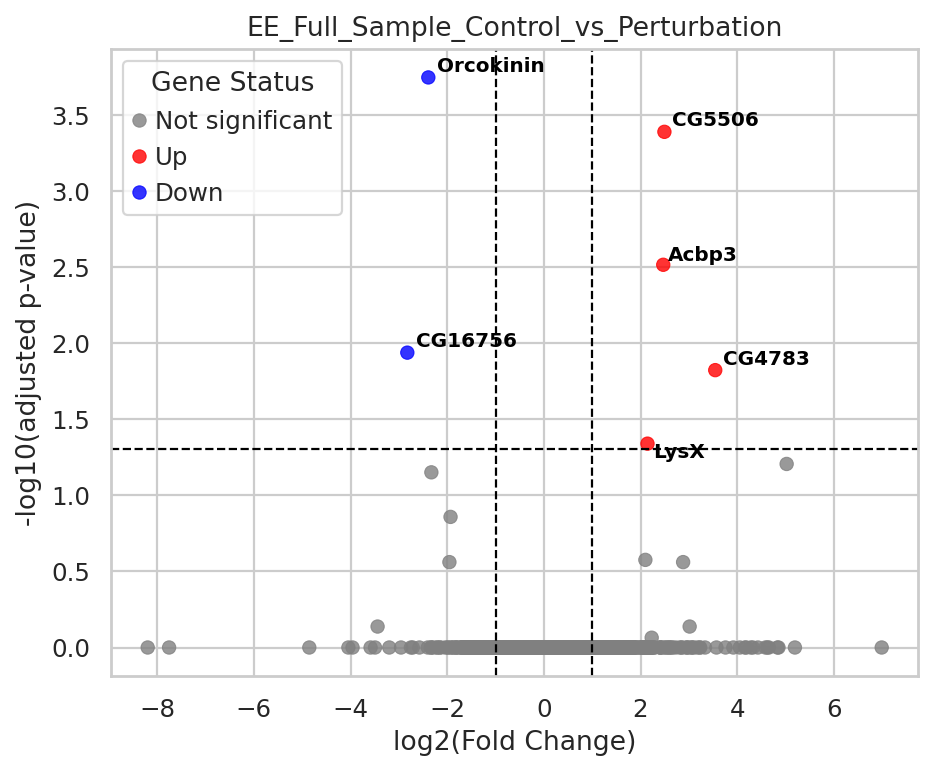


EEP
Cell counts: [27, 136, 194, 242]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.64 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.75 seconds.

Fitting LFCs...
... done in 0.64 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.27 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       5.682075       -0.198611  1.162798 -0.170804  0.864378  0.999992
Parp       119.142311       -0.226632  0.380818 -0.595119  0.551764  0.999992
Alg-2       61.850711       -0.031058  0.441710 -0.070312  0.943945  0.999992
Tim17b      95.949298        0.036468  0.405804  0.089866  0.928393  0.999992
CG41128     28.254028        0.159410  0.608099  0.262144  0.793210  0.999992
...               ...             ...       ...       ...       ...       ...
mt:ND4     252.672213       -0.243447  0.354726 -0.686296  0.492527  0.999992
mt:ND4L     88.784732       -0.412379  0.400626 -1.029337  0.303321  0.999992
mt:ND6      97.240478       -0.635166  0.479474 -1.324713  0.185266  0.999992
mt:Cyt-b  2971.843779       -0.386870  0.373735 -1.035145  0.300601  0.999992
mt:ND1     139.432766       -0.528180  0.404999 -1.304151  0.192182  0.999992

[5

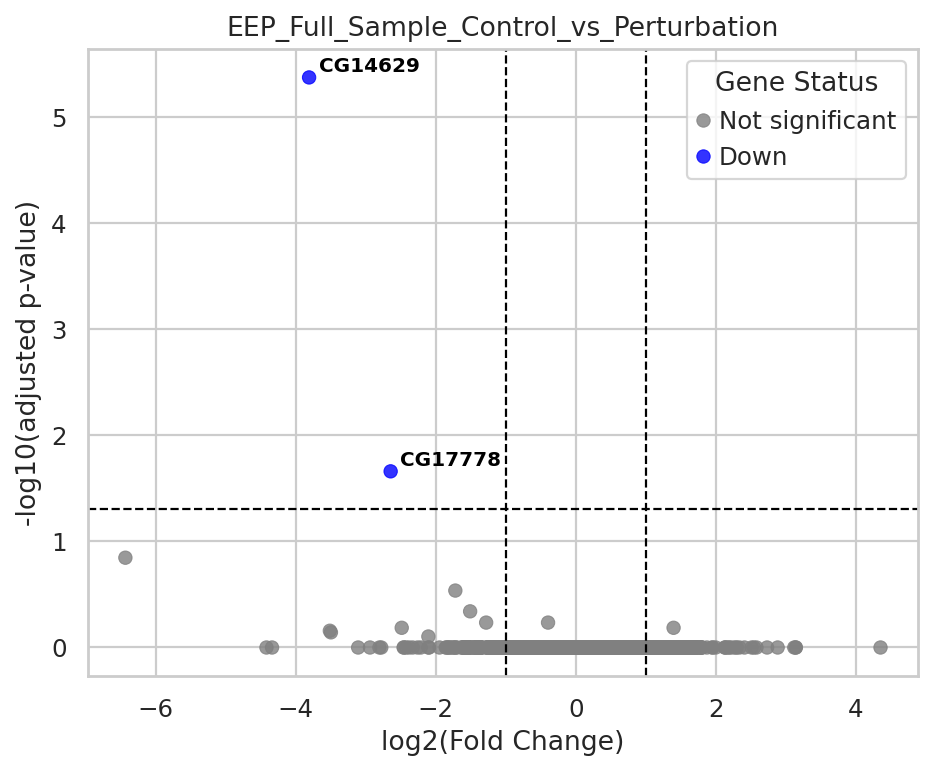


ISC
Cell counts: [975, 1444, 1866, 2119]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.08 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.09 seconds.

Fitting LFCs...
... done in 0.59 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.35 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       49.206226       -0.363452  0.542979 -0.669367  0.503261  0.999829
Pzl          17.737880       -1.061345  0.757711 -1.400725  0.161296  0.999829
Parp       1707.761195       -0.215510  0.361892 -0.595510  0.551503  0.999829
Alg-2       907.363983       -0.125744  0.368189 -0.341519  0.732713  0.999829
Tim17b     1508.836414       -0.049341  0.368726 -0.133815  0.893549  0.999829
...                ...             ...       ...       ...       ...       ...
mt:ND4     4289.821659       -0.492904  0.415912 -1.185116  0.235972  0.999829
mt:ND4L    1474.426549       -1.035576  0.417486 -2.480506  0.013120  0.691718
mt:ND6     1536.412287       -0.931277  0.469805 -1.982263  0.047450  0.999829
mt:Cyt-b  47671.055091       -0.682788  0.476726 -1.432245  0.152074  0.999829
mt:ND1     2195.508889       -0.625356  0.427847 -1.461635  0.143841  

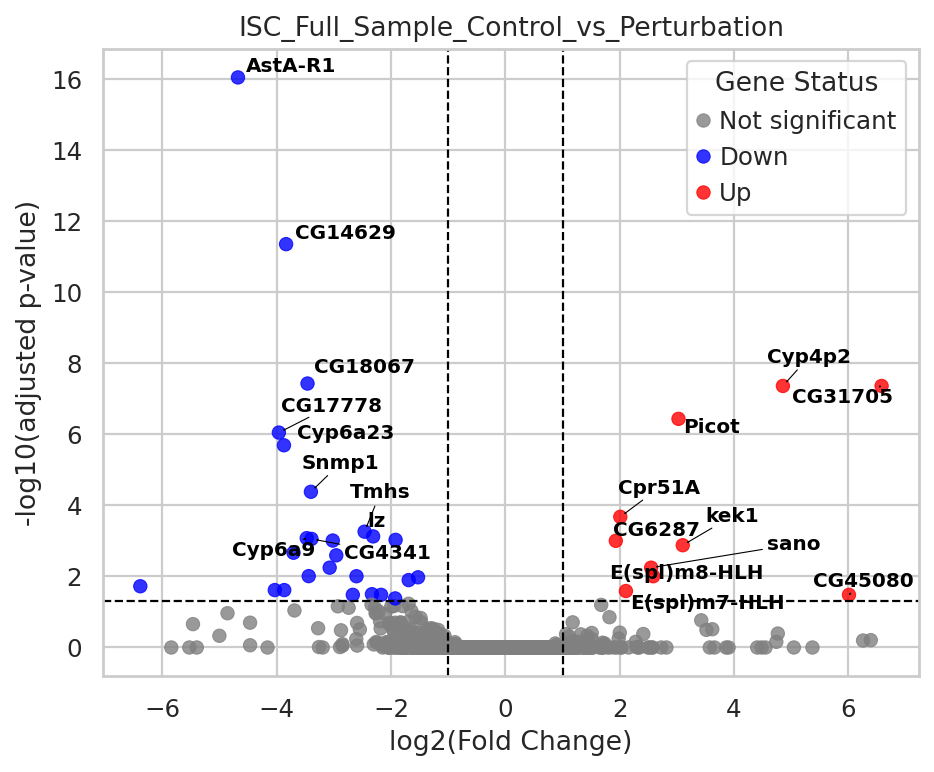


LFC
Cell counts: [282, 139, 298, 148]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.75 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.86 seconds.

Fitting LFCs...
... done in 0.49 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.29 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        43.506196       -0.423173  0.517166 -0.818253  0.413212  0.999878
Alg-2      178.537530       -0.312644  0.402657 -0.776453  0.437482  0.999878
Tim17b     215.043349       -0.496808  0.360638 -1.377580  0.168333  0.929902
CG41128     91.324656       -0.487112  0.541406 -0.899717  0.368271  0.999878
CG41099     25.858970       -0.119261  0.602874 -0.197821  0.843185  0.999878
...               ...             ...       ...       ...       ...       ...
mt:ND4     496.150111        0.070805  0.409106  0.173071  0.862595  0.999878
mt:ND4L    106.507236       -0.765337  0.465931 -1.642597  0.100466  0.794476
mt:ND6     133.490742       -0.329338  0.502892 -0.654887  0.512541  0.999878
mt:Cyt-b  5936.850756        0.035694  0.435991  0.081869  0.934751  0.999878
mt:ND1     312.176977       -0.100100  0.393310 -0.254506  0.799105  0.999878

[5

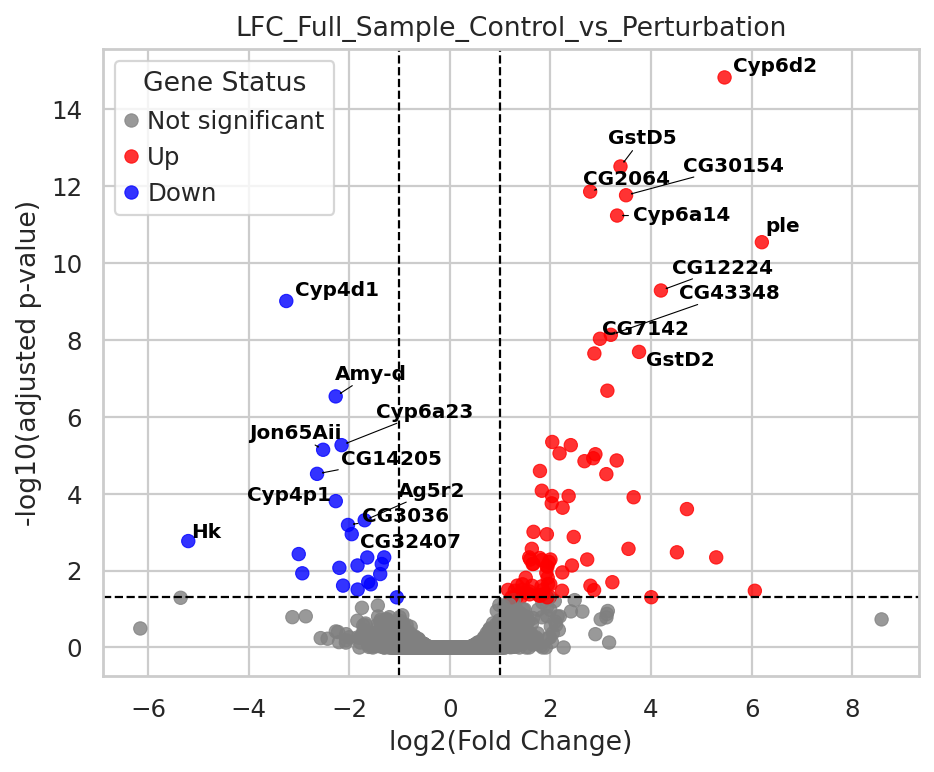


MT
Cell counts: [5, 37, 51, 79]
Insufficient cells
VM
Cell counts: [92, 48, 38, 48]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.50 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.58 seconds.

Fitting LFCs...
... done in 0.46 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.20 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        23.143911        0.100512  0.689644  0.145744  0.884123  0.999809
Alg-2       81.962955       -0.440105  0.457476 -0.962030  0.336035  0.999809
Tim17b      86.116431       -0.407222  0.460126 -0.885023  0.376144  0.999809
CG41128     32.956398       -0.151799  0.585759 -0.259149  0.795520  0.999809
CG41099     11.556151       -0.585448  0.910883 -0.642726  0.520402  0.999809
...               ...             ...       ...       ...       ...       ...
mt:ND4     232.324298       -0.187217  0.412046 -0.454360  0.649570  0.999809
mt:ND4L     47.237994       -0.593926  0.511891 -1.160258  0.245944  0.999809
mt:ND6      64.938701       -0.937289  0.548051 -1.710224  0.087225  0.999809
mt:Cyt-b  2684.732359       -0.457302  0.447752 -1.021329  0.307098  0.999809
mt:ND1     159.068591       -0.548412  0.419152 -1.308383  0.190743  0.999809

[3

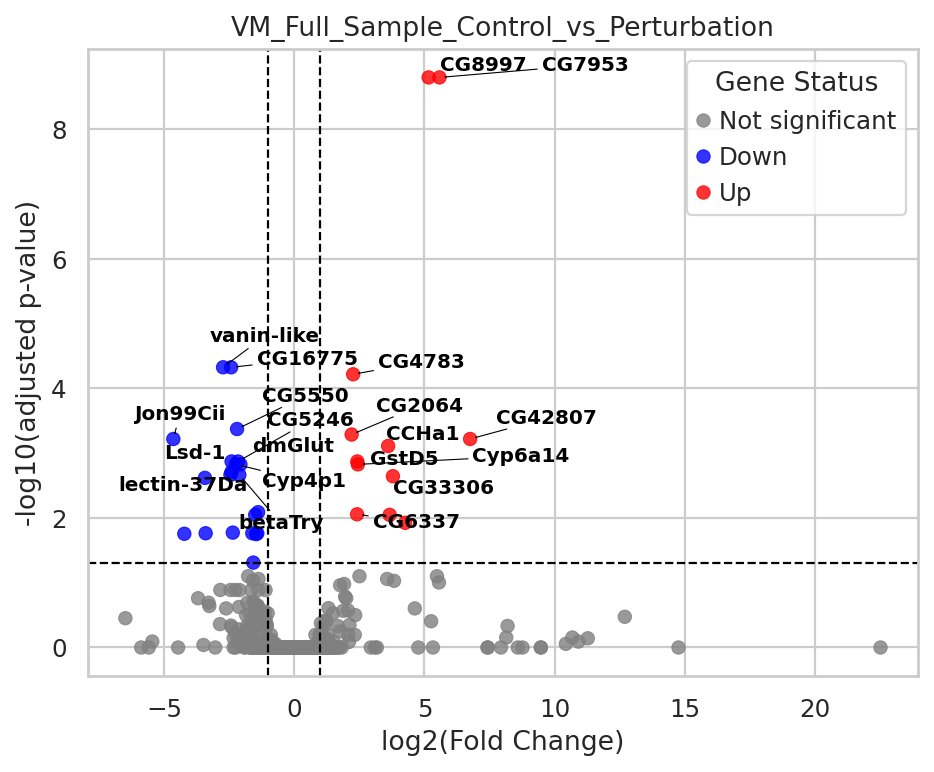


aEC
Cell counts: [764, 784, 407, 321]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.80 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.88 seconds.

Fitting LFCs...
... done in 0.50 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.28 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F        8.040632       -1.551405  1.042831 -1.487686  0.136834  0.999944
Parp         81.178856       -0.109568  0.488863 -0.224129  0.822657  0.999944
Alg-2       249.959737       -0.222704  0.412795 -0.539503  0.589540  0.999944
Tim17b      314.202094       -0.455987  0.407129 -1.120006  0.262711  0.999944
CG41128     116.030175       -0.277938  0.474652 -0.585562  0.558170  0.999944
...                ...             ...       ...       ...       ...       ...
mt:ND4      968.265783       -0.240269  0.438299 -0.548186  0.583564  0.999944
mt:ND4L     286.536742       -0.886410  0.476562 -1.860010  0.062884  0.999944
mt:ND6      337.204267       -1.025353  0.551679 -1.858606  0.063083  0.999944
mt:Cyt-b  13032.100378       -0.471186  0.520091 -0.905969  0.364952  0.999944
mt:ND1      612.389986       -0.385174  0.445546 -0.864498  0.387314  

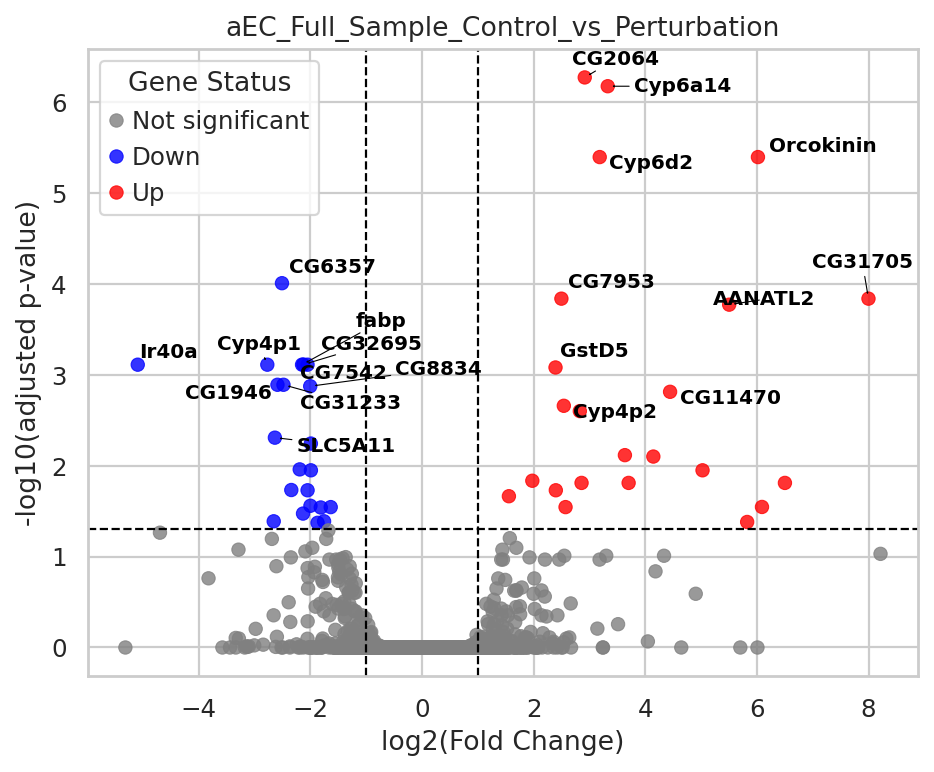


dEC
Cell counts: [146, 633, 398, 721]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.11 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.06 seconds.

Fitting LFCs...
... done in 0.58 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.34 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F        8.613759        1.155558  1.091776  1.058420  0.289864  0.999977
Parp        775.512276       -0.592306  0.268273 -2.207849  0.027255  0.764541
Alg-2      1113.805996       -0.347411  0.278155 -1.248981  0.211672  0.999977
Tim17b     1340.741574       -0.291688  0.256371 -1.137759  0.255221  0.999977
CG41128     572.443818       -0.374333  0.334898 -1.117751  0.263673  0.999977
...                ...             ...       ...       ...       ...       ...
mt:ND4     2971.068048       -0.136433  0.241612 -0.564679  0.572292  0.999977
mt:ND4L     855.057849       -0.241064  0.281949 -0.854990  0.392557  0.999977
mt:ND6      879.248470       -0.471006  0.299390 -1.573220  0.115668  0.999977
mt:Cyt-b  29504.482347       -0.122916  0.332000 -0.370227  0.711213  0.999977
mt:ND1     1843.408405       -0.407142  0.245721 -1.656927  0.097534  

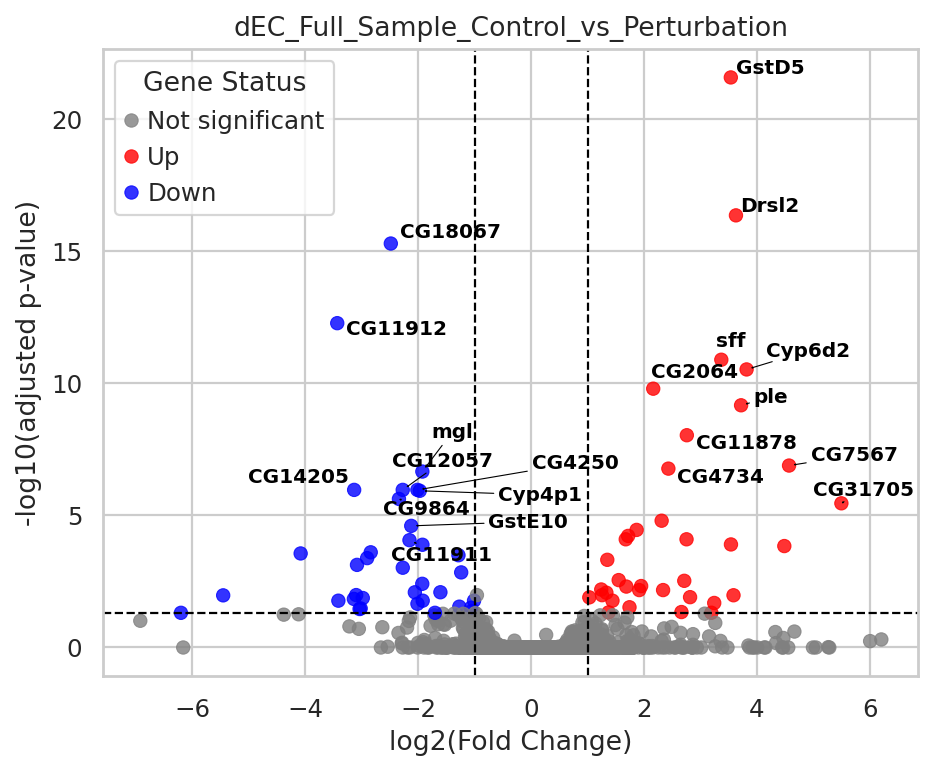


dMT
Cell counts: [24, 80, 79, 110]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.48 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.57 seconds.

Fitting LFCs...
... done in 0.51 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.19 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        50.292281       -0.411865  0.480363 -0.857404  0.391222  0.999978
Alg-2       26.448087       -0.266013  0.595362 -0.446809  0.655013  0.999978
Tim17b      31.896766        0.274419  0.568693  0.482544  0.629420  0.999978
CG41128      7.911231       -0.260386  0.998378 -0.260809  0.794240  0.999978
CG41099      6.592924       -0.098827  1.053827 -0.093779  0.925285  0.999978
...               ...             ...       ...       ...       ...       ...
mt:ND4     121.988602       -0.335073  0.403638 -0.830133  0.406464  0.999978
mt:ND4L     43.533387       -0.417069  0.502536 -0.829928  0.406580  0.999978
mt:ND6      51.587058       -0.727200  0.597517 -1.217036  0.223590  0.999978
mt:Cyt-b  1620.343146       -0.308656  0.404658 -0.762758  0.445608  0.999978
mt:ND1      68.304076       -0.474424  0.473116 -1.002764  0.315975  0.999978

[3

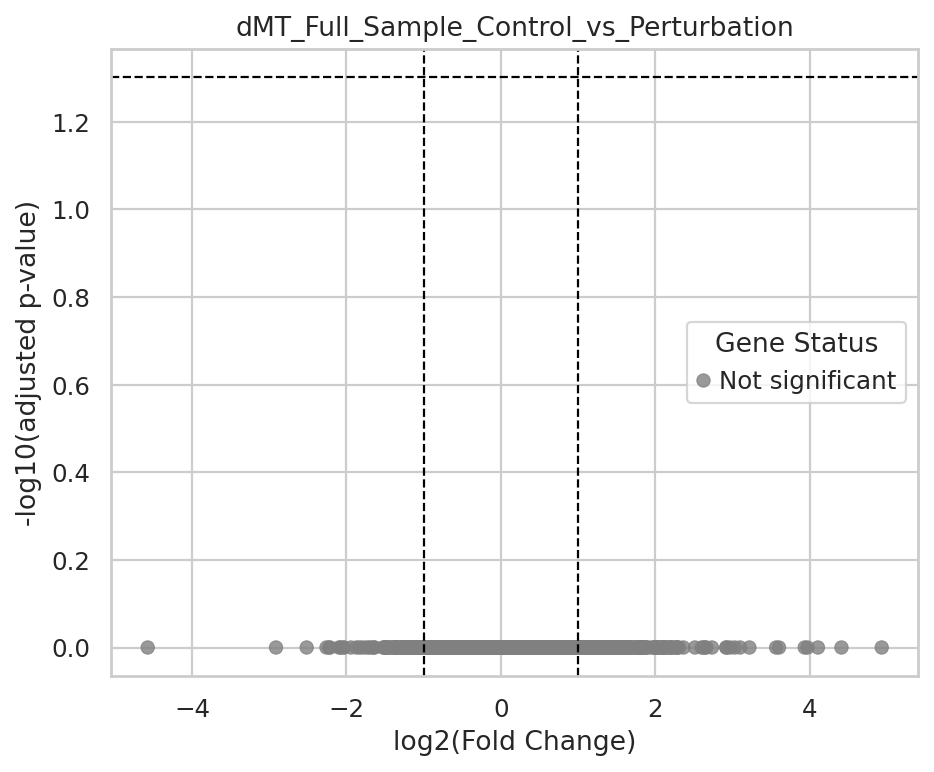


mEC
Cell counts: [44, 24, 46, 48]
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.33 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.38 seconds.

Fitting LFCs...
... done in 0.24 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.13 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        8.647184       -0.213008  1.013862 -0.210096  0.833593       NaN
Alg-2      28.572244       -0.379730  0.667981 -0.568474  0.569713  0.996788
Tim17b     31.995774       -0.983806  0.660160 -1.490254  0.136157  0.996788
CG41128    11.239537       -1.247243  0.933501 -1.336092  0.181519  0.996788
Gfat1       5.619337       -2.279416  1.414023 -1.612008  0.106960       NaN
...              ...             ...       ...       ...       ...       ...
mt:ND4     57.553665       -0.490237  0.570652 -0.859083  0.390295  0.996788
mt:ND4L    15.446356       -1.051783  0.836235 -1.257760  0.208479  0.996788
mt:ND6     16.664232       -0.384202  0.797053 -0.482028  0.629786  0.996788
mt:Cyt-b  790.901010       -0.344628  0.490556 -0.702526  0.482351  0.996788
mt:ND1     40.015547       -0.532802  0.614386 -0.867210  0.385827  0.996788

[2530 rows x 6

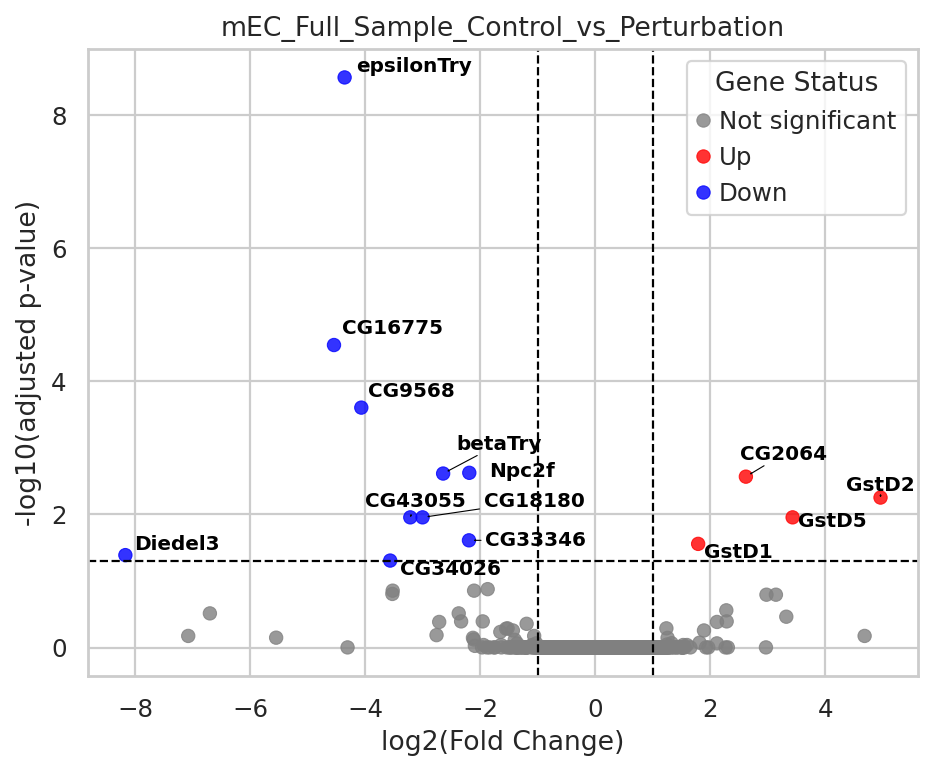


pEC
Cell counts: [402, 527, 219, 451]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.79 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.88 seconds.

Fitting LFCs...
... done in 0.63 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.29 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        67.993300       -0.729146  0.478124 -1.525014  0.127256  0.792773
Alg-2      216.709669       -0.385915  0.374235 -1.031210  0.302442  0.945489
Tim17b     279.063319       -0.429124  0.379891 -1.129598  0.258646  0.916068
CG41128     86.745763       -0.774440  0.486636 -1.591417  0.111516  0.753638
CG41099     37.905257       -0.231006  0.530125 -0.435757  0.663013  0.995562
...               ...             ...       ...       ...       ...       ...
mt:ND4     739.004546        0.076547  0.354816  0.215737  0.829193  0.995562
mt:ND4L    161.754201       -0.582759  0.429814 -1.355840  0.175150  0.855834
mt:ND6     218.395816       -0.682999  0.474476 -1.439482  0.150014  0.826252
mt:Cyt-b  9433.472476       -0.033859  0.420083 -0.080600  0.935760  0.999801
mt:ND1     447.310618       -0.147438  0.383091 -0.384864  0.700338  0.995562

[5

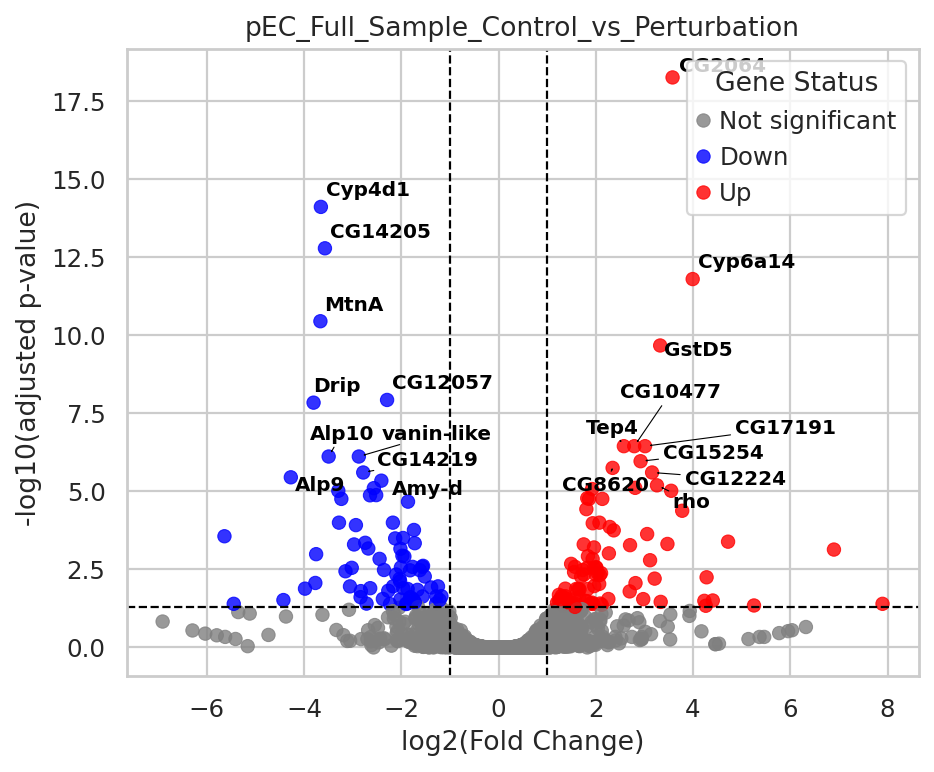


ISC/EB
Cell counts: [1917, 2421, 3251, 3335]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.16 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.16 seconds.

Fitting LFCs...
... done in 0.63 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.39 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Myo81F        85.516875       -0.096366  0.483829 -0.199175  0.842126   
Pzl           29.448333       -0.849962  0.683123 -1.244231  0.213414   
Parp        3324.065883       -0.240816  0.335462 -0.717864  0.472841   
Alg-2       1962.433133       -0.152222  0.336357 -0.452560  0.650866   
Tim17b      3371.157113       -0.032076  0.335404 -0.095633  0.923812   
...                 ...             ...       ...       ...       ...   
mt:ND4      9394.714885       -0.518570  0.395164 -1.312292  0.189422   
mt:ND4L     3304.605626       -0.934618  0.387727 -2.410506  0.015930   
mt:ND6      3394.844159       -0.943433  0.450299 -2.095125  0.036160   
mt:Cyt-b  104225.408587       -0.661070  0.446697 -1.479908  0.138898   
mt:ND1      4974.241225       -0.617135  0.412472 -1.496187  0.134605   

              padj  
Myo81F    0.999909  
Pzl       0.999909  

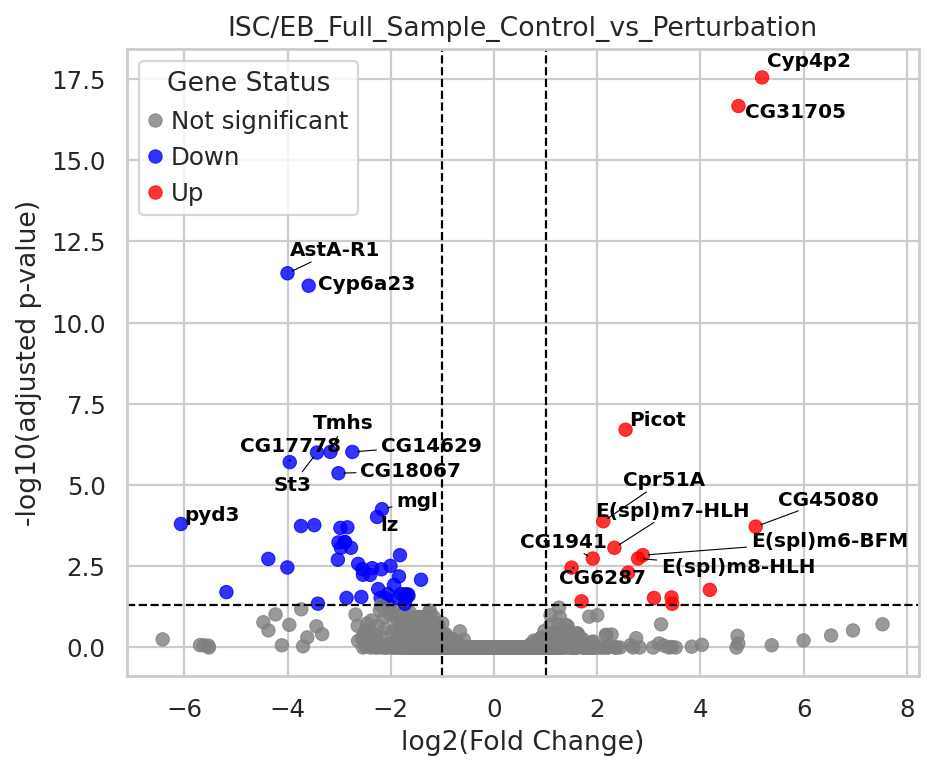

In [26]:
results_df_given_comparison = {}
n_cells_given_comparison = {}
metadata = pd.DataFrame([rl.split()[-1] for rl in run_labels], index=run_labels, columns=['condition'])
for ct in cluster_celltypes:
    fig_title = f'{ct}: Full Sample Control vs Perturbation'
    comparison = fig_title.replace(':', '').replace(' ', '_')
    print(ct)
    X = np.zeros((4, raw_comb_adata.X.shape[1]))
    n_cells = []
    for i, run_label in enumerate(run_labels):
        tmp = raw_comb_adata[raw_comb_adata.obs['batch'] == run_label]
        tmp = tmp[np.isin(tmp.obs['celltype'], ct.split('/'))]
        n_cells.append(len(tmp))
        X[i] = tmp.X.sum(axis=0)
    n_cells_given_comparison[comparison] = n_cells
    print(f'Cell counts: {n_cells}')
    if min(n_cells) < min_cells_per_condition:
        print('Insufficient cells')
        continue

    counts_df = pd.DataFrame(X, index=run_labels, columns=tmp.var.index)
    counts_df = counts_df[counts_df.columns[counts_df.max() > min_max_reads_per_gene]]

    inference = DefaultInference(n_cpus=4)
    dds = DeseqDataSet(
        counts=counts_df,
        metadata=metadata,
        design="~condition",  # compare samples based on the "condition"
        refit_cooks=True,
        inference=inference,
        n_cpus=4,
    )

    dds.deseq2()

    ds = DeseqStats(dds, contrast=['condition', 'LamC', 'ctrl'], inference=inference)
    ds.summary()
    results_df = ds.results_df
    results_df_given_comparison[comparison] = results_df
    plot_volcano(results_df, fig_title=comparison)

    print()

## Pert vs. Pert

### Straight wt-het-hom

CC
Cell counts: [16, 2, 7, 1]
Insufficient cells
CC
Cell counts: [16, 5, 7, 3]
Insufficient cells
CC
Cell counts: [2, 5, 1, 3]
Insufficient cells
CC
Cell counts: [16, 7, 7, 4]
Insufficient cells
EB
Cell counts: [1, 10, 5, 11]
Insufficient cells
EB
Cell counts: [1, 396, 5, 498]
Insufficient cells
EB
Cell counts: [10, 396, 11, 498]


/scratch/jobs/60613130/ipykernel_3196038/1708537703.py:16: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['het_hom_status'], ['het', 'hom'])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.00 seconds.

Fitting dispersion trend curve...
/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:805: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.10 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.03 seconds.

Fitting LFCs...
... done in 0.62 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.31 seconds.



Log2 fold change & Wald test p-value: condition hom vs het
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       3.377948        0.081051  1.510069  0.053674  0.957195  0.999999
Parp       109.501779        0.301310  0.414553  0.726832  0.467329  0.999999
Alg-2       96.482954       -0.418845  0.411563 -1.017692  0.308824  0.999999
Tim17b     163.617497       -0.121224  0.388845 -0.311756  0.755226  0.999999
CG41128     58.039180       -0.275654  0.648633 -0.424977  0.670854  0.999999
...               ...             ...       ...       ...       ...       ...
mt:ND4     326.388840        0.083360  0.363691  0.229205  0.818710  0.999999
mt:ND4L    116.890163       -0.196454  0.394581 -0.497880  0.618569  0.999999
mt:ND6     119.556285       -0.450287  0.415421 -1.083930  0.278396  0.999999
mt:Cyt-b  3596.818314        0.042003  0.467602  0.089826  0.928425  0.999999
mt:ND1     164.260779        0.299132  0.511324  0.585015  0.558538  0.999999

[661

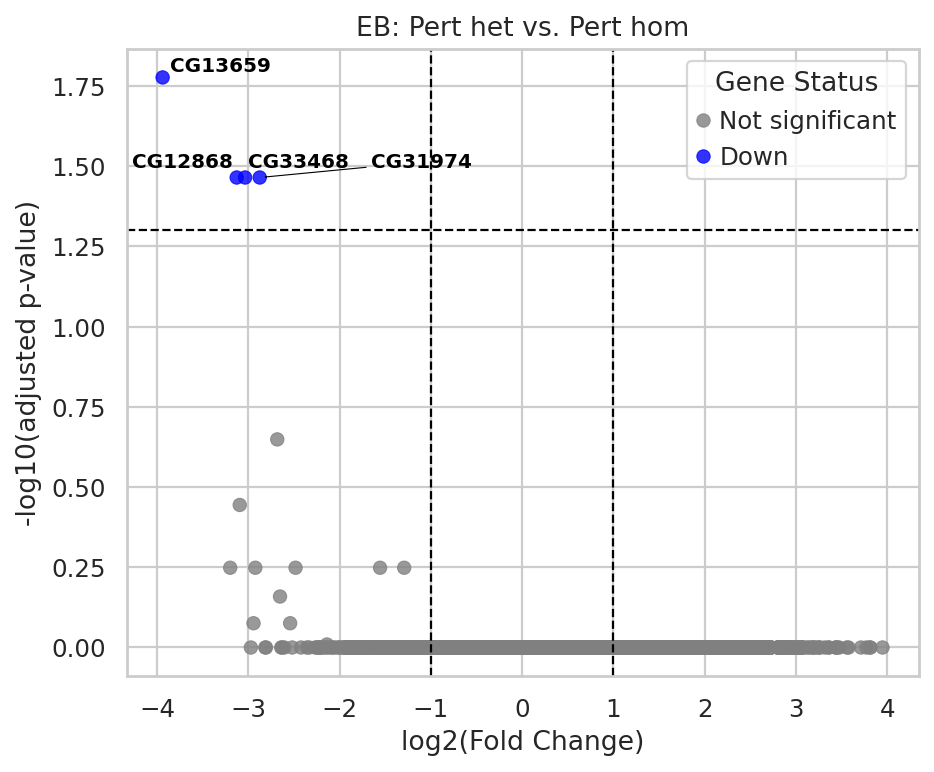


EB
Cell counts: [1, 406, 5, 509]
Insufficient cells
EE
Cell counts: [0, 1, 0, 0]
Insufficient cells
EE
Cell counts: [0, 11, 0, 23]
Insufficient cells
EE
Cell counts: [1, 11, 0, 23]
Insufficient cells
EE
Cell counts: [0, 12, 0, 23]
Insufficient cells
EEP
Cell counts: [0, 1, 0, 0]
Insufficient cells
EEP
Cell counts: [0, 25, 0, 34]
Insufficient cells
EEP
Cell counts: [1, 25, 0, 34]
Insufficient cells
EEP
Cell counts: [0, 26, 0, 34]
Insufficient cells
ISC
Cell counts: [3, 10, 6, 2]
Insufficient cells
ISC
Cell counts: [3, 489, 6, 653]
Insufficient cells
ISC
Cell counts: [10, 489, 2, 653]
Insufficient cells
ISC
Cell counts: [3, 499, 6, 655]
Insufficient cells
LFC
Cell counts: [0, 3, 1, 0]
Insufficient cells
LFC
Cell counts: [0, 25, 1, 28]
Insufficient cells
LFC
Cell counts: [3, 25, 0, 28]
Insufficient cells
LFC
Cell counts: [0, 28, 1, 28]
Insufficient cells
MT


/scratch/jobs/60613130/ipykernel_3196038/1708537703.py:16: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['het_hom_status'], ['het', 'hom'])]


Cell counts: [9, 1, 16, 3]
Insufficient cells
MT
Cell counts: [9, 12, 16, 12]
Insufficient cells
MT
Cell counts: [1, 12, 3, 12]
Insufficient cells
MT
Cell counts: [9, 13, 16, 15]
Insufficient cells
VM
Cell counts: [1, 1, 0, 1]
Insufficient cells
VM
Cell counts: [1, 10, 0, 7]
Insufficient cells
VM
Cell counts: [1, 10, 1, 7]
Insufficient cells
VM
Cell counts: [1, 11, 0, 8]
Insufficient cells
aEC
Cell counts: [1, 4, 0, 1]
Insufficient cells
aEC
Cell counts: [1, 36, 0, 20]
Insufficient cells
aEC
Cell counts: [4, 36, 1, 20]
Insufficient cells
aEC
Cell counts: [1, 40, 0, 21]
Insufficient cells
dEC
Cell counts: [2, 11, 9, 2]
Insufficient cells
dEC
Cell counts: [2, 188, 9, 248]
Insufficient cells
dEC
Cell counts: [11, 188, 2, 248]
Insufficient cells
dEC
Cell counts: [2, 199, 9, 250]
Insufficient cells
dMT
Cell counts: [0, 1, 0, 1]
Insufficient cells
dMT
Cell counts: [0, 48, 0, 65]
Insufficient cells
dMT
Cell counts: [1, 48, 1, 65]
Insufficient cells
dMT
Cell counts: [0, 49, 0, 66]
Insufficient

Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.26 seconds.

Fitting dispersion trend curve...
/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:805: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.10 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.06 seconds.

Fitting LFCs...
... done in 0.61 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.31 seconds.



Log2 fold change & Wald test p-value: condition hom vs het
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       6.241335       -0.291441  1.107611 -0.263126  0.792454  0.999501
Parp       198.001204        0.123366  0.401239  0.307462  0.758492  0.999501
Alg-2      148.840171       -0.460897  0.386691 -1.191899  0.233301  0.999501
Tim17b     238.364833       -0.037293  0.364633 -0.102276  0.918538  0.999501
CG41128     81.521613       -0.167533  0.592708 -0.282658  0.777439  0.999501
...               ...             ...       ...       ...       ...       ...
mt:ND4     545.575002       -0.086603  0.359899 -0.240633  0.809840  0.999501
mt:ND4L    177.363980       -0.257079  0.378072 -0.679975  0.496520  0.999501
mt:ND6     175.192346       -0.297856  0.386791 -0.770069  0.441259  0.999501
mt:Cyt-b  5621.864896        0.035479  0.433494  0.081845  0.934770  0.999501
mt:ND1     257.343269        0.144569  0.462812  0.312370  0.754759  0.999501

[695

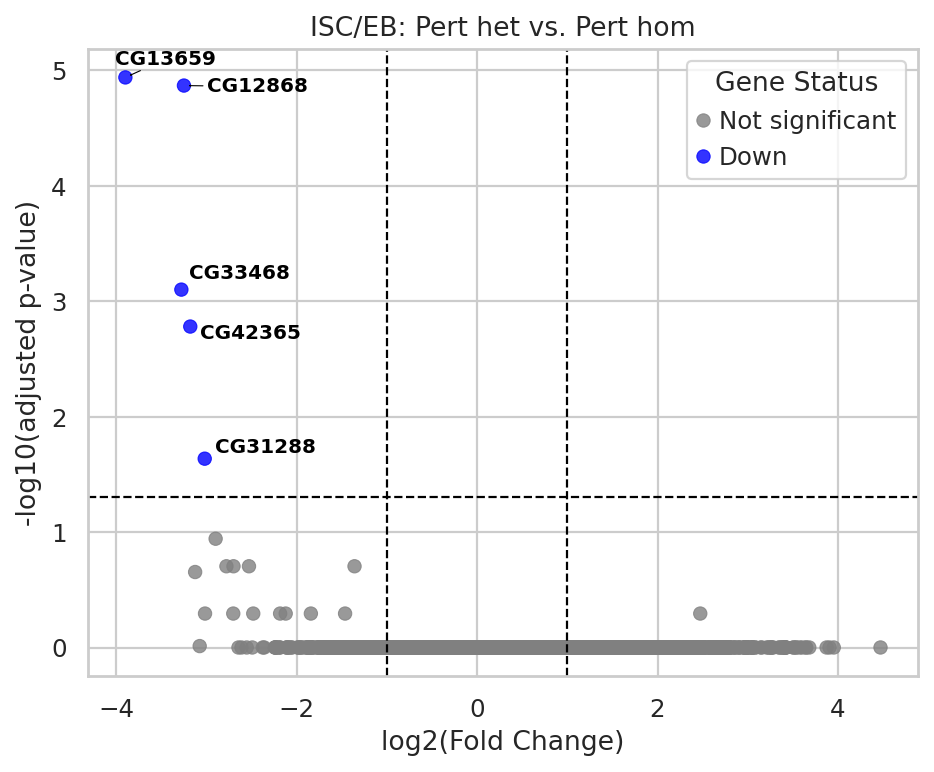


ISC/EB
Cell counts: [4, 905, 11, 1164]
Insufficient cells


/scratch/jobs/60613130/ipykernel_3196038/1708537703.py:16: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['het_hom_status'], ['het', 'hom'])]


In [27]:
pert_run_labels = [rl for rl in run_labels if 'ctrl' not in rl]
for ct in cluster_celltypes:
    for comp_vals in [('wt', 'het'), ('wt', 'hom'), ('het', 'hom'), ('wt', 'mut')]:
        fig_title = f'{ct}: Pert {comp_vals[0]} vs. Pert {comp_vals[1]}'
        comparison = fig_title.replace(':', '').replace(' ', '_')
        print(ct)
        X = np.zeros((4, raw_comb_adata.X.shape[1]))
        n_cells = []
        meta_index, meta_vals = [], []
        i = 0
        for run_label in pert_run_labels:
            for comp_val in comp_vals:
                tmp = raw_comb_adata[raw_comb_adata.obs['batch'] == run_label]
                tmp = tmp[np.isin(tmp.obs['celltype'], ct.split('/'))]
                if comp_val == 'mut':
                    tmp = tmp[np.in1d(tmp.obs['het_hom_status'], ['het', 'hom'])]
                else:
                    tmp = tmp[tmp.obs['het_hom_status'] == comp_val]
                meta_index.append(f'{run_label} {comp_val}')
                meta_vals.append(comp_val)
                n_cells.append(len(tmp))
                X[i] = tmp.X.sum(axis=0)
                i += 1
        metadata = pd.DataFrame(meta_vals, index=meta_index, columns=['condition'])
        n_cells_given_comparison[comparison] = n_cells
        print(f'Cell counts: {n_cells}')
        if min(n_cells) < min_cells_per_condition:
            print('Insufficient cells')
            continue
    
        counts_df = pd.DataFrame(X, index=meta_index, columns=tmp.var.index)
        counts_df = counts_df[counts_df.columns[counts_df.max() > min_max_reads_per_gene]]
    
        inference = DefaultInference(n_cpus=4)
        dds = DeseqDataSet(
            counts=counts_df,
            metadata=metadata,
            design="~condition",  # compare samples based on the "condition"
            refit_cooks=True,
            inference=inference,
            n_cpus=4,
        )
    
        dds.deseq2()

        ref_name, var_name = comp_vals
        ds = DeseqStats(dds, contrast=['condition', var_name, ref_name], inference=inference)
        ds.summary()
        results_df = ds.results_df
        results_df_given_comparison[comparison] = results_df
        plot_volcano(results_df, fig_title=fig_title)
    
        print()


### Wt-like and Het-like

CC
Cell counts: [18, 4, 7, 2]
Insufficient cells
CC
Cell counts: [18, 1, 7, 2]
Insufficient cells
CC
Cell counts: [4, 1, 2, 2]
Insufficient cells
CC
Cell counts: [18, 5, 7, 4]
Insufficient cells
EB
Cell counts: [158, 156, 211, 198]


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.74 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.89 seconds.

Fitting LFCs...
... done in 0.63 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.28 seconds.



Log2 fold change & Wald test p-value: condition het vs wt
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       8.268998        0.271404  0.956782  0.283663  0.776669  0.999988
Parp       287.930827       -0.060227  0.267807 -0.224891  0.822064  0.999988
Alg-2      193.690205        0.028853  0.288046  0.100167  0.920212  0.999988
Tim17b     373.294212        0.126574  0.261315  0.484372  0.628122  0.999988
CG41128    120.940275       -0.104596  0.421331 -0.248251  0.803940  0.999988
...               ...             ...       ...       ...       ...       ...
mt:ND4     797.690350       -0.035782  0.249740 -0.143279  0.886070  0.999988
mt:ND4L    268.670944       -0.096946  0.268830 -0.360621  0.718383  0.999988
mt:ND6     243.014880       -0.181192  0.276538 -0.655218  0.512327  0.999988
mt:Cyt-b  8810.579240       -0.195647  0.270765 -0.722571  0.469943  0.999988
mt:ND1     420.658629       -0.162372  0.277489 -0.585149  0.558448  0.999988

[6075

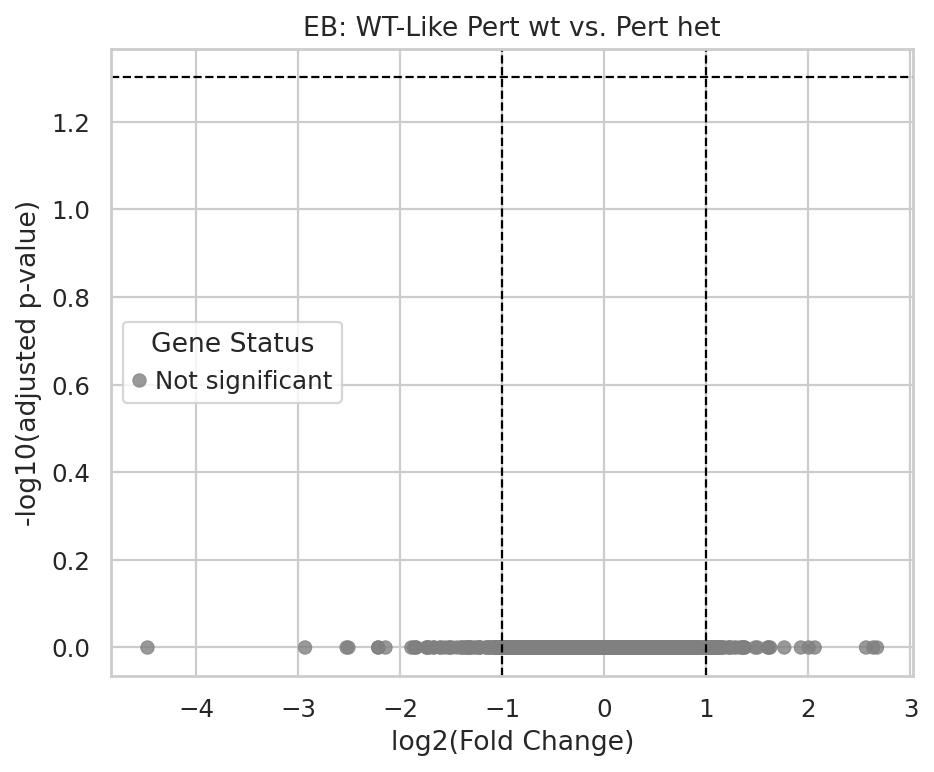


EB
Cell counts: [158, 93, 211, 105]


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.77 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.88 seconds.

Fitting LFCs...
... done in 0.50 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.29 seconds.



Log2 fold change & Wald test p-value: condition hom vs wt
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp       219.763541       -0.035906  0.307573 -0.116739  0.907067  0.999834
Alg-2      152.952738        0.146555  0.325180  0.450690  0.652213  0.999834
Tim17b     279.654943        0.098749  0.307712  0.320915  0.748275  0.999834
CG41128    100.987163        0.172718  0.455847  0.378894  0.704767  0.999834
CG41099     38.698380        0.057410  0.501040  0.114581  0.908777  0.999834
...               ...             ...       ...       ...       ...       ...
mt:ND4     619.876249        0.036104  0.293675  0.122939  0.902156  0.999834
mt:ND4L    195.702627       -0.216219  0.310155 -0.697132  0.485720  0.999834
mt:ND6     188.253934       -0.115834  0.331426 -0.349502  0.726712  0.999834
mt:Cyt-b  6848.817805       -0.119346  0.319664 -0.373346  0.708891  0.999834
mt:ND1     345.391634        0.071007  0.333305  0.213040  0.831296  0.999834

[5918

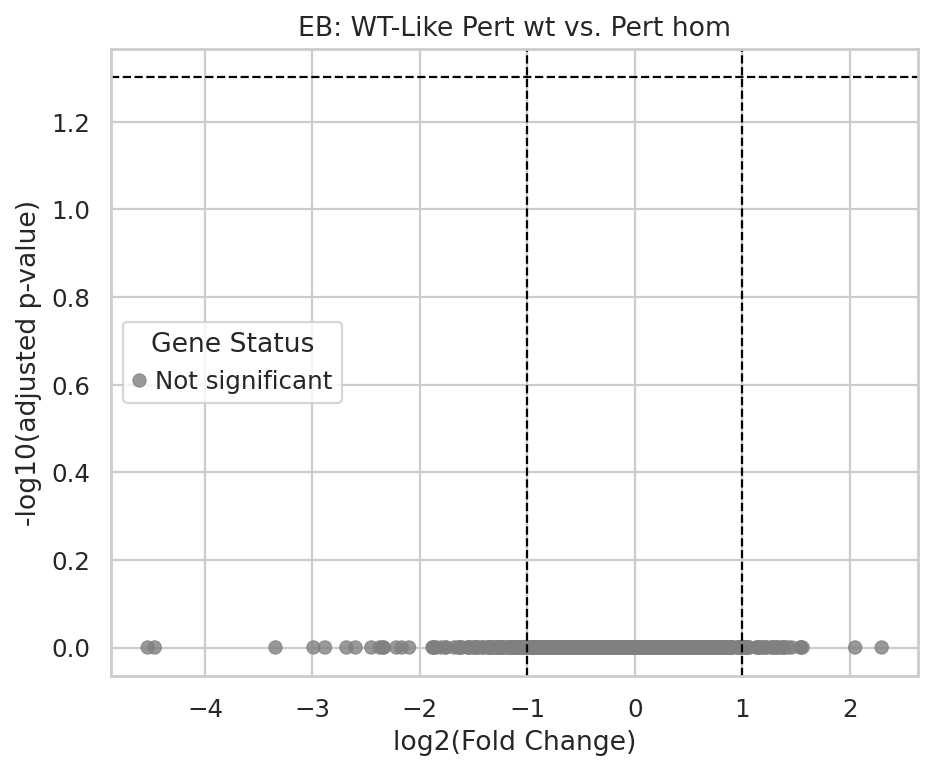


EB
Cell counts: [156, 93, 198, 105]


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.74 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.86 seconds.

Fitting LFCs...
... done in 0.49 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.28 seconds.



Log2 fold change & Wald test p-value: condition hom vs het
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       5.722954       -0.576222  1.118749 -0.515059  0.606512  0.999941
Parp       218.466295        0.027510  0.302748  0.090866  0.927599  0.999941
Alg-2      156.747718        0.120887  0.318257  0.379843  0.704062  0.999941
Tim17b     296.548611       -0.025041  0.302661 -0.082737  0.934061  0.999941
CG41128     98.965322        0.281908  0.442560  0.636993  0.524129  0.999941
...               ...             ...       ...       ...       ...       ...
mt:ND4     620.914898        0.076202  0.277182  0.274915  0.783381  0.999941
mt:ND4L    191.612844       -0.115708  0.303716 -0.380976  0.703221  0.999941
mt:ND6     179.113378        0.069725  0.323806  0.215330  0.829510  0.999941
mt:Cyt-b  6487.299704        0.080528  0.294298  0.273627  0.784371  0.999941
mt:ND1     331.893744        0.238215  0.311594  0.764507  0.444565  0.999941

[590

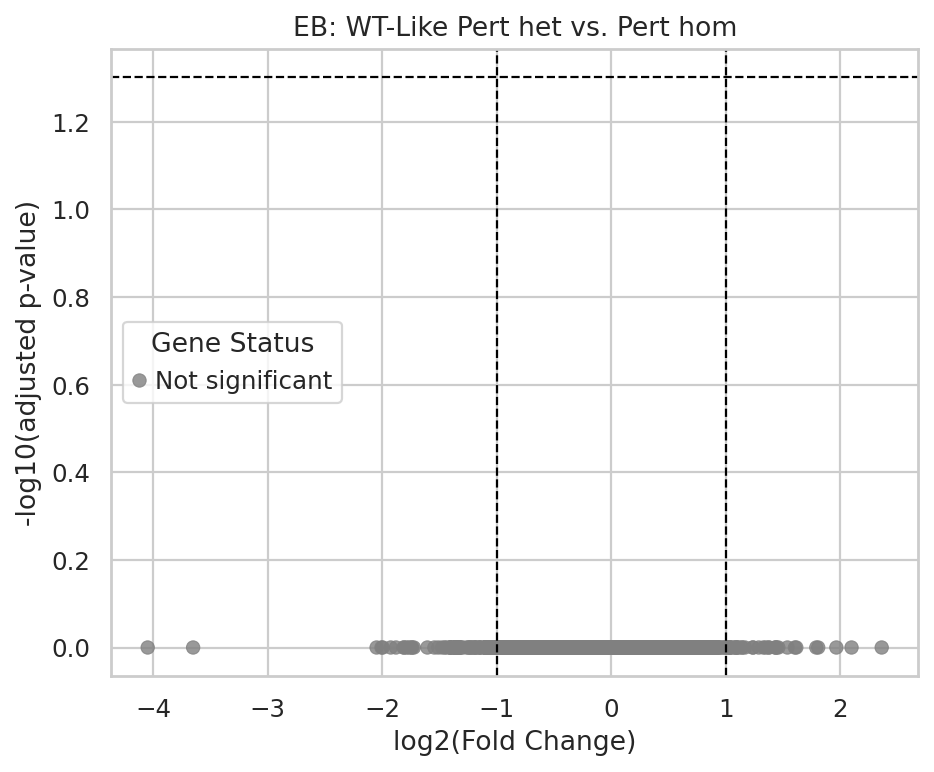


EB
Cell counts: [158, 249, 211, 303]


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.80 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.94 seconds.

Fitting LFCs...
... done in 0.66 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.30 seconds.



Log2 fold change & Wald test p-value: condition mut vs wt
              baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
Myo81F        9.770535        0.087219  0.896771  0.097259  0.922521  0.99998
Parp        362.252920       -0.068466  0.265530 -0.257848  0.796524  0.99998
Alg-2       247.023608        0.059417  0.283328  0.209711  0.833893  0.99998
Tim17b      465.810914        0.096161  0.258422  0.372108  0.709812  0.99998
CG41128     157.578714       -0.004439  0.415411 -0.010685  0.991475  0.99998
...                ...             ...       ...       ...       ...      ...
mt:ND4     1012.547271       -0.018251  0.257995 -0.070742  0.943603  0.99998
mt:ND4L     332.935589       -0.152341  0.268806 -0.566732  0.570896  0.99998
mt:ND6      308.440678       -0.164189  0.277457 -0.591763  0.554010  0.99998
mt:Cyt-b  11185.220761       -0.175824  0.284944 -0.617047  0.537204  0.99998
mt:ND1      545.594450       -0.078961  0.286953 -0.275170  0.783185  0.99998

[6343

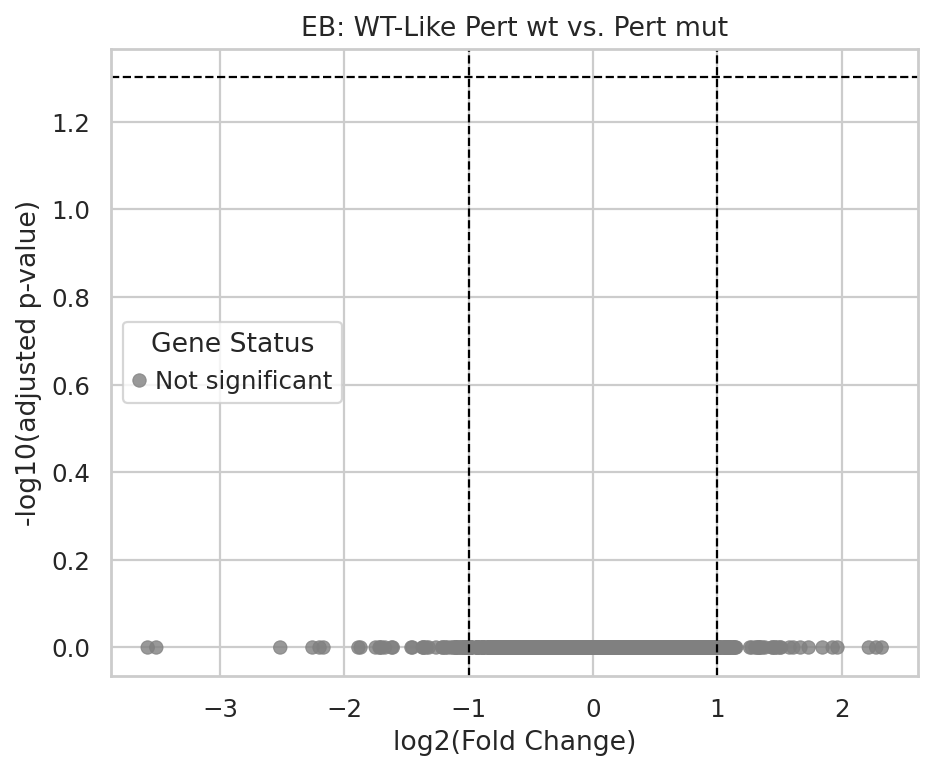


EE
Cell counts: [7, 3, 8, 7]
Insufficient cells
EE
Cell counts: [7, 2, 8, 8]
Insufficient cells
EE
Cell counts: [3, 2, 7, 8]
Insufficient cells
EE
Cell counts: [7, 5, 8, 15]
Insufficient cells
EEP
Cell counts: [11, 12, 10, 9]
Insufficient cells
EEP
Cell counts: [11, 3, 10, 15]
Insufficient cells
EEP
Cell counts: [12, 3, 9, 15]
Insufficient cells
EEP
Cell counts: [11, 15, 10, 24]
Using None as control genes, passed at DeseqDataSet initialization


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting dispersion trend curve...
... done in 0.03 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.25 seconds.

Fitting LFCs...
... done in 0.15 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...


Log2 fold change & Wald test p-value: condition mut vs wt
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp       13.417667        0.755234  0.747817  1.009918  0.312534  0.999229
Alg-2       9.223633        0.208849  0.869778  0.240118  0.810239  0.999229
Tim17b     13.425604        0.208993  0.735072  0.284316  0.776168  0.999229
lost       34.090697        0.049777  0.492503  0.101070  0.919495  0.999229
eIF3a      18.179769        0.084858  0.634038  0.133837  0.893531  0.999229
...              ...             ...       ...       ...       ...       ...
mt:ND4     31.898611       -0.048260  0.522408 -0.092379  0.926397  0.999229
mt:ND4L     9.503610        0.819520  0.883409  0.927679  0.353574  0.999229
mt:ND6     12.192564        0.304091  0.806359  0.377116  0.706088  0.999229
mt:Cyt-b  403.080387        0.016977  0.271335  0.062569  0.950109  0.999229
mt:ND1     16.456574       -0.286112  0.659489 -0.433839  0.664405  0.999229

[1561 rows x 6 co

... done in 0.09 seconds.



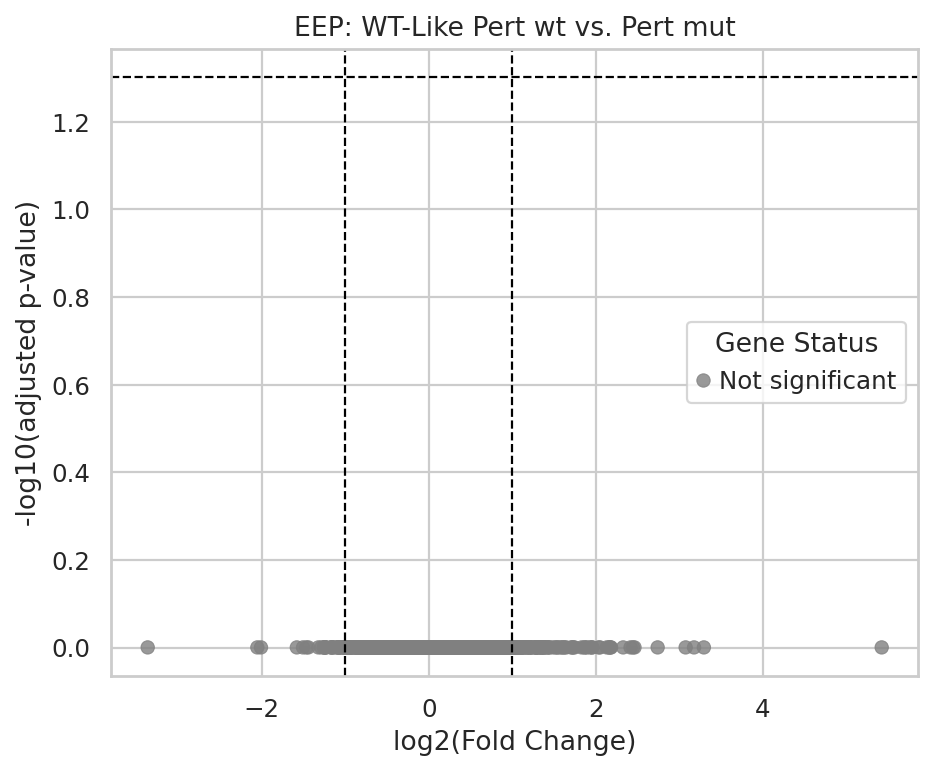

/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]



ISC
Cell counts: [193, 190, 277, 240]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.75 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.87 seconds.

Fitting LFCs...
... done in 0.65 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.30 seconds.



Log2 fold change & Wald test p-value: condition het vs wt
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       8.591145        0.221168  0.910193  0.242991  0.808013  0.999837
Parp       282.671523        0.022431  0.289105  0.077587  0.938157  0.999837
Alg-2      143.646366        0.044282  0.345941  0.128005  0.898145  0.999837
Tim17b     259.737850       -0.016507  0.306130 -0.053920  0.956999  0.999837
CG41128     81.251547       -0.019861  0.475023 -0.041810  0.966650  0.999837
...               ...             ...       ...       ...       ...       ...
mt:ND4     649.143986       -0.053806  0.269479 -0.199667  0.841741  0.999837
mt:ND4L    186.579679       -0.039367  0.316093 -0.124543  0.900885  0.999837
mt:ND6     194.863393        0.001801  0.327432  0.005502  0.995610  0.999837
mt:Cyt-b  6837.686897       -0.064825  0.301573 -0.214957  0.829801  0.999837
mt:ND1     308.546351       -0.110413  0.291767 -0.378427  0.705113  0.999837

[5963

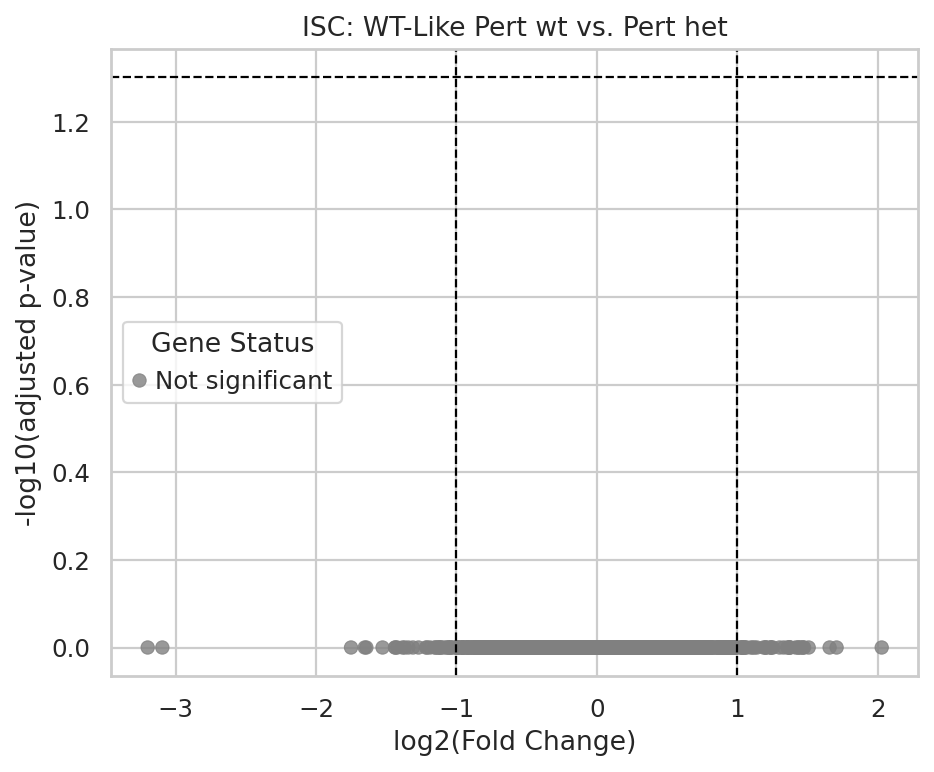


ISC
Cell counts: [193, 119, 277, 144]


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.75 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.86 seconds.

Fitting LFCs...
... done in 0.48 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.28 seconds.



Log2 fold change & Wald test p-value: condition hom vs wt
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       5.596157       -0.289191  1.096315 -0.263784  0.791946  0.999994
Parp       215.814352       -0.032746  0.309857 -0.105682  0.915835  0.999994
Alg-2      118.225529        0.191886  0.355031  0.540476  0.588869  0.999994
Tim17b     222.627589        0.249660  0.314510  0.793807  0.427308  0.999994
CG41128     70.948964        0.292722  0.449312  0.651490  0.514730  0.999994
...               ...             ...       ...       ...       ...       ...
mt:ND4     518.715556        0.017395  0.285059  0.061024  0.951340  0.999994
mt:ND4L    144.628601       -0.055980  0.331944 -0.168641  0.866079  0.999994
mt:ND6     148.716775       -0.063963  0.350449 -0.182518  0.855176  0.999994
mt:Cyt-b  5495.948794        0.023019  0.313797  0.073356  0.941523  0.999994
mt:ND1     249.719218       -0.001536  0.308955 -0.004972  0.996033  0.999994

[5844

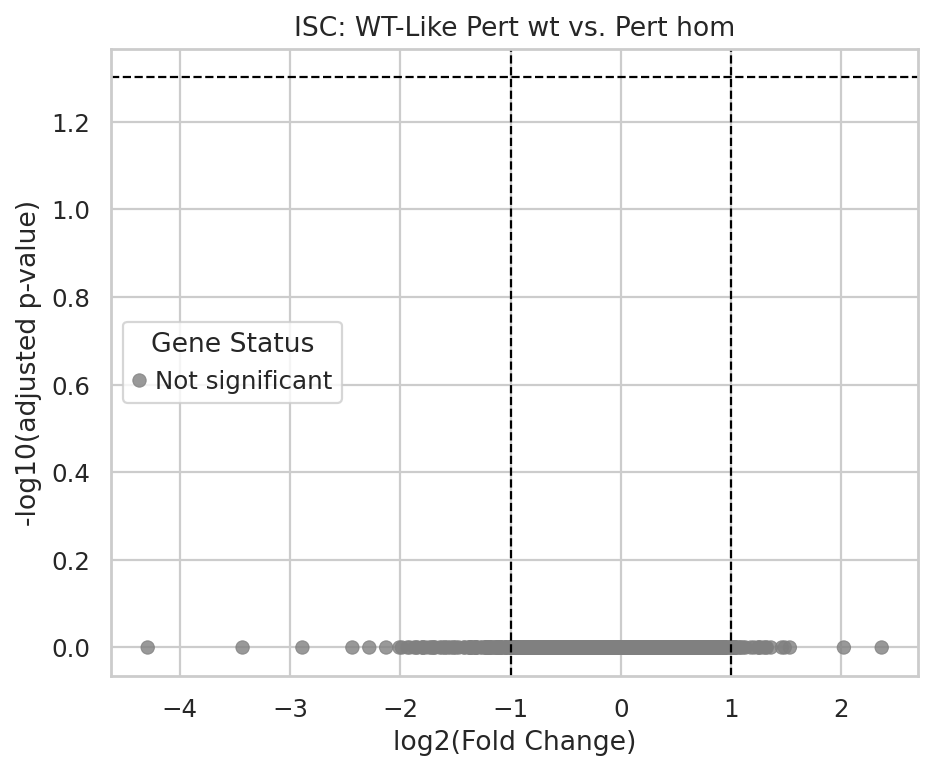


ISC
Cell counts: [190, 119, 240, 144]


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.73 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.86 seconds.

Fitting LFCs...
... done in 0.61 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.28 seconds.



Log2 fold change & Wald test p-value: condition hom vs het
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp       213.092199       -0.057090  0.304752 -0.187333  0.851399  0.999797
Alg-2      117.599549        0.145609  0.349523  0.416594  0.676975  0.999797
Tim17b     216.938012        0.264557  0.311101  0.850387  0.395110  0.999797
CG41128     68.932561        0.309034  0.479715  0.644204  0.519443  0.999797
CG41099     43.788053        0.029753  0.457684  0.065008  0.948167  0.999797
...               ...             ...       ...       ...       ...       ...
mt:ND4     498.309103        0.069731  0.275245  0.253343  0.800003  0.999797
mt:ND4L    139.682821       -0.018198  0.331749 -0.054854  0.956255  0.999797
mt:ND6     145.263882       -0.066516  0.329943 -0.201600  0.840230  0.999797
mt:Cyt-b  5262.195377        0.086226  0.293431  0.293853  0.768870  0.999797
mt:ND1     235.244290        0.107454  0.301498  0.356401  0.721540  0.999797

[568

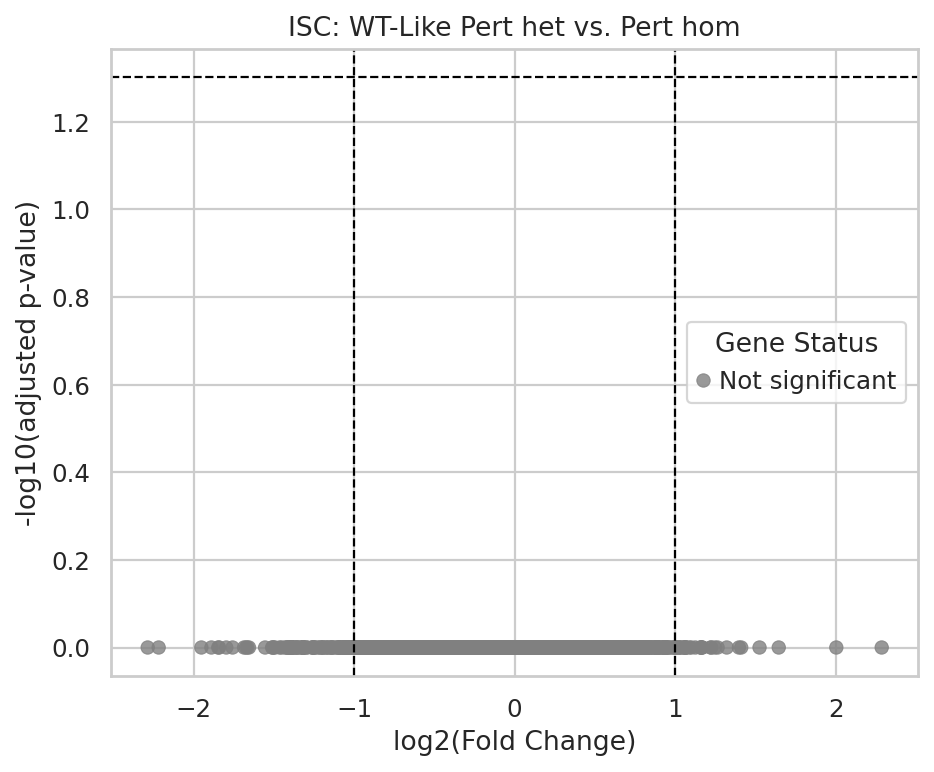


ISC
Cell counts: [193, 309, 277, 384]


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.80 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.93 seconds.

Fitting LFCs...
... done in 0.52 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.29 seconds.



Log2 fold change & Wald test p-value: condition mut vs wt
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F      10.252927        0.037477  0.839547  0.044640  0.964394  0.999973
Parp       356.768935       -0.012452  0.283630 -0.043901  0.964984  0.999973
Alg-2      186.278494        0.081723  0.326857  0.250026  0.802567  0.999973
Tim17b     342.680078        0.073276  0.298543  0.245446  0.806111  0.999973
CG41128    107.942754        0.101521  0.434499  0.233651  0.815256  0.999973
...               ...             ...       ...       ...       ...       ...
mt:ND4     832.585017       -0.041520  0.268444 -0.154670  0.877081  0.999973
mt:ND4L    236.588547       -0.063578  0.304078 -0.209083  0.834383  0.999973
mt:ND6     245.573876       -0.035725  0.318717 -0.112089  0.910753  0.999973
mt:Cyt-b  8786.447120       -0.045218  0.303577 -0.148950  0.881593  0.999973
mt:ND1     397.739648       -0.082572  0.286205 -0.288505  0.772960  0.999973

[6238

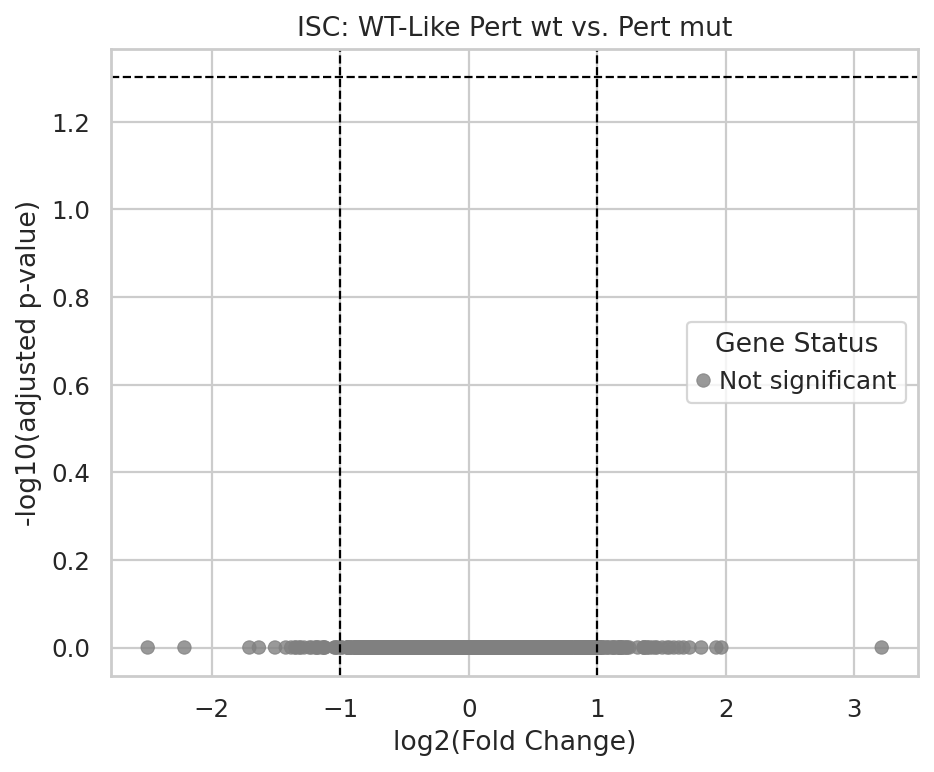


LFC
Cell counts: [12, 8, 8, 9]
Insufficient cells
LFC
Cell counts: [12, 8, 8, 12]
Insufficient cells
LFC
Cell counts: [8, 8, 9, 12]
Insufficient cells
LFC
Cell counts: [12, 16, 8, 21]
Insufficient cells
MT
Cell counts: [15, 7, 22, 9]
Insufficient cells
MT


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]


Cell counts: [15, 0, 22, 0]
Insufficient cells
MT
Cell counts: [7, 0, 9, 0]
Insufficient cells
MT
Cell counts: [15, 7, 22, 9]
Insufficient cells
VM
Cell counts: [5, 5, 2, 3]
Insufficient cells
VM
Cell counts: [5, 2, 2, 3]
Insufficient cells
VM
Cell counts: [5, 2, 3, 3]
Insufficient cells
VM
Cell counts: [5, 7, 2, 6]
Insufficient cells
aEC
Cell counts: [14, 18, 3, 8]
Insufficient cells
aEC
Cell counts: [14, 9, 3, 10]
Insufficient cells
aEC
Cell counts: [18, 9, 8, 10]
Insufficient cells
aEC
Cell counts: [14, 27, 3, 18]
Insufficient cells
dEC
Cell counts: [83, 82, 111, 90]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.85 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.95 seconds.

Fitting LFCs...
... done in 0.50 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.30 seconds.



Log2 fold change & Wald test p-value: condition het vs wt
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp       209.526334       -0.078387  0.362764 -0.216084  0.828922  0.999891
Alg-2      325.515475        0.013665  0.334687  0.040830  0.967432  0.999891
Tim17b     396.771379       -0.060753  0.320554 -0.189526  0.849680  0.999891
CG41128    163.431868        0.190353  0.447339  0.425522  0.670456  0.999891
CG41099     54.975624       -0.240198  0.474451 -0.506265  0.612671  0.999891
...               ...             ...       ...       ...       ...       ...
mt:ND4     803.128173       -0.089903  0.305525 -0.294257  0.768561  0.999891
mt:ND4L    257.759394       -0.196306  0.361425 -0.543145  0.587030  0.999891
mt:ND6     223.497224       -0.021281  0.349007 -0.060977  0.951378  0.999891
mt:Cyt-b  8618.602212       -0.094817  0.374749 -0.253016  0.800256  0.999891
mt:ND1     447.170349       -0.043176  0.316485 -0.136424  0.891486  0.999891

[6174

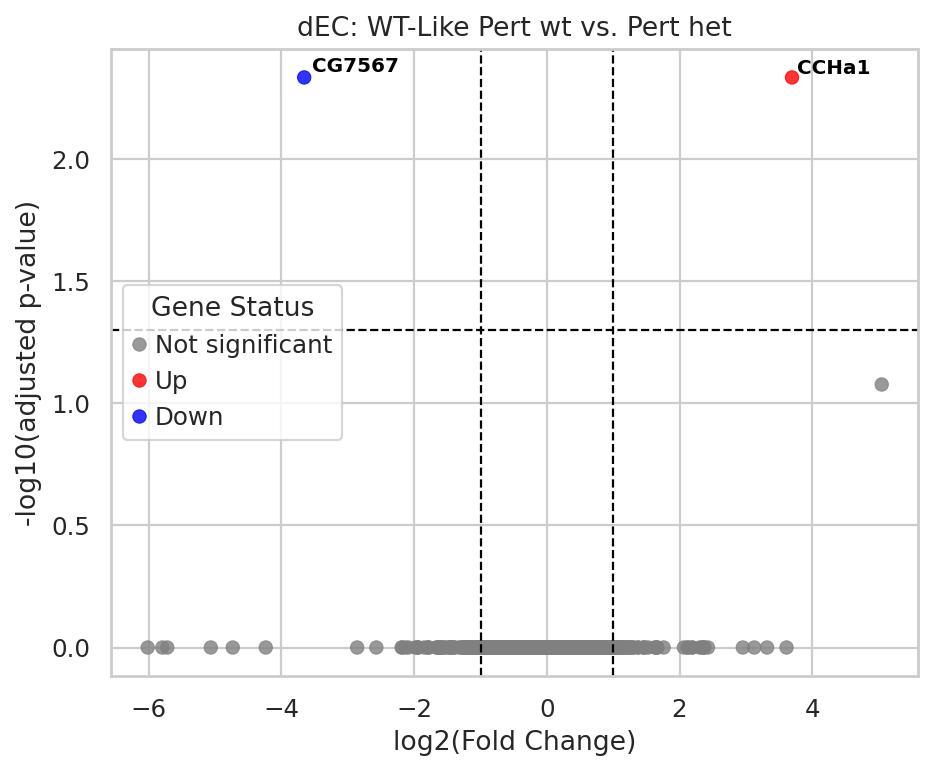


dEC
Cell counts: [83, 36, 111, 58]


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.79 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.89 seconds.

Fitting LFCs...
... done in 0.64 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.30 seconds.



Log2 fold change & Wald test p-value: condition hom vs wt
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp       147.588155       -0.101205  0.378081 -0.267680  0.788946  0.999994
Alg-2      235.910946        0.074714  0.342623  0.218064  0.827380  0.999994
Tim17b     293.195157        0.054856  0.335024  0.163737  0.869938  0.999994
CG41128    119.979130        0.271452  0.456678  0.594406  0.552241  0.999994
CG41099     39.056943       -0.230817  0.527674 -0.437423  0.661805  0.999994
...               ...             ...       ...       ...       ...       ...
mt:ND4     594.801518        0.032285  0.322803  0.100016  0.920331  0.999994
mt:ND4L    180.815734       -0.224504  0.383548 -0.585336  0.558322  0.999994
mt:ND6     159.257097       -0.020284  0.381088 -0.053227  0.957551  0.999994
mt:Cyt-b  6208.668436       -0.050011  0.380071 -0.131583  0.895314  0.999994
mt:ND1     331.970143        0.081008  0.340642  0.237808  0.812030  0.999994

[6055

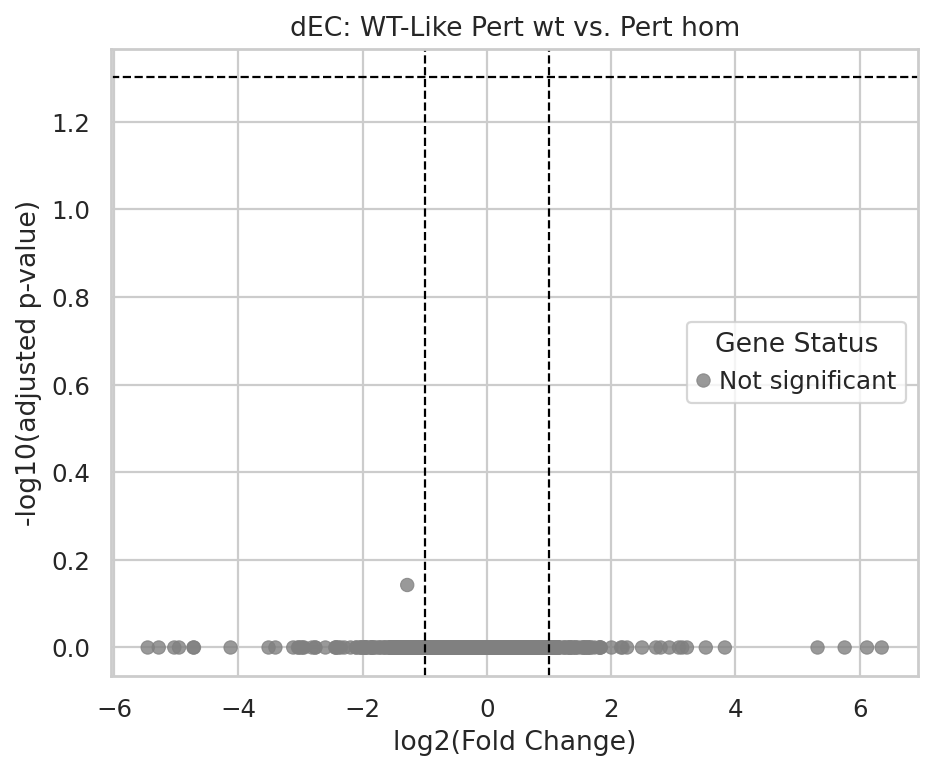


dEC
Cell counts: [82, 36, 90, 58]


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.77 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.87 seconds.

Fitting LFCs...
... done in 0.50 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.29 seconds.



Log2 fold change & Wald test p-value: condition hom vs het
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp       138.122438       -0.032233  0.389750 -0.082702  0.934088  0.999829
Alg-2      228.005670        0.050986  0.360669  0.141365  0.887582  0.999829
Tim17b     276.343507        0.106046  0.345298  0.307115  0.758756  0.999829
CG41128    122.654057        0.070531  0.444217  0.158777  0.873845  0.999829
CG41099     34.467590       -0.001280  0.556428 -0.002300  0.998165  0.999829
...               ...             ...       ...       ...       ...       ...
mt:ND4     555.059538        0.112816  0.335290  0.336473  0.736514  0.999829
mt:ND4L    162.050786       -0.038044  0.385675 -0.098643  0.921422  0.999829
mt:ND6     151.960180       -0.007566  0.390429 -0.019378  0.984539  0.999829
mt:Cyt-b  5781.152685        0.035000  0.391520  0.089395  0.928768  0.999829
mt:ND1     314.702580        0.115141  0.351850  0.327245  0.743483  0.999829

[594

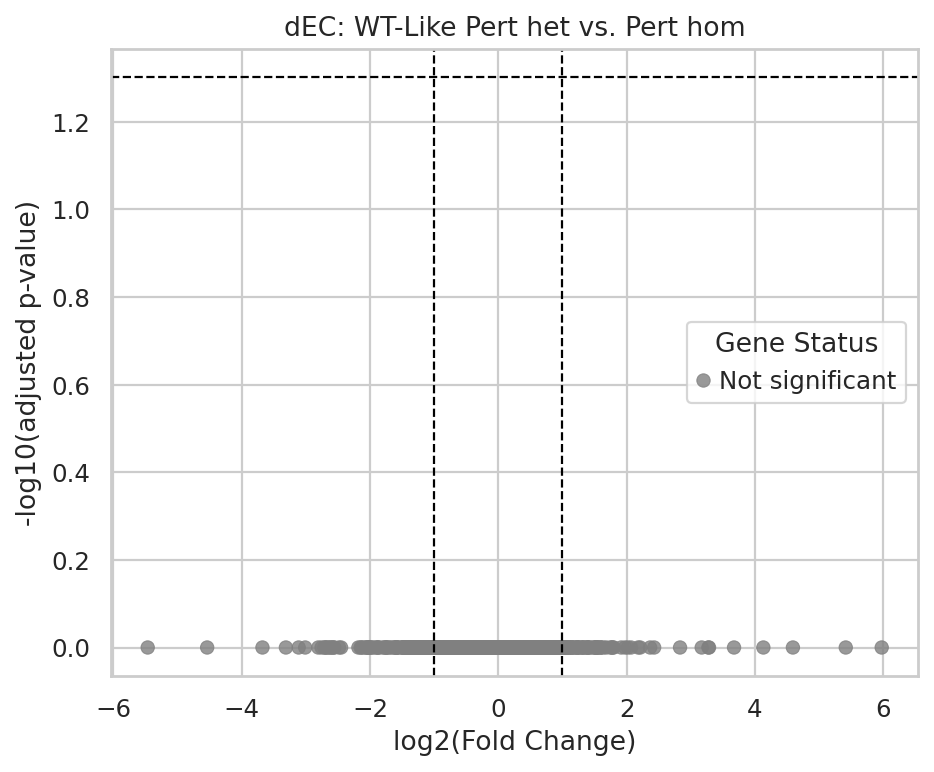


dEC
Cell counts: [83, 118, 111, 148]


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.85 seconds.

Fitting dispersion trend curve...
... done in 0.10 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.99 seconds.

Fitting LFCs...
... done in 0.53 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.29 seconds.



Log2 fold change & Wald test p-value: condition mut vs wt
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        256.673535       -0.109967  0.347298 -0.316637  0.751519  0.999931
Alg-2       405.355257        0.031932  0.320145  0.099742  0.920549  0.999931
Tim17b      495.174221       -0.036501  0.312150 -0.116933  0.906913  0.999931
CG41128     203.851048        0.214371  0.430107  0.498413  0.618193  0.999931
CG41099      68.072579       -0.237833  0.442852 -0.537049  0.591234  0.999931
...                ...             ...       ...       ...       ...       ...
mt:ND4     1001.772088       -0.066332  0.300974 -0.220391  0.825567  0.999931
mt:ND4L     316.776225       -0.219284  0.353196 -0.620857  0.534694  0.999931
mt:ND6      273.826511       -0.050313  0.334734 -0.150308  0.880521  0.999931
mt:Cyt-b  10665.846160       -0.092049  0.370691 -0.248317  0.803889  0.999931
mt:ND1      556.781150       -0.025367  0.308717 -0.082171  0.934511  0.9

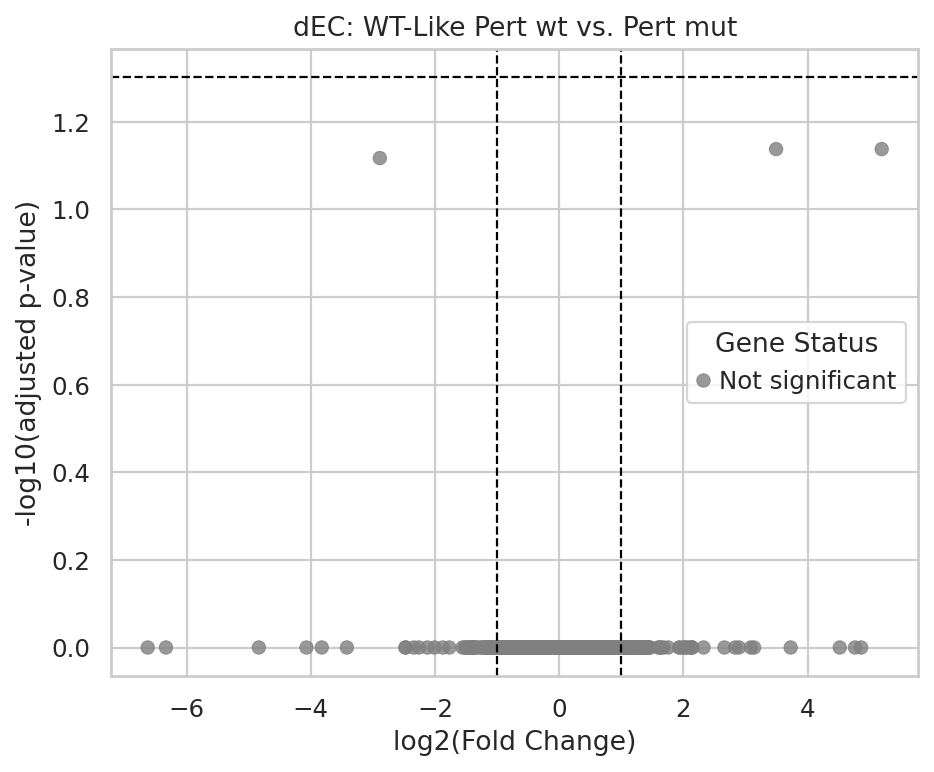


dMT
Cell counts: [18, 23, 29, 22]
Using None as control genes, passed at DeseqDataSet initialization


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.29 seconds.

Fitting dispersion trend curve...
... done in 0.03 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.28 seconds.

Fitting LFCs...
... done in 0.20 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.09 seconds.



Log2 fold change & Wald test p-value: condition het vs wt
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp       17.545424        0.690825  0.736298  0.938241  0.348120  0.999019
Alg-2       9.737544        0.793645  0.996467  0.796458  0.425766  0.999019
Tim17b     15.066394        0.443965  0.780408  0.568888  0.569432  0.999019
beta-Man    6.079893        0.139866  1.200082  0.116547  0.907219  0.999019
lost       44.881283       -0.068686  0.486206 -0.141268  0.887658  0.999019
...              ...             ...       ...       ...       ...       ...
mt:ND4     44.368994        0.065609  0.500675  0.131041  0.895742  0.999019
mt:ND4L    18.601445       -0.260404  0.737698 -0.352996  0.724092  0.999019
mt:ND6     13.532066       -0.281891  0.816556 -0.345220  0.729929  0.999019
mt:Cyt-b  622.613957       -0.115820  0.349738 -0.331163  0.740521  0.999019
mt:ND1     25.391851       -0.196786  0.611098 -0.322020  0.747438  0.999019

[1762 rows x 6 co

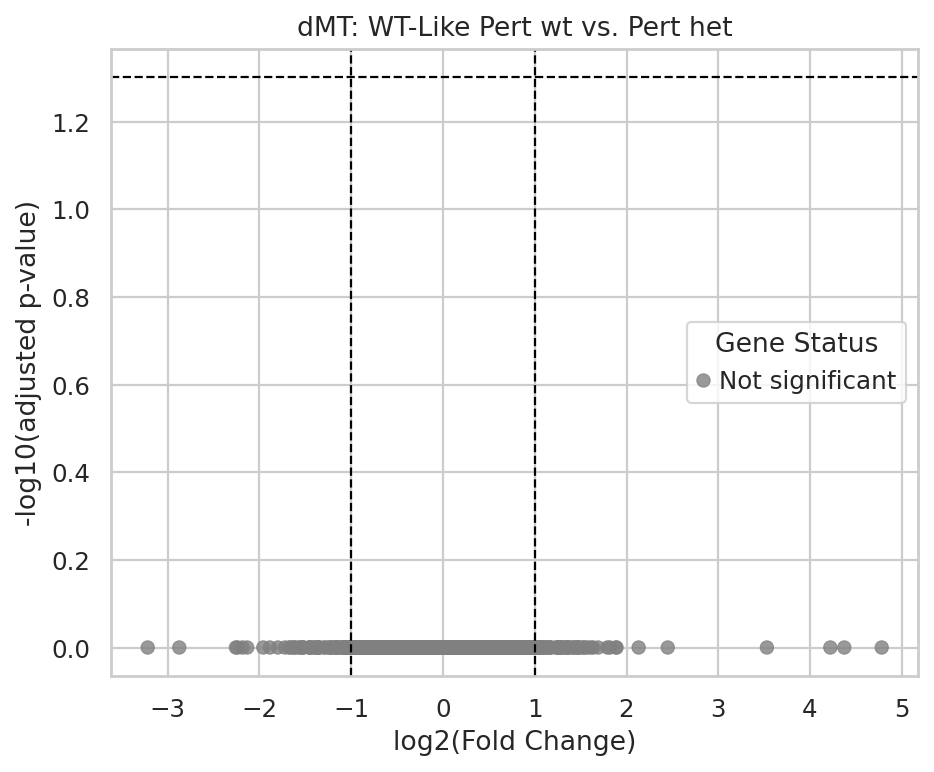


dMT
Cell counts: [18, 8, 29, 15]
Insufficient cells
dMT
Cell counts: [23, 8, 22, 15]
Insufficient cells
dMT
Cell counts: [18, 31, 29, 37]
Using None as control genes, passed at DeseqDataSet initialization


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.26 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.43 seconds.

Fitting LFCs...
... done in 0.20 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.



Log2 fold change & Wald test p-value: condition mut vs wt
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp       20.128294        0.560787  0.694134  0.807895  0.419151  0.999615
Alg-2      10.746714        0.574465  0.946466  0.606957  0.543879  0.999615
Tim17b     17.629922        0.360069  0.731098  0.492504  0.622363  0.999615
beta-Man    7.282910        0.107191  1.116598  0.095998  0.923522  0.999615
CG14641     4.947432        0.660921  1.332272  0.496086  0.619834  0.999615
...              ...             ...       ...       ...       ...       ...
mt:ND4     52.095696        0.000371  0.476840  0.000779  0.999379  0.999615
mt:ND4L    21.534865       -0.361442  0.683515 -0.528799  0.596945  0.999615
mt:ND6     16.130058       -0.331905  0.751306 -0.441771  0.658655  0.999615
mt:Cyt-b  737.072267       -0.155698  0.363223 -0.428656  0.668174  0.999615
mt:ND1     28.603613       -0.414457  0.585707 -0.707618  0.479183  0.999615

[1990 rows x 6 co

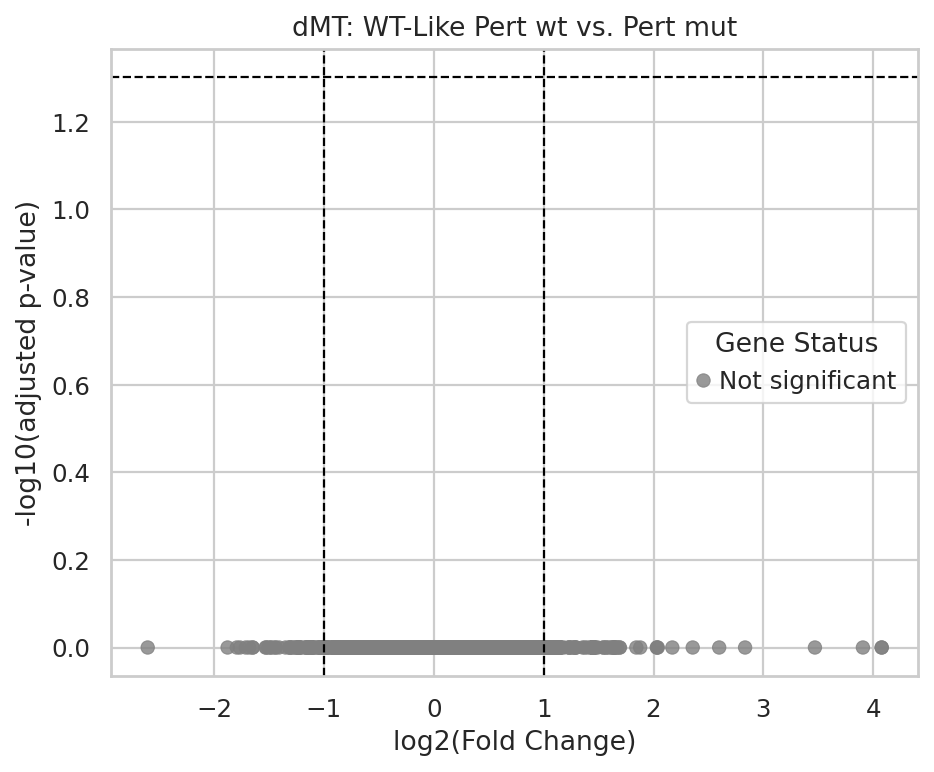


mEC
Cell counts: [3, 0, 3, 3]
Insufficient cells
mEC
Cell counts: [3, 0, 3, 1]
Insufficient cells
mEC
Cell counts: [0, 0, 3, 1]
Insufficient cells
mEC
Cell counts: [3, 0, 3, 4]
Insufficient cells
pEC
Cell counts: [14, 20, 19, 24]
Using None as control genes, passed at DeseqDataSet initialization


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.29 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.34 seconds.

Fitting LFCs...
... done in 0.21 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.12 seconds.



Log2 fold change & Wald test p-value: condition het vs wt
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        6.224726        0.704336  1.197942  0.587955  0.556562  0.999896
Alg-2      15.258157        0.377356  0.779501  0.484099  0.628315  0.999896
Tim17b     24.972014       -0.219920  0.668908 -0.328775  0.742326  0.999896
beta-Man    8.649358        0.179067  0.962374  0.186069  0.852391  0.999896
Vps24       9.540064       -1.185485  0.943586 -1.256362  0.208985  0.999896
...              ...             ...       ...       ...       ...       ...
mt:ND4     69.402885       -0.586305  0.530353 -1.105500  0.268943  0.999896
mt:ND4L    13.336942        0.552543  0.848875  0.650912  0.515103  0.999896
mt:ND6     17.338983       -0.366942  0.750407 -0.488991  0.624848  0.999896
mt:Cyt-b  784.937665       -0.149852  0.444007 -0.337499  0.735741  0.999896
mt:ND1     37.047464       -0.027010  0.609735 -0.044297  0.964667  0.999896

[2119 rows x 6 co

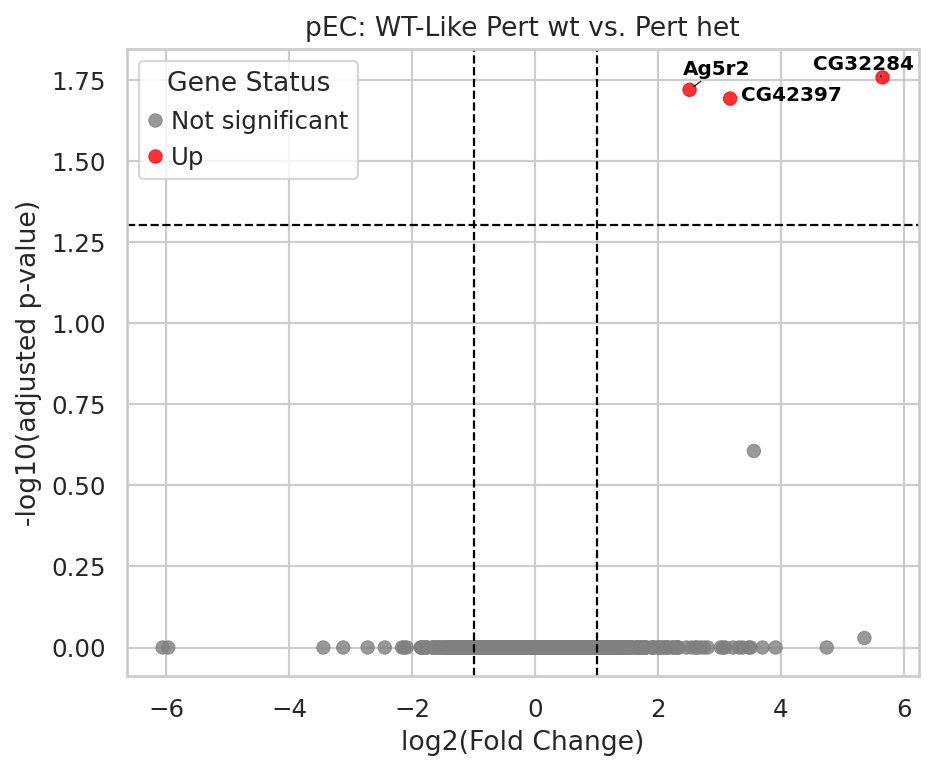


pEC
Cell counts: [14, 18, 19, 10]
Using None as control genes, passed at DeseqDataSet initialization


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.27 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.31 seconds.

Fitting LFCs...
... done in 0.19 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.



Log2 fold change & Wald test p-value: condition hom vs wt
            baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
Alg-2      15.469663        0.847995  0.791400  1.071513  0.283939  0.99958
Tim17b     22.560132       -0.014729  0.694143 -0.021220  0.983070  0.99958
Gfat1       2.700448        3.438074  2.294444  1.498434  0.134021      NaN
beta-Man    8.384422        0.598854  1.025592  0.583910  0.559281  0.99958
DhpD        3.162485        1.845354  3.998715  0.461487  0.644449      NaN
...              ...             ...       ...       ...       ...      ...
mt:ND4     68.465131       -0.077649  0.530281 -0.146429  0.883583  0.99958
mt:ND4L     8.343418       -0.247744  1.034714 -0.239432  0.810771  0.99958
mt:ND6     14.755488       -0.347840  0.811079 -0.428861  0.668024  0.99958
mt:Cyt-b  659.428888       -0.142761  0.389379 -0.366637  0.713890  0.99958
mt:ND1     28.622848       -0.269312  0.633076 -0.425402  0.670544  0.99958

[2035 rows x 6 columns]


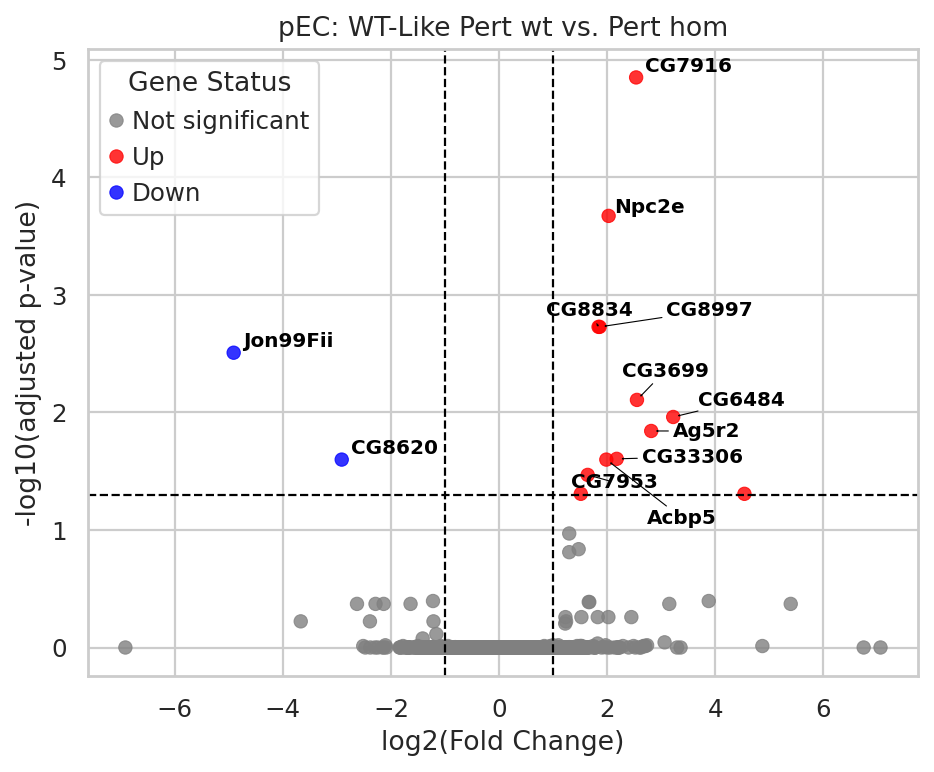


pEC
Cell counts: [20, 18, 24, 10]
Using None as control genes, passed at DeseqDataSet initialization


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.32 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.36 seconds.

Fitting LFCs...
... done in 0.21 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.13 seconds.



Log2 fold change & Wald test p-value: condition hom vs het
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        5.279175       -1.398247  1.354402 -1.032372  0.301898  0.997749
Alg-2      20.390448        0.505750  0.758583  0.666704  0.504961  0.997749
Tim17b     24.823189        0.237416  0.712662  0.333140  0.739029  0.997749
Gfat1       3.009726        5.321800  5.166690  1.030021  0.303000  0.997749
beta-Man   10.521667        0.461993  0.965714  0.478395  0.632369  0.997749
...              ...             ...       ...       ...       ...       ...
mt:ND4     67.368336        0.538010  0.596853  0.901412  0.367369  0.997749
mt:ND4L    12.410921       -0.772324  0.900033 -0.858107  0.390833  0.997749
mt:ND6     15.323814        0.049507  0.834635  0.059316  0.952700  0.997749
mt:Cyt-b  741.942464        0.040743  0.500121  0.081466  0.935072  0.997749
mt:ND1     33.616465       -0.209881  0.670258 -0.313135  0.754178  0.997749

[2218 rows x 6 c

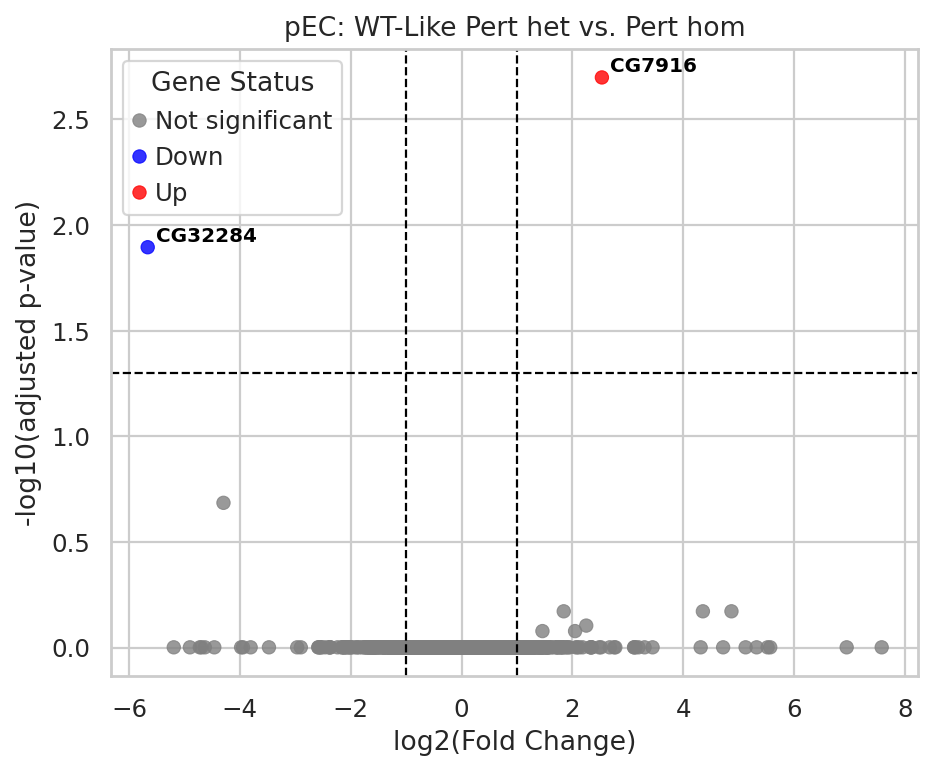


pEC
Cell counts: [14, 38, 19, 34]
Using None as control genes, passed at DeseqDataSet initialization


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.50 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.46 seconds.

Fitting LFCs...
... done in 0.28 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.16 seconds.



Log2 fold change & Wald test p-value: condition mut vs wt
             baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
Parp         6.536893        0.105553  1.104063  0.095604  0.923835      NaN
Alg-2       22.107600        0.580430  0.661793  0.877056  0.380456  0.99388
Tim17b      34.071487       -0.163322  0.568962 -0.287053  0.774072  0.99388
CG41128      7.750889        0.280657  0.991248  0.283135  0.777073      NaN
Gfat1        2.462931        2.470809  2.256790  1.094833  0.273590      NaN
...               ...             ...       ...       ...       ...      ...
mt:ND4      97.023005       -0.433158  0.441425 -0.981272  0.326459  0.99388
mt:ND4L     15.890812        0.255268  0.764564  0.333874  0.738474  0.99388
mt:ND6      22.780154       -0.426130  0.640775 -0.665023  0.506036  0.99388
mt:Cyt-b  1039.805033       -0.181236  0.366131 -0.495004  0.620597  0.99388
mt:ND1      47.071110       -0.176528  0.517392 -0.341189  0.732961  0.99388

[2930 rows x 6 co

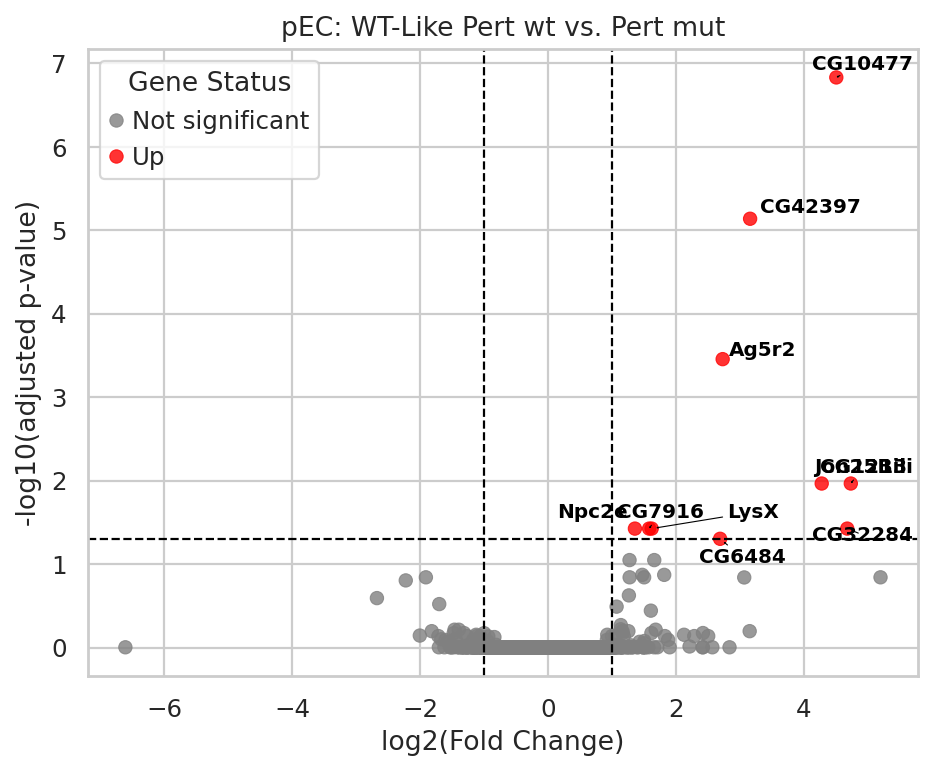


ISC/EB
Cell counts: [351, 346, 488, 438]


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.85 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.97 seconds.

Fitting LFCs...
... done in 0.54 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.32 seconds.



Log2 fold change & Wald test p-value: condition het vs wt
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       17.003454        0.219900  0.679517  0.323612  0.746232  0.999918
Parp        573.008838       -0.028048  0.240378 -0.116684  0.907111  0.999918
Alg-2       339.625608        0.030209  0.259191  0.116550  0.907217  0.999918
Tim17b      636.749209        0.067387  0.239686  0.281148  0.778597  0.999918
CG41128     203.129433       -0.075924  0.397482 -0.191014  0.848515  0.999918
...                ...             ...       ...       ...       ...       ...
mt:ND4     1453.432785       -0.048875  0.232750 -0.209990  0.833676  0.999918
mt:ND4L     457.374709       -0.073078  0.247724 -0.294997  0.767996  0.999918
mt:ND6      438.342075       -0.098281  0.257800 -0.381230  0.703033  0.999918
mt:Cyt-b  15696.828652       -0.140630  0.268224 -0.524301  0.600069  0.999918
mt:ND1      733.086147       -0.145651  0.252207 -0.577506  0.563598  0.9

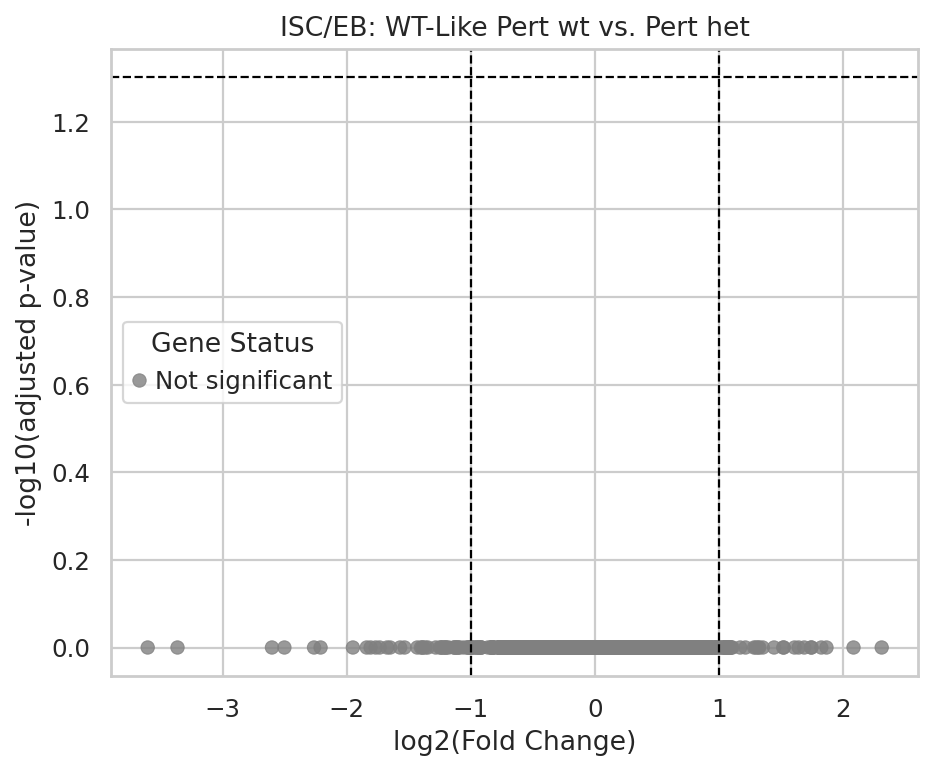


ISC/EB
Cell counts: [351, 212, 488, 249]


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.86 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.97 seconds.

Fitting LFCs...
... done in 0.55 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.27 seconds.



Log2 fold change & Wald test p-value: condition hom vs wt
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       10.939120       -0.310047  0.843309 -0.367655  0.713131  0.999968
Parp        438.226804       -0.033494  0.271289 -0.123462  0.901741  0.999968
Alg-2       273.256793        0.163908  0.285690  0.573726  0.566153  0.999968
Tim17b      504.783240        0.161870  0.275469  0.587616  0.556790  0.999968
CG41128     173.382896        0.227541  0.401972  0.566062  0.571352  0.999968
...                ...             ...       ...       ...       ...       ...
mt:ND4     1146.459703        0.033054  0.261934  0.126194  0.899579  0.999968
mt:ND4L     342.296355       -0.146057  0.274165 -0.532736  0.594216  0.999968
mt:ND6      338.483881       -0.079082  0.294097 -0.268896  0.788010  0.999968
mt:Cyt-b  12407.439738       -0.048987  0.298750 -0.163973  0.869753  0.999968
mt:ND1      600.921196        0.049554  0.289372  0.171246  0.864030  0.9

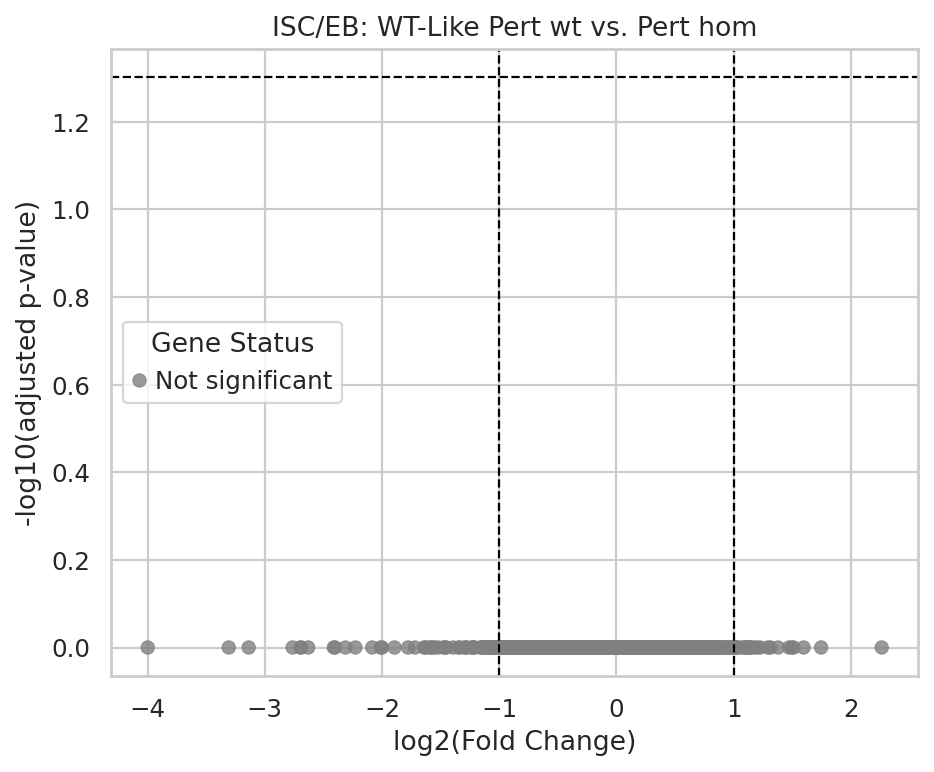


ISC/EB
Cell counts: [346, 212, 438, 249]


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.87 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.95 seconds.

Fitting LFCs...
... done in 0.68 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.27 seconds.



Log2 fold change & Wald test p-value: condition hom vs het
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       11.814430       -0.523907  0.808353 -0.648117  0.516909  0.999932
Parp        434.255498       -0.006239  0.265738 -0.023477  0.981270  0.999932
Alg-2       276.201008        0.132876  0.277298  0.479182  0.631809  0.999932
Tim17b      516.561998        0.093690  0.266143  0.352029  0.724817  0.999932
CG41128     169.236039        0.301903  0.406150  0.743328  0.457283  0.999932
...                ...             ...       ...       ...       ...       ...
mt:ND4     1127.714280        0.081209  0.249431  0.325576  0.744745  0.999932
mt:ND4L     333.524465       -0.073544  0.269979 -0.272406  0.785310  0.999932
mt:ND6      326.854423        0.018795  0.280967  0.066894  0.946666  0.999932
mt:Cyt-b  11826.765578        0.090489  0.275569  0.328373  0.742630  0.999932
mt:ND1      572.465792        0.194574  0.273344  0.711826  0.476572  0.

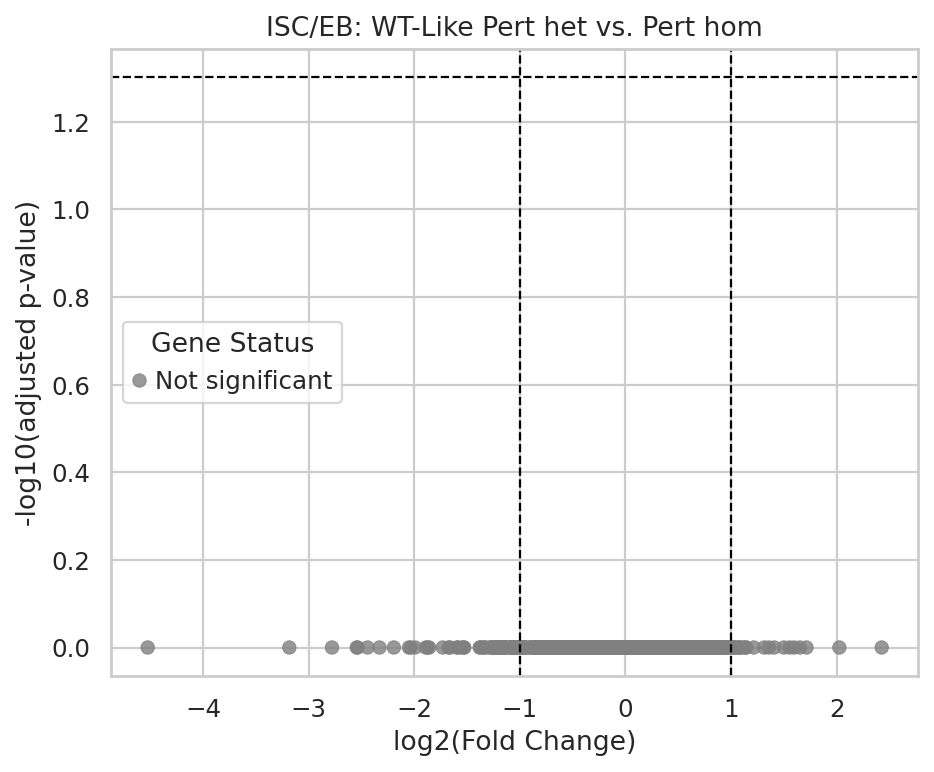


ISC/EB
Cell counts: [351, 558, 488, 687]


/scratch/jobs/60613130/ipykernel_3196038/3514923778.py:21: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.91 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.01 seconds.

Fitting LFCs...
... done in 0.69 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.33 seconds.



Log2 fold change & Wald test p-value: condition mut vs wt
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       20.150331        0.042554  0.647126  0.065758  0.947571  0.999894
Parp        721.377813       -0.038607  0.241244 -0.160034  0.872855  0.999894
Alg-2       436.005940        0.074035  0.257052  0.288017  0.773334  0.999894
Tim17b      812.389998        0.094290  0.243500  0.387227  0.698588  0.999894
CG41128     266.603259        0.040299  0.386085  0.104380  0.916868  0.999894
...                ...             ...       ...       ...       ...       ...
mt:ND4     1851.661218       -0.024092  0.238216 -0.101137  0.919442  0.999894
mt:ND4L     571.532425       -0.107016  0.247521 -0.432352  0.665486  0.999894
mt:ND6      554.065752       -0.096586  0.259696 -0.371920  0.709952  0.999894
mt:Cyt-b  20009.847972       -0.111909  0.276870 -0.404193  0.686070  0.999894
mt:ND1      947.869100       -0.075447  0.258329 -0.292059  0.770241  0.9

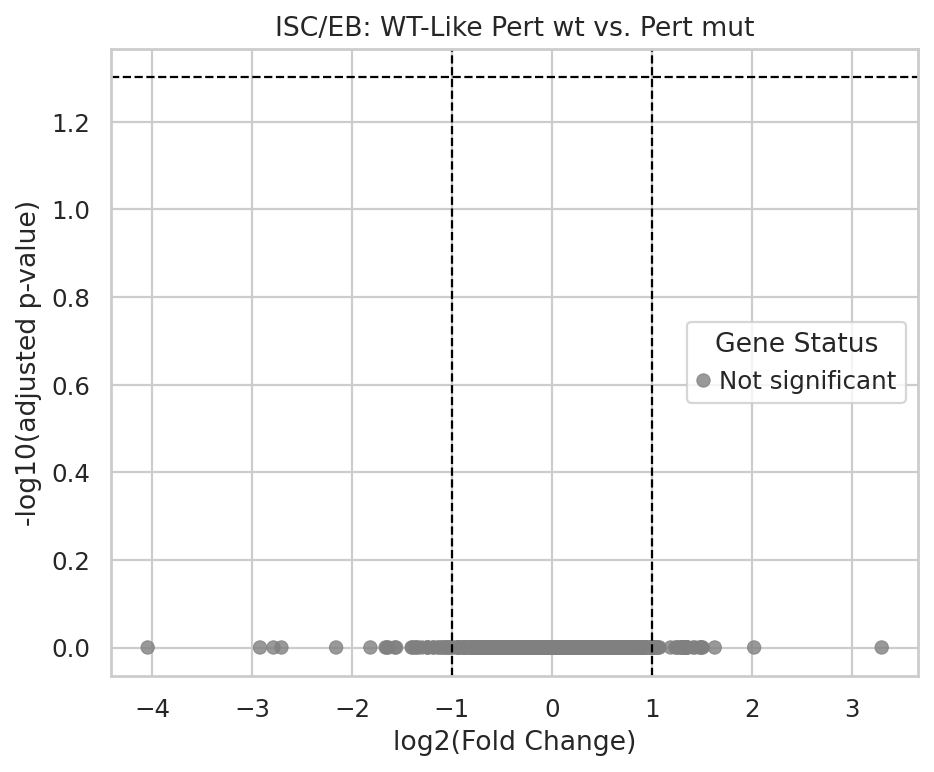

In [28]:
pert_run_labels = [rl for rl in run_labels if 'ctrl' not in rl]
wtlike_name_class = {
    'wt': ['wt', 'wt-like'],
    'het': ['het', 'het-like'],
    'hom': ['hom'],
    'mut': ['het', 'het-like', 'hom'],
}
for ct in cluster_celltypes:
    for comp_vals in [('wt', 'het'), ('wt', 'hom'), ('het', 'hom'), ('wt', 'mut')]:
        fig_title = f'{ct}: WT-Like Pert {comp_vals[0]} vs. Pert {comp_vals[1]}'
        comparison = fig_title.replace(':', '').replace(' ', '_')
        print(ct)
        X = np.zeros((4, raw_comb_adata.X.shape[1]))
        n_cells = []
        meta_index, meta_vals = [], []
        i = 0
        for run_label in pert_run_labels:
            for comp_val in comp_vals:
                tmp = raw_comb_adata[raw_comb_adata.obs['batch'] == run_label]
                tmp = tmp[np.isin(tmp.obs['celltype'], ct.split('/'))]
                tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
                meta_index.append(f'{run_label} {comp_val}')
                meta_vals.append(comp_val)
                n_cells.append(len(tmp))
                X[i] = tmp.X.sum(axis=0)
                i += 1
        metadata = pd.DataFrame(meta_vals, index=meta_index, columns=['condition'])
        n_cells_given_comparison[comparison] = n_cells
        print(f'Cell counts: {n_cells}')
        if min(n_cells) < min_cells_per_condition:
            print('Insufficient cells')
            continue
    
        counts_df = pd.DataFrame(X, index=meta_index, columns=tmp.var.index)
        counts_df = counts_df[counts_df.columns[counts_df.max() > min_max_reads_per_gene]]
    
        inference = DefaultInference(n_cpus=4)
        dds = DeseqDataSet(
            counts=counts_df,
            metadata=metadata,
            design="~condition",  # compare samples based on the "condition"
            refit_cooks=True,
            inference=inference,
            n_cpus=4,
        )
    
        dds.deseq2()

        ref_name, var_name = comp_vals
        ds = DeseqStats(dds, contrast=['condition', var_name, ref_name], inference=inference)
        ds.summary()
        results_df = ds.results_df
        results_df_given_comparison[comparison] = results_df
        plot_volcano(results_df, fig_title=fig_title)
    
        print()


# Ctrl sample vs. Pert subtypes

### Straight wt-het-hom

CC
Cell counts: [97, 16, 94, 7]
Insufficient cells
CC
Cell counts: [97, 2, 94, 1]
Insufficient cells
CC
Cell counts: [97, 5, 94, 3]
Insufficient cells
CC
Cell counts: [97, 7, 94, 4]
Insufficient cells
EB
Cell counts: [942, 1, 1385, 5]
Insufficient cells
EB
Cell counts: [942, 10, 1385, 11]


/scratch/jobs/60613130/ipykernel_3196038/145479499.py:14: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['het_hom_status'], ['het', 'hom'])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.15 seconds.

Fitting dispersion trend curve...
/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:805: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.10 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.08 seconds.

Fitting LFCs...
... done in 0.65 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.36 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       4.410083       -0.032291  1.572632 -0.020533  0.983618  0.999723
Pzl          0.825589       -0.193933  2.457052 -0.078929  0.937089  0.999723
Parp       166.320396       -0.629061  0.641045 -0.981307  0.326442  0.999723
Alg-2      136.516836        0.217523  0.631700  0.344346  0.730586  0.999723
Tim17b     218.163194        0.114040  0.614781  0.185497  0.852839  0.999723
...               ...             ...       ...       ...       ...       ...
mt:ND4     551.245066       -0.696304  0.651056 -1.069500  0.284844  0.999723
mt:ND4L    216.474032       -0.685826  0.666879 -1.028411  0.303756  0.999723
mt:ND6     230.123880       -0.591736  0.732930 -0.807357  0.419461  0.999723
mt:Cyt-b  6266.818630       -0.738170  0.687805 -1.073226  0.283170  0.999723
mt:ND1     286.578981       -0.945603  0.714721 -1.323037  0.185823  0.999723

[7

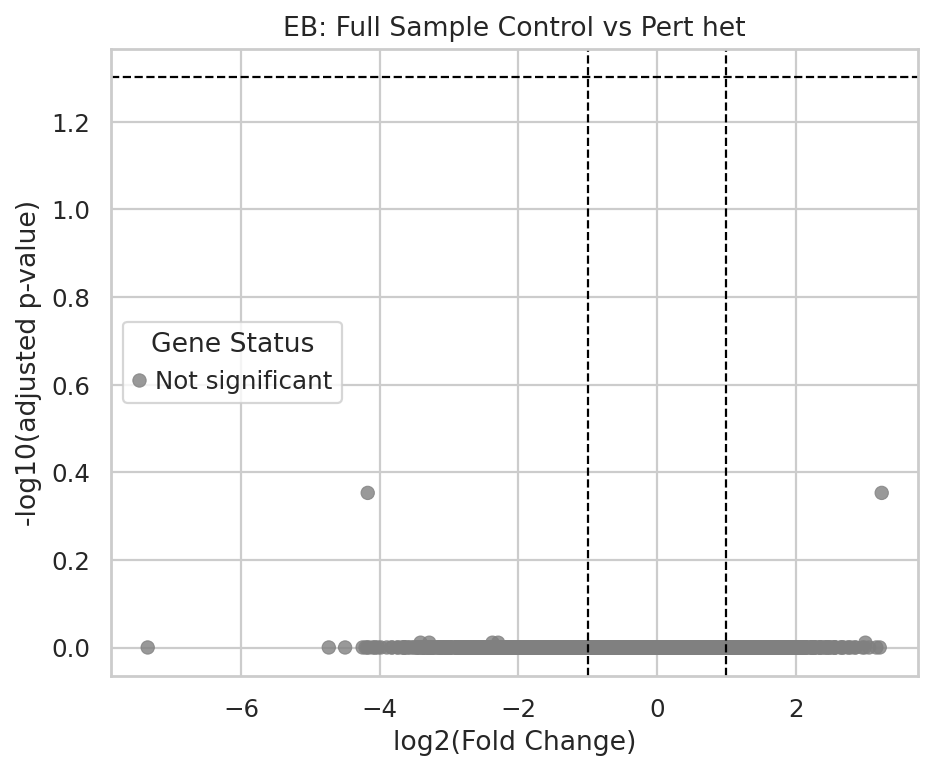


EB
Cell counts: [942, 396, 1385, 498]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.99 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.07 seconds.

Fitting LFCs...
... done in 0.59 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.31 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       24.441484        0.039851  0.688880  0.057849  0.953869  0.999928
Pzl           6.663246       -1.570209  1.275097 -1.231443  0.218157       NaN
Parp       1081.125091       -0.341357  0.340053 -1.003835  0.315458  0.999928
Alg-2       702.439730       -0.215381  0.341806 -0.630126  0.528612  0.999928
Tim17b     1246.195686       -0.019632  0.333037 -0.058947  0.952994  0.999928
...                ...             ...       ...       ...       ...       ...
mt:ND4     3372.806414       -0.617080  0.398466 -1.548638  0.121469  0.999928
mt:ND4L    1228.383410       -0.892702  0.386458 -2.309958  0.020890  0.517549
mt:ND6     1224.239902       -1.053876  0.456251 -2.309861  0.020896  0.517549
mt:Cyt-b  37960.863624       -0.695382  0.439138 -1.583514  0.113304  0.999928
mt:ND1     1840.875217       -0.656973  0.424503 -1.547628  0.121712  

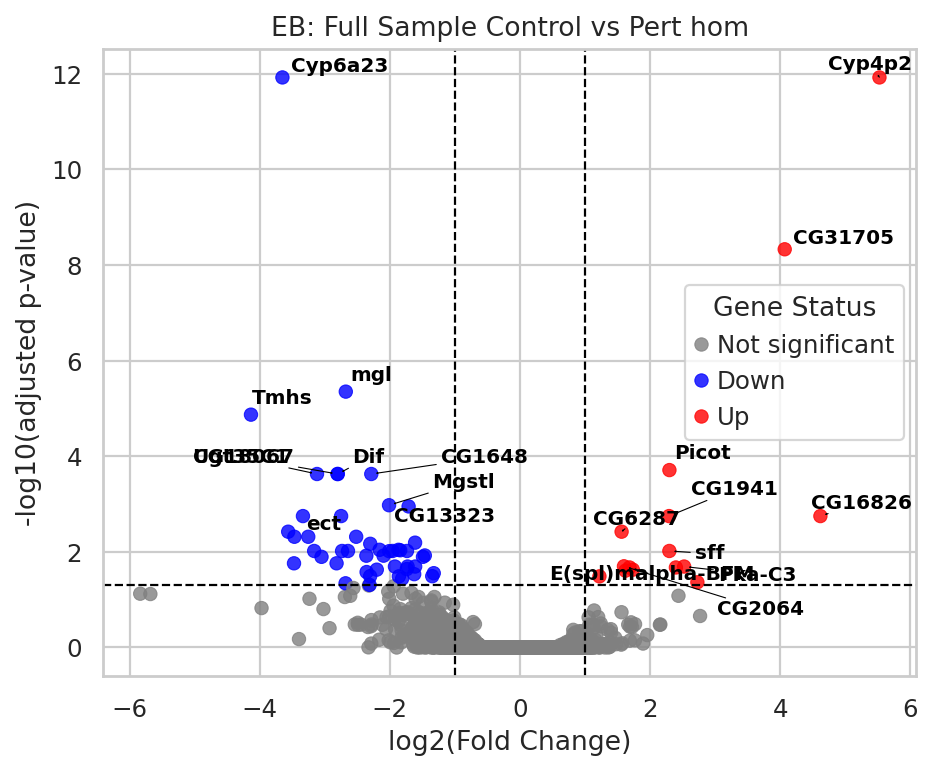


EB
Cell counts: [942, 406, 1385, 509]


/scratch/jobs/60613130/ipykernel_3196038/145479499.py:14: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['het_hom_status'], ['het', 'hom'])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.99 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.11 seconds.

Fitting LFCs...
... done in 0.58 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.32 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       24.821095        0.043804  0.685427  0.063907  0.949044  0.999614
Pzl           6.710918       -1.607668  1.272641 -1.263254  0.206498       NaN
Parp       1094.051820       -0.346848  0.340183 -1.019593  0.307921  0.999614
Alg-2       715.539239       -0.200071  0.341954 -0.585084  0.558492  0.999614
Tim17b     1265.440466       -0.014460  0.332944 -0.043431  0.965358  0.999614
...                ...             ...       ...       ...       ...       ...
mt:ND4     3418.840723       -0.617284  0.398945 -1.547290  0.121793  0.999614
mt:ND4L    1247.480014       -0.885217  0.386496 -2.290362  0.022000  0.536824
mt:ND6     1245.656646       -1.037539  0.456629 -2.272171  0.023076  0.546696
mt:Cyt-b  38489.507756       -0.694640  0.439889 -1.579124  0.114308  0.999614
mt:ND1     1863.536623       -0.662154  0.425413 -1.556497  0.119590  

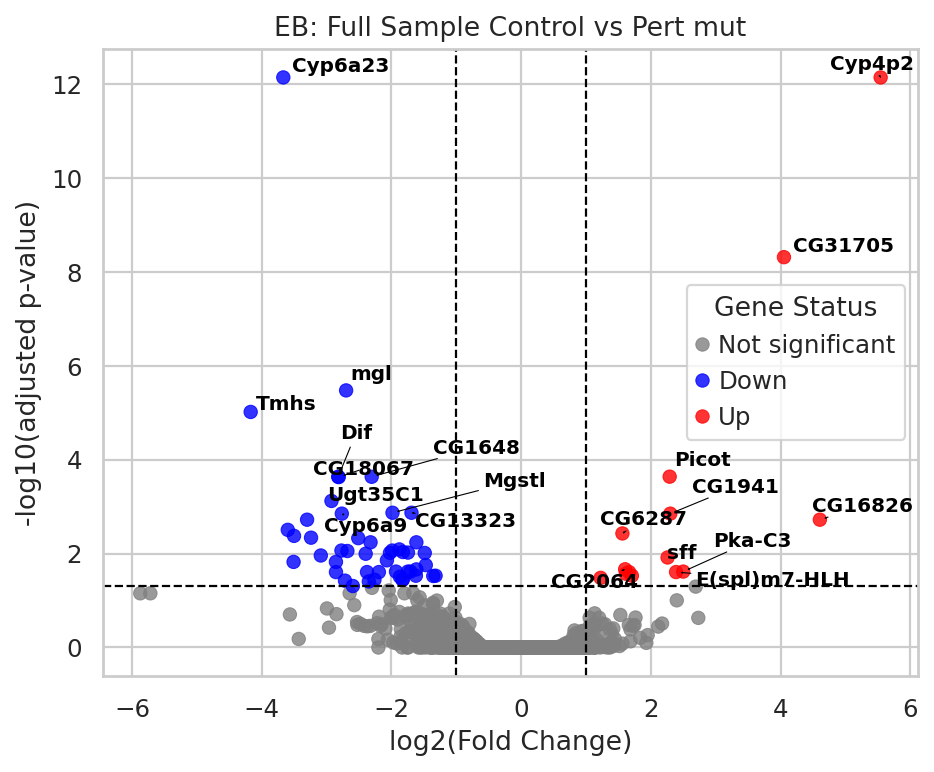


EE
Cell counts: [23, 0, 131, 0]
Insufficient cells
EE
Cell counts: [23, 1, 131, 0]
Insufficient cells
EE
Cell counts: [23, 11, 131, 23]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.54 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.62 seconds.

Fitting LFCs...
... done in 0.57 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.22 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp       20.473981        0.046253  0.753397  0.061392  0.951047  0.999899
Alg-2      23.201226       -0.548058  0.734260 -0.746408  0.455421  0.999899
Tim17b     22.503001       -0.088025  0.732560 -0.120160  0.904356  0.999899
CG41128     8.775172        0.257787  1.030735  0.250100  0.802510  0.999899
CG41099     6.299225       -1.819033  1.334408 -1.363176  0.172827  0.999899
...              ...             ...       ...       ...       ...       ...
mt:ND4     73.811570        0.121231  0.525826  0.230554  0.817661  0.999899
mt:ND4L    22.134296        0.180583  0.753085  0.239790  0.810493  0.999899
mt:ND6     22.093716        0.099592  0.768493  0.129594  0.896888  0.999899
mt:Cyt-b  797.857526        0.274248  0.435077  0.630345  0.528469  0.999899
mt:ND1     37.974538       -0.489837  0.671731 -0.729216  0.465870  0.999899

[4189 rows x 6

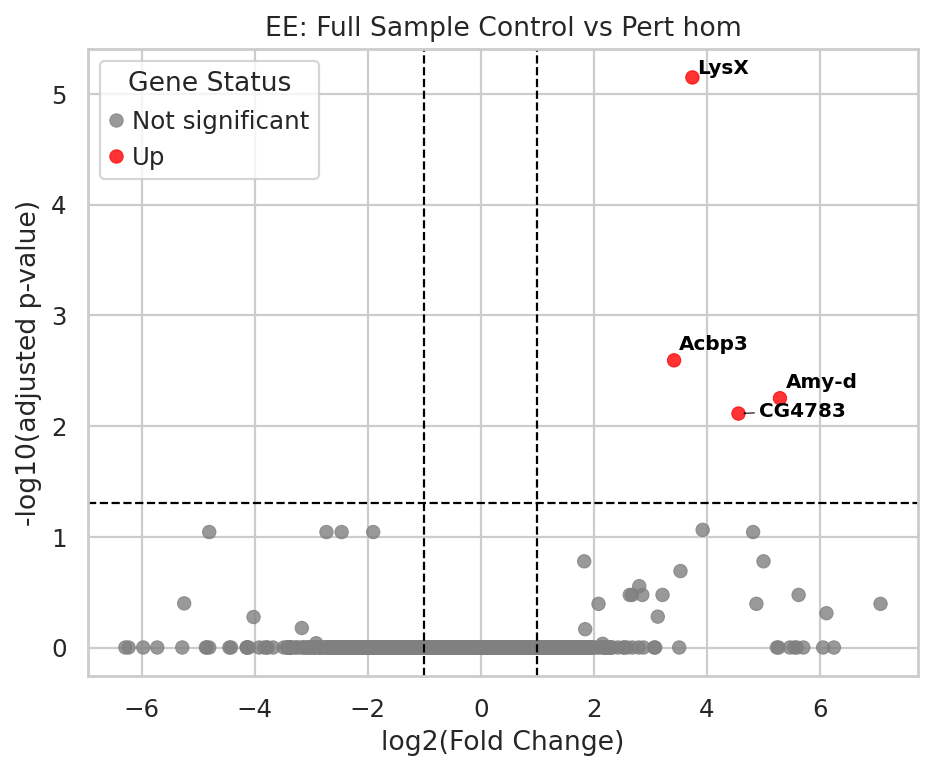


EE
Cell counts: [23, 12, 131, 23]


/scratch/jobs/60613130/ipykernel_3196038/145479499.py:14: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['het_hom_status'], ['het', 'hom'])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.54 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.61 seconds.

Fitting LFCs...
... done in 0.42 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.21 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp       20.402213        0.002699  0.751599  0.003592  0.997134  0.999844
Alg-2      23.338337       -0.578659  0.734591 -0.787729  0.430855  0.999844
Tim17b     22.590016       -0.119134  0.733421 -0.162437  0.870962  0.999844
CG41128     8.751765        0.219923  1.032575  0.212985  0.831339       NaN
CG41099     6.354523       -1.851958  1.333233 -1.389073  0.164811       NaN
...              ...             ...       ...       ...       ...       ...
mt:ND4     75.132368        0.128299  0.520484  0.246499  0.805296  0.999844
mt:ND4L    22.117958        0.142101  0.752651  0.188800  0.850249  0.999844
mt:ND6     22.046011        0.057380  0.767183  0.074794  0.940379  0.999844
mt:Cyt-b  804.247564        0.256898  0.430930  0.596147  0.551077  0.999844
mt:ND1     38.269124       -0.516589  0.673496 -0.767026  0.443066  0.999844

[4190 rows x 6

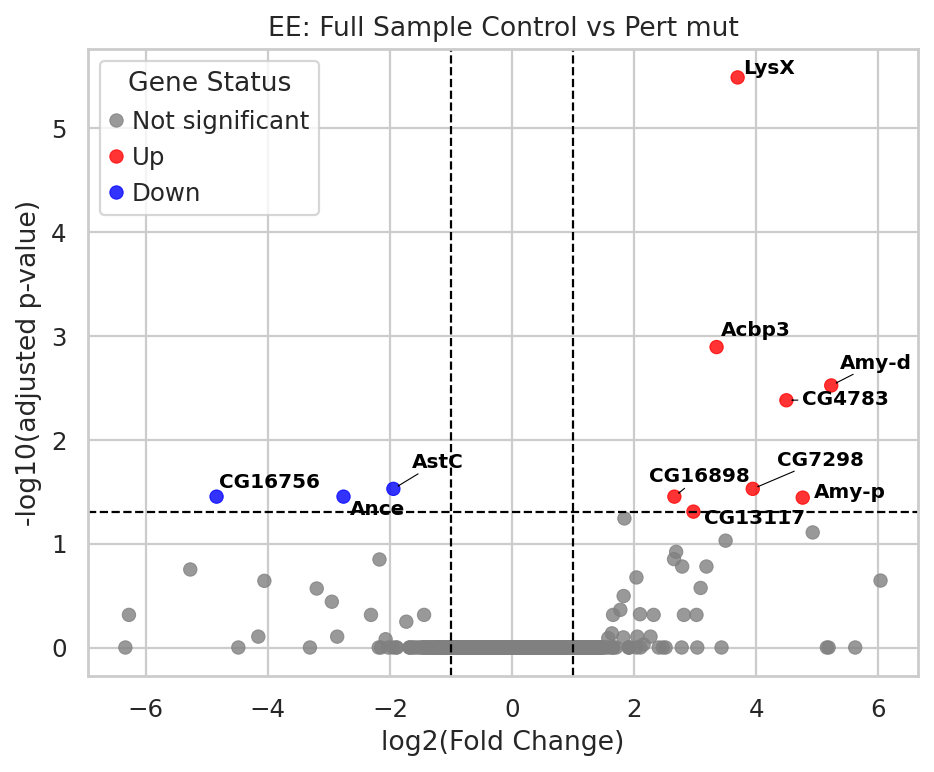


EEP
Cell counts: [27, 0, 194, 0]
Insufficient cells
EEP
Cell counts: [27, 1, 194, 0]
Insufficient cells
EEP
Cell counts: [27, 25, 194, 34]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.56 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.66 seconds.

Fitting LFCs...
... done in 0.44 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.23 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       1.849767       -1.312322  2.160658 -0.607372  0.543604  0.999793
Parp        51.195297       -0.524160  0.471389 -1.111947  0.266161  0.999793
Alg-2       28.645248       -0.063533  0.572004 -0.111072  0.911559  0.999793
Tim17b      42.029367       -0.128422  0.506810 -0.253392  0.799965  0.999793
CG41128     13.009601        0.049434  0.826088  0.059841  0.952282  0.999793
...               ...             ...       ...       ...       ...       ...
mt:ND4     110.554658       -0.484701  0.393361 -1.232205  0.217873  0.999793
mt:ND4L     39.099486       -0.650654  0.513598 -1.266854  0.205208  0.999793
mt:ND6      45.771079       -0.675013  0.567998 -1.188408  0.234673  0.999793
mt:Cyt-b  1374.585826       -0.458199  0.589576 -0.777168  0.437060  0.999793
mt:ND1      61.366686       -0.793829  0.481323 -1.649263  0.099094  0.999793

[4

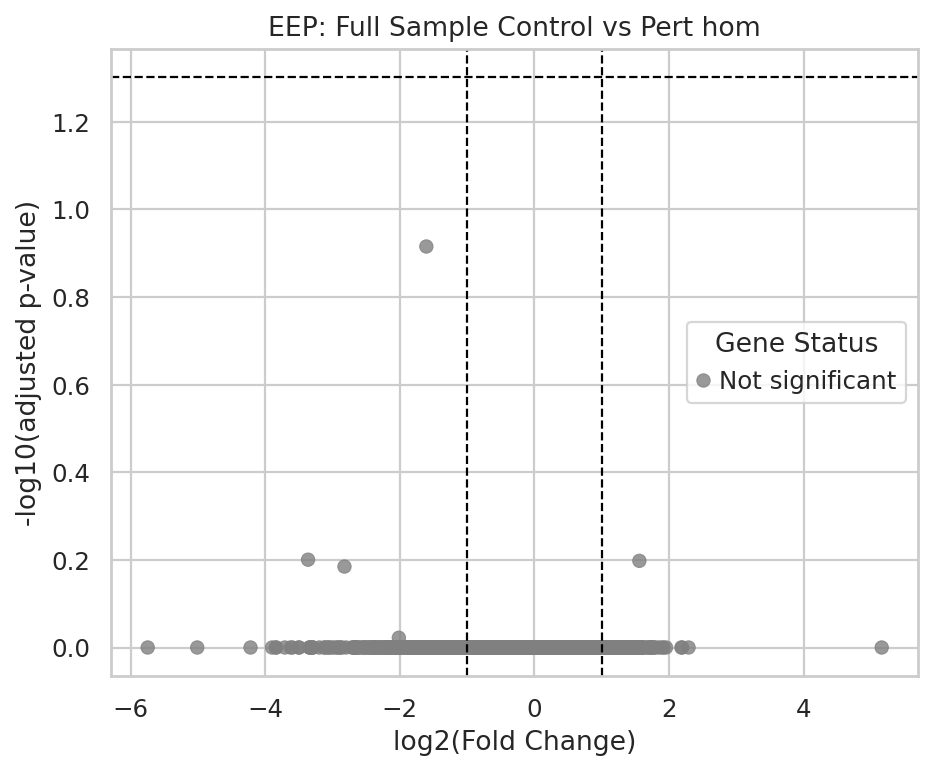


EEP
Cell counts: [27, 26, 194, 34]


/scratch/jobs/60613130/ipykernel_3196038/145479499.py:14: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['het_hom_status'], ['het', 'hom'])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.55 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.67 seconds.

Fitting LFCs...
... done in 0.46 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.23 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       1.862205       -1.321676  2.153668 -0.613686  0.539423  0.999926
Parp        52.141313       -0.488281  0.467281 -1.044942  0.296050  0.999926
Alg-2       28.642091       -0.083377  0.572660 -0.145596  0.884240  0.999926
Tim17b      42.059630       -0.146190  0.508371 -0.287566  0.773679  0.999926
CG41128     12.980743        0.025395  0.825789  0.030752  0.975467  0.999926
...               ...             ...       ...       ...       ...       ...
mt:ND4     111.156555       -0.491843  0.394230 -1.247602  0.212177  0.999926
mt:ND4L     39.145680       -0.671162  0.513979 -1.305814  0.191616  0.999926
mt:ND6      46.691415       -0.629868  0.566072 -1.112699  0.265838  0.999926
mt:Cyt-b  1381.391408       -0.467139  0.589598 -0.792300  0.428186  0.999926
mt:ND1      62.814427       -0.734925  0.476168 -1.543415  0.122730  0.999926

[4

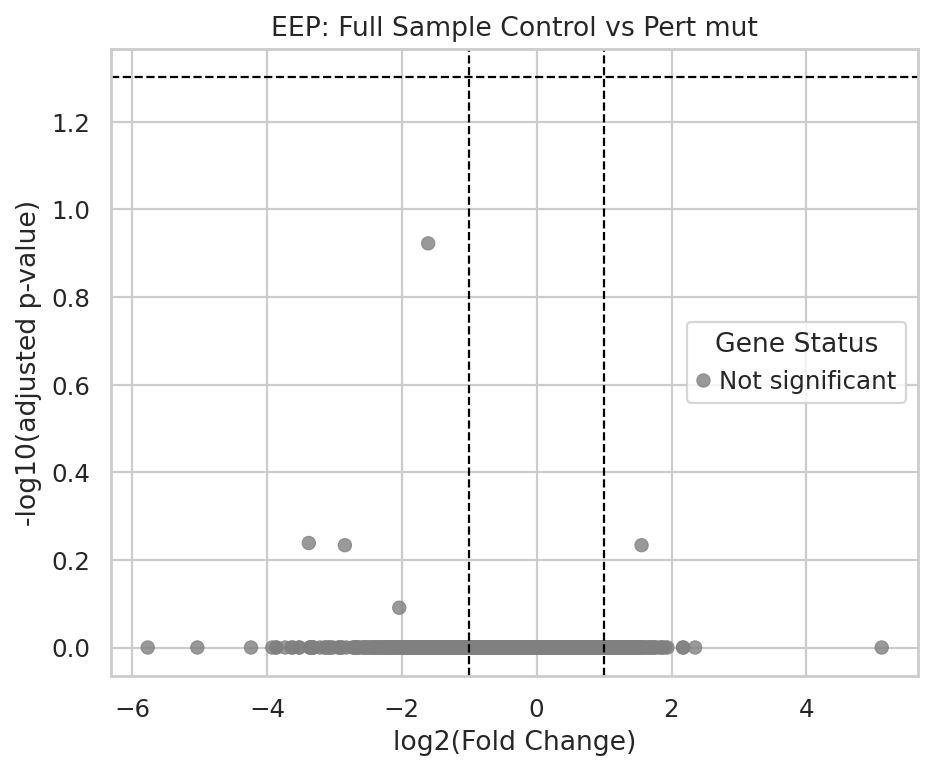


ISC
Cell counts: [975, 3, 1866, 6]
Insufficient cells
ISC
Cell counts: [975, 10, 1866, 2]
Insufficient cells
ISC
Cell counts: [975, 489, 1866, 653]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.01 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.07 seconds.

Fitting LFCs...
... done in 0.74 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.34 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       30.018191       -0.388435  0.611116 -0.635616  0.525027  0.999675
Pzl          10.943769       -1.033069  0.905010 -1.141500  0.253662       NaN
Parp       1015.840115       -0.320577  0.371858 -0.862093  0.388636  0.999675
Alg-2       529.109557       -0.288378  0.383307 -0.752342  0.451845  0.999675
Tim17b      912.136815       -0.096765  0.378996 -0.255320  0.798476  0.999675
...                ...             ...       ...       ...       ...       ...
mt:ND4     2595.129489       -0.554483  0.425676 -1.302592  0.192714  0.999675
mt:ND4L     909.152189       -1.027870  0.426401 -2.410570  0.015928  0.977529
mt:ND6      932.977790       -0.993060  0.483915 -2.052136  0.040156  0.999675
mt:Cyt-b  29248.944365       -0.698158  0.488298 -1.429780  0.152780  0.999675
mt:ND1     1322.226970       -0.708296  0.439650 -1.611044  0.107170  

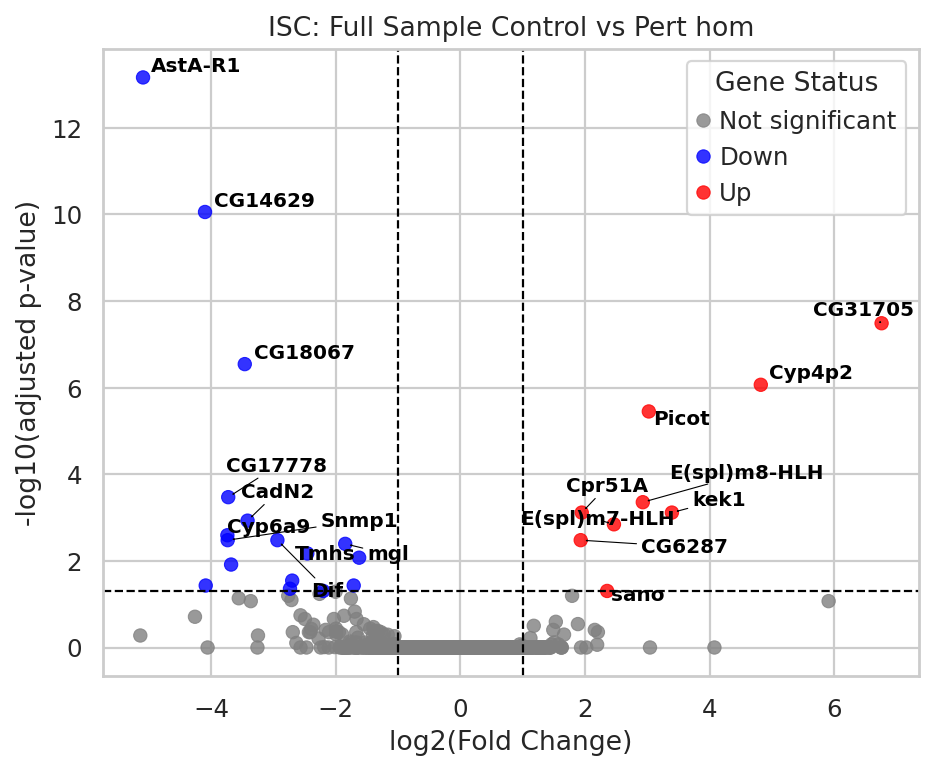


ISC
Cell counts: [975, 499, 1866, 655]


/scratch/jobs/60613130/ipykernel_3196038/145479499.py:14: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['het_hom_status'], ['het', 'hom'])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.99 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.06 seconds.

Fitting LFCs...
... done in 0.58 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.34 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       30.426128       -0.366247  0.608748 -0.601639  0.547415  0.999826
Pzl          10.970165       -1.050386  0.905392 -1.160145  0.245990  0.999826
Parp       1024.417924       -0.314273  0.370783 -0.847592  0.396665  0.999826
Alg-2       534.321122       -0.278011  0.381843 -0.728077  0.466566  0.999826
Tim17b      917.336406       -0.099501  0.378552 -0.262846  0.792670  0.999826
...                ...             ...       ...       ...       ...       ...
mt:ND4     2617.173171       -0.546469  0.424602 -1.287015  0.198089  0.999826
mt:ND4L     916.186836       -1.021413  0.425153 -2.402462  0.016285  0.980938
mt:ND6      937.666015       -0.997574  0.482346 -2.068171  0.038624  0.999826
mt:Cyt-b  29422.649607       -0.698701  0.486888 -1.435034  0.151277  0.999826
mt:ND1     1331.957063       -0.703891  0.438534 -1.605099  0.108472  

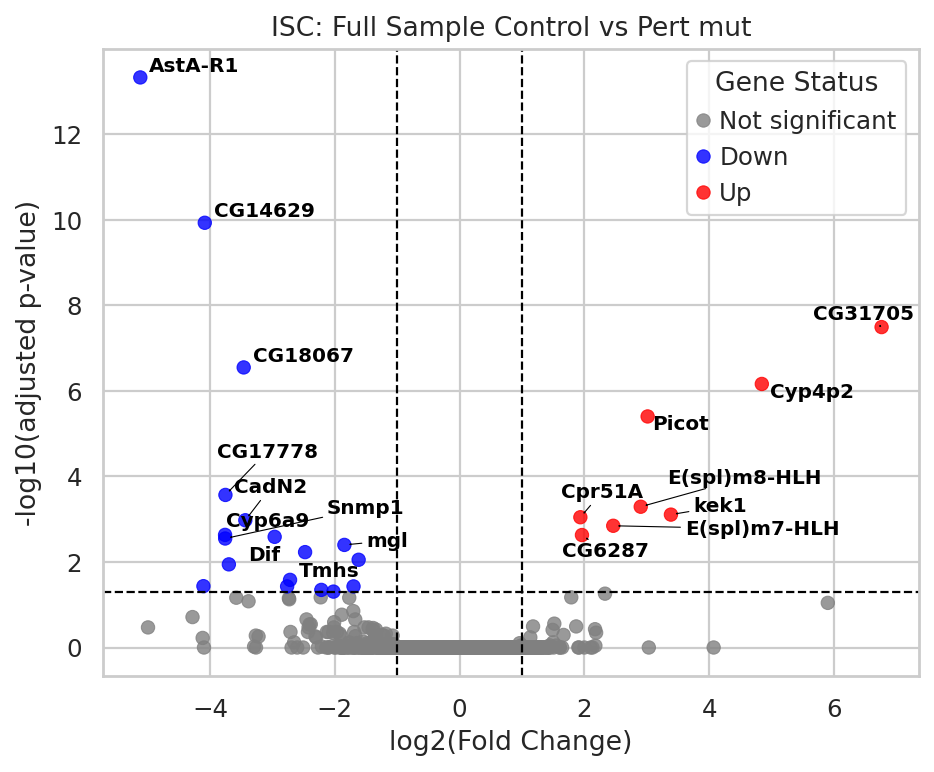


LFC
Cell counts: [282, 0, 298, 1]
Insufficient cells
LFC
Cell counts: [282, 3, 298, 0]
Insufficient cells
LFC
Cell counts: [282, 25, 298, 28]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.84 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.83 seconds.

Fitting LFCs...
... done in 0.51 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.30 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        28.066556       -0.235222  0.622558 -0.377832  0.705555  0.980186
Alg-2      109.859337       -0.269363  0.460975 -0.584333  0.558996  0.968464
Tim17b     131.544312       -0.477592  0.424331 -1.125518  0.260369  0.867933
CG41128     50.613351       -0.827066  0.642730 -1.286802  0.198163  0.815382
CG41099     14.790986       -0.294175  0.733467 -0.401074  0.688365  0.980186
...               ...             ...       ...       ...       ...       ...
mt:ND4     248.024744       -0.544811  0.507887 -1.072702  0.283405  0.881188
mt:ND4L     64.722749       -0.767675  0.582531 -1.317827  0.187561  0.806622
mt:ND6      68.826899       -0.939842  0.655469 -1.433847  0.151616  0.758363
mt:Cyt-b  3108.437636       -0.427323  0.537154 -0.795532  0.426304  0.937054
mt:ND1     164.061807       -0.575323  0.488163 -1.178546  0.238579  0.851776

[5

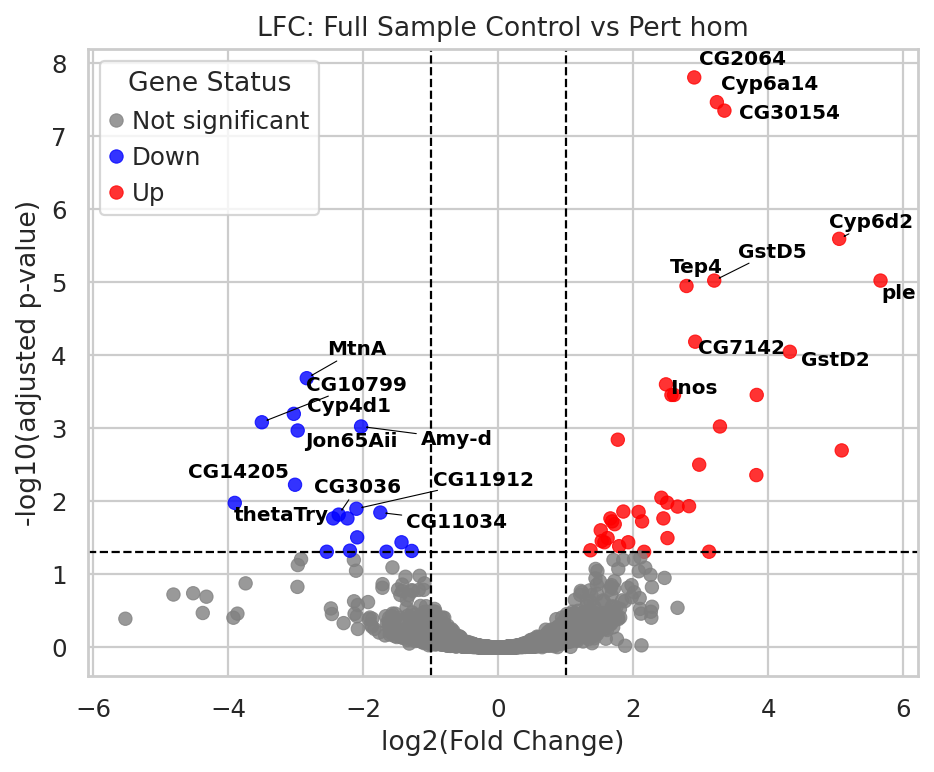


LFC
Cell counts: [282, 28, 298, 28]


/scratch/jobs/60613130/ipykernel_3196038/145479499.py:14: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['het_hom_status'], ['het', 'hom'])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.82 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.85 seconds.

Fitting LFCs...
... done in 0.64 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.28 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        29.824263       -0.154927  0.623512 -0.248474  0.803767  0.992424
Alg-2      116.737169       -0.204429  0.466312 -0.438395  0.661100  0.992424
Tim17b     135.071127       -0.525308  0.428116 -1.227021  0.219815  0.910601
CG41128     55.459603       -0.623195  0.645830 -0.964953  0.334568  0.962222
CG41099     14.836697       -0.409487  0.745754 -0.549092  0.582942  0.992424
...               ...             ...       ...       ...       ...       ...
mt:ND4     257.727506       -0.552089  0.504835 -1.093603  0.274129  0.938620
mt:ND4L     66.013209       -0.846616  0.578851 -1.462579  0.143583  0.845324
mt:ND6      69.405062       -1.072121  0.643154 -1.666975  0.095519  0.770393
mt:Cyt-b  3198.700952       -0.468235  0.525968 -0.890234  0.373340  0.981325
mt:ND1     168.363433       -0.628965  0.488759 -1.286863  0.198142  0.892080

[5

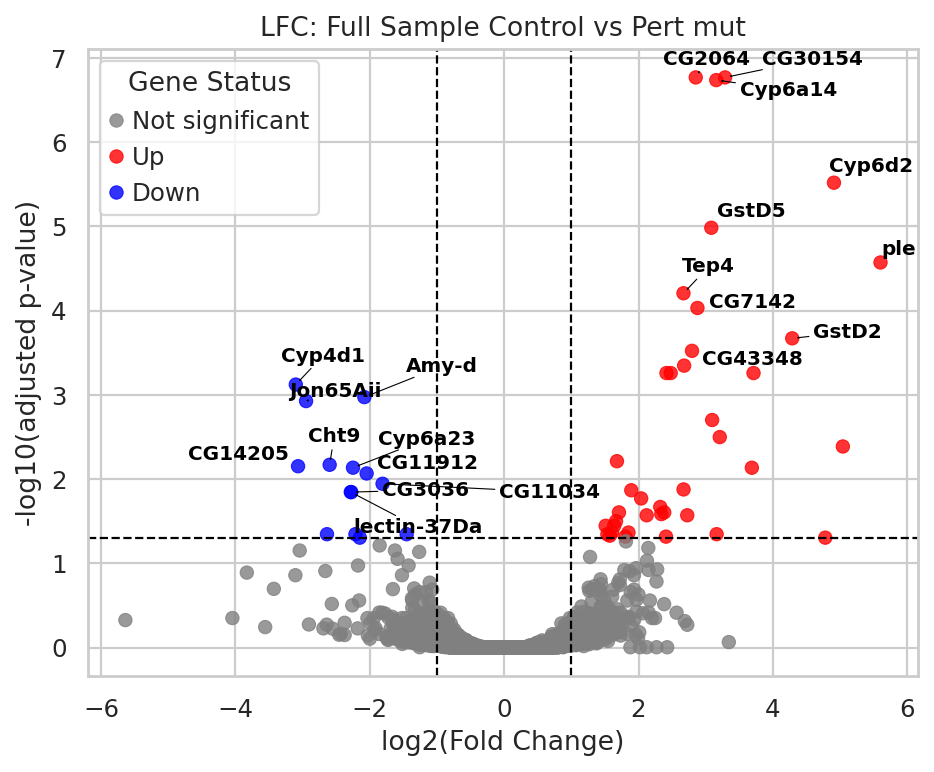


MT
Cell counts: [5, 9, 51, 16]
Insufficient cells
MT
Cell counts: [5, 1, 51, 3]
Insufficient cells
MT
Cell counts: [5, 12, 51, 12]
Insufficient cells
MT
Cell counts: [5, 13, 51, 15]
Insufficient cells
VM
Cell counts: [92, 1, 38, 0]
Insufficient cells
VM
Cell counts: [92, 1, 38, 1]
Insufficient cells
VM
Cell counts: [92, 10, 38, 7]
Insufficient cells
VM
Cell counts: [92, 11, 38, 8]
Insufficient cells
aEC
Cell counts: [764, 1, 407, 0]
Insufficient cells
aEC
Cell counts: [764, 4, 407, 1]
Insufficient cells
aEC
Cell counts: [764, 36, 407, 20]


/scratch/jobs/60613130/ipykernel_3196038/145479499.py:14: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['het_hom_status'], ['het', 'hom'])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.86 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.83 seconds.

Fitting LFCs...
... done in 0.50 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.29 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       4.111652       -0.273441  1.453309 -0.188151  0.850758       NaN
Parp        51.262417        1.097035  0.659007  1.664677  0.095977  0.620160
Alg-2       91.744576       -0.378444  0.554572 -0.682408  0.494981  0.987257
Tim17b     121.591773       -0.445001  0.541221 -0.822218  0.410953  0.964452
CG41128     49.989338        0.061720  0.636470  0.096973  0.922748  0.993479
...               ...             ...       ...       ...       ...       ...
mt:ND4     344.783917       -0.509143  0.578695 -0.879812  0.378961  0.964277
mt:ND4L     89.244865       -2.032741  0.683455 -2.974216  0.002937  0.076509
mt:ND6     126.860766       -1.162054  0.676404 -1.717989  0.085799  0.603410
mt:Cyt-b  4448.220725       -0.955010  0.632708 -1.509401  0.131196  0.703049
mt:ND1     215.253008       -0.723531  0.560284 -1.291364  0.196578  0.806472

[5

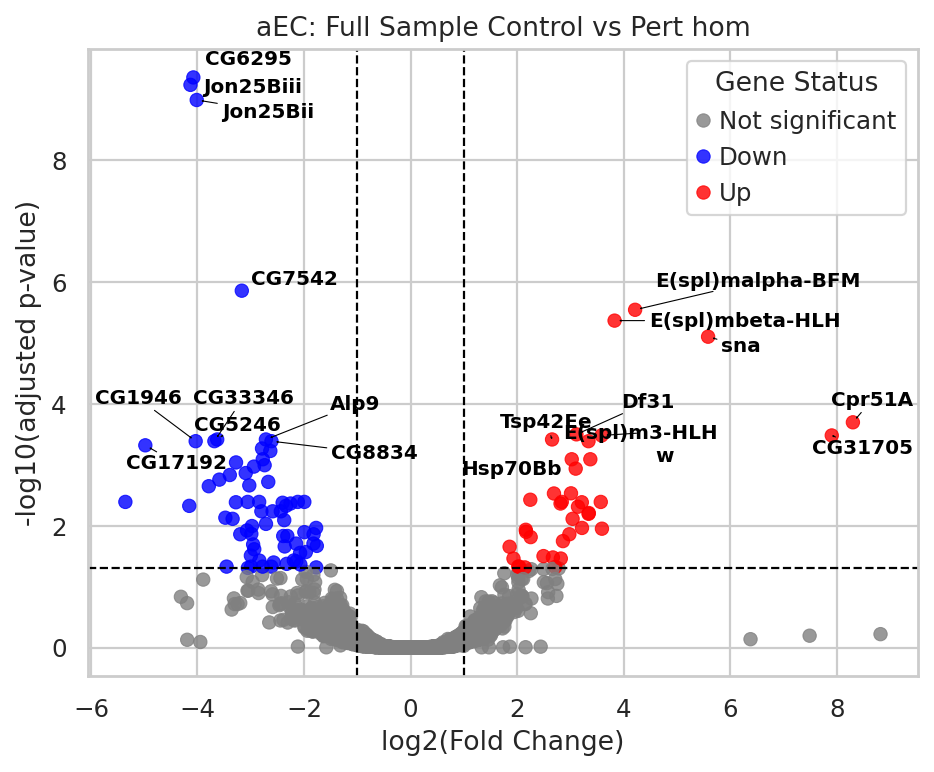


aEC
Cell counts: [764, 40, 407, 21]


/scratch/jobs/60613130/ipykernel_3196038/145479499.py:14: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['het_hom_status'], ['het', 'hom'])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.85 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.88 seconds.

Fitting LFCs...
... done in 0.53 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.28 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       4.019933       -0.419234  1.489864 -0.281391  0.778411       NaN
Parp        52.766302        1.083087  0.657129  1.648211  0.099309  0.666511
Alg-2       94.185276       -0.398246  0.549503 -0.724739  0.468612  0.995630
Tim17b     126.210970       -0.428091  0.534412 -0.801050  0.423102  0.995630
CG41128     50.830009        0.018355  0.624268  0.029402  0.976544  0.998479
...               ...             ...       ...       ...       ...       ...
mt:ND4     351.081582       -0.557491  0.566988 -0.983250  0.325484  0.976453
mt:ND4L     92.173805       -2.020917  0.677347 -2.983578  0.002849  0.081726
mt:ND6     127.981294       -1.273620  0.670121 -1.900583  0.057357  0.514431
mt:Cyt-b  4564.307156       -0.981615  0.625141 -1.570229  0.116362  0.712331
mt:ND1     218.087445       -0.797997  0.553837 -1.440852  0.149627  0.778901

[5

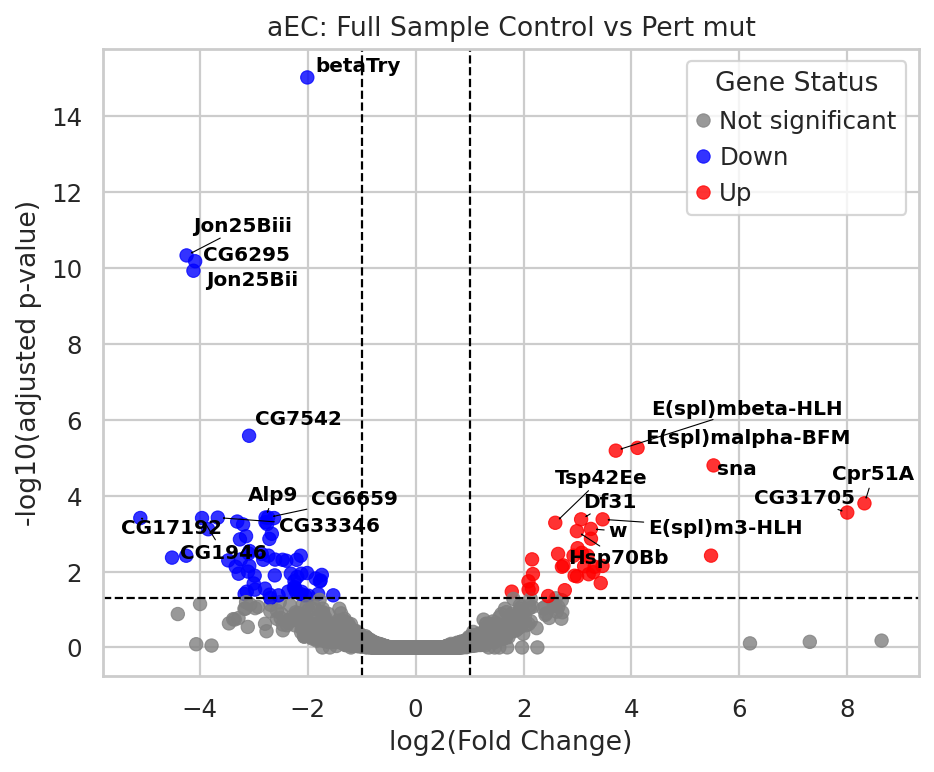


dEC
Cell counts: [146, 2, 398, 9]
Insufficient cells
dEC
Cell counts: [146, 11, 398, 2]
Insufficient cells
dEC
Cell counts: [146, 188, 398, 248]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.95 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.05 seconds.

Fitting LFCs...
... done in 0.70 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.33 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        535.183878       -0.547841  0.278954 -1.963907  0.049541  0.999285
Alg-2       771.264276       -0.297186  0.291044 -1.021102  0.307206  0.999285
Tim17b      921.025408       -0.267345  0.267595 -0.999065  0.317763  0.999285
CG41128     394.473112       -0.340881  0.348759 -0.977410  0.328366  0.999285
CG41099     111.058736        0.151020  0.371065  0.406992  0.684014  0.999285
...                ...             ...       ...       ...       ...       ...
mt:ND4     1900.566150       -0.336584  0.253946 -1.325416  0.185033  0.999285
mt:ND4L     578.604919       -0.264206  0.299242 -0.882918  0.377280  0.999285
mt:ND6      577.099993       -0.606217  0.314598 -1.926961  0.053985  0.999285
mt:Cyt-b  19472.618730       -0.222587  0.341383 -0.652017  0.514390  0.999285
mt:ND1     1190.778304       -0.595203  0.259391 -2.294614  0.021755  

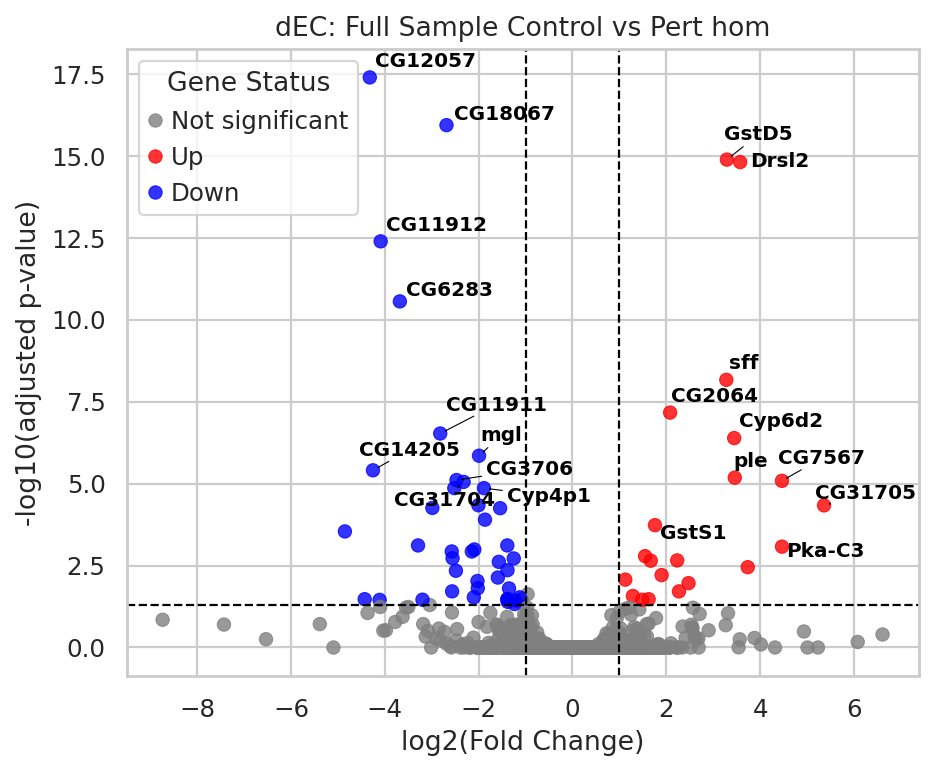


dEC
Cell counts: [146, 199, 398, 250]


/scratch/jobs/60613130/ipykernel_3196038/145479499.py:14: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['het_hom_status'], ['het', 'hom'])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.94 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.05 seconds.

Fitting LFCs...
... done in 0.71 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.32 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        543.907954       -0.548647  0.276713 -1.982728  0.047398  0.978239
Alg-2       785.086233       -0.292459  0.288786 -1.012719  0.311194  0.999819
Tim17b      939.959368       -0.254658  0.264265 -0.963647  0.335223  0.999819
CG41128     403.707583       -0.318141  0.348643 -0.912514  0.361498  0.999819
CG41099     111.106131        0.107988  0.367922  0.293509  0.769133  0.999819
...                ...             ...       ...       ...       ...       ...
mt:ND4     1933.033738       -0.334598  0.251362 -1.331142  0.183142  0.999819
mt:ND4L     586.202898       -0.274728  0.297691 -0.922864  0.356078  0.999819
mt:ND6      588.128922       -0.596520  0.312034 -1.911717  0.055912  0.999819
mt:Cyt-b  19781.901697       -0.224219  0.338923 -0.661562  0.508252  0.999819
mt:ND1     1207.207860       -0.604672  0.256159 -2.360535  0.018249  

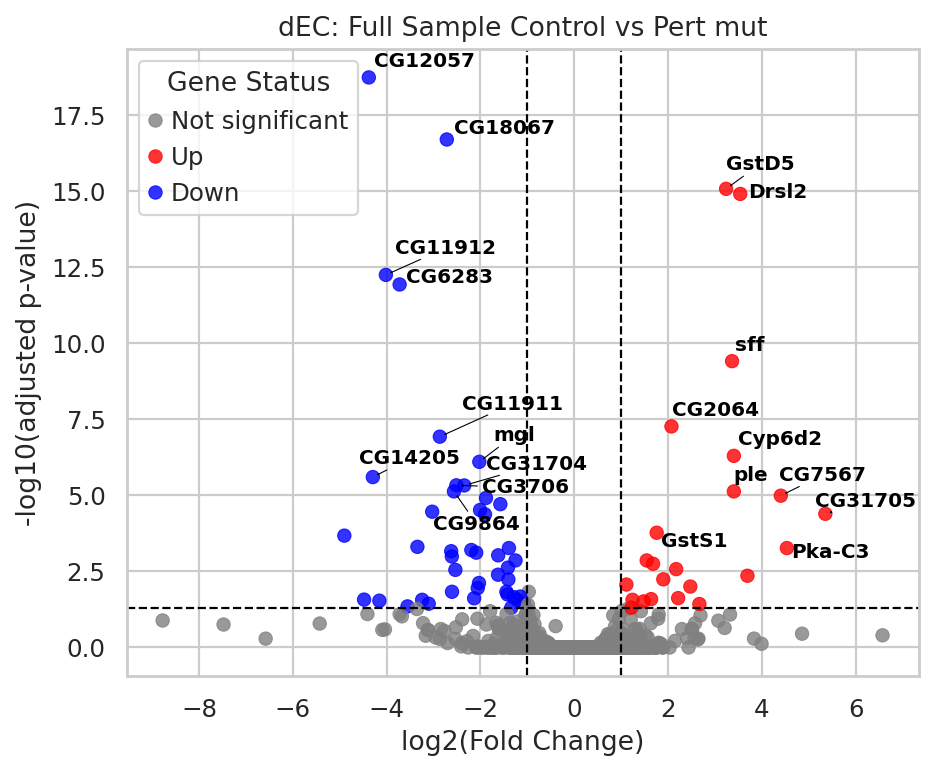


dMT
Cell counts: [24, 0, 79, 0]
Insufficient cells
dMT
Cell counts: [24, 1, 79, 1]
Insufficient cells
dMT
Cell counts: [24, 48, 79, 65]
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.44 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.47 seconds.

Fitting LFCs...
... done in 0.29 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.15 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        39.364173       -0.331048  0.526009 -0.629358  0.529115  0.999968
Alg-2       20.522842       -0.203921  0.677005 -0.301211  0.763254  0.999968
Tim17b      25.573553        0.403829  0.624184  0.646971  0.517651  0.999968
CG41128      6.145025       -0.206614  1.152402 -0.179290  0.857710  0.999968
Gfat1        4.202370        1.851555  1.643669  1.126477  0.259964  0.999968
...               ...             ...       ...       ...       ...       ...
mt:ND4      93.061725       -0.358716  0.431873 -0.830607  0.406196  0.999968
mt:ND4L     35.024939       -0.243231  0.549635 -0.442532  0.658104  0.999968
mt:ND6      38.362836       -0.898804  0.656489 -1.369108  0.170966  0.999968
mt:Cyt-b  1278.780858       -0.225769  0.416368 -0.542235  0.587657  0.999968
mt:ND1      52.488979       -0.483484  0.516475 -0.936123  0.349210  0.999968

[3

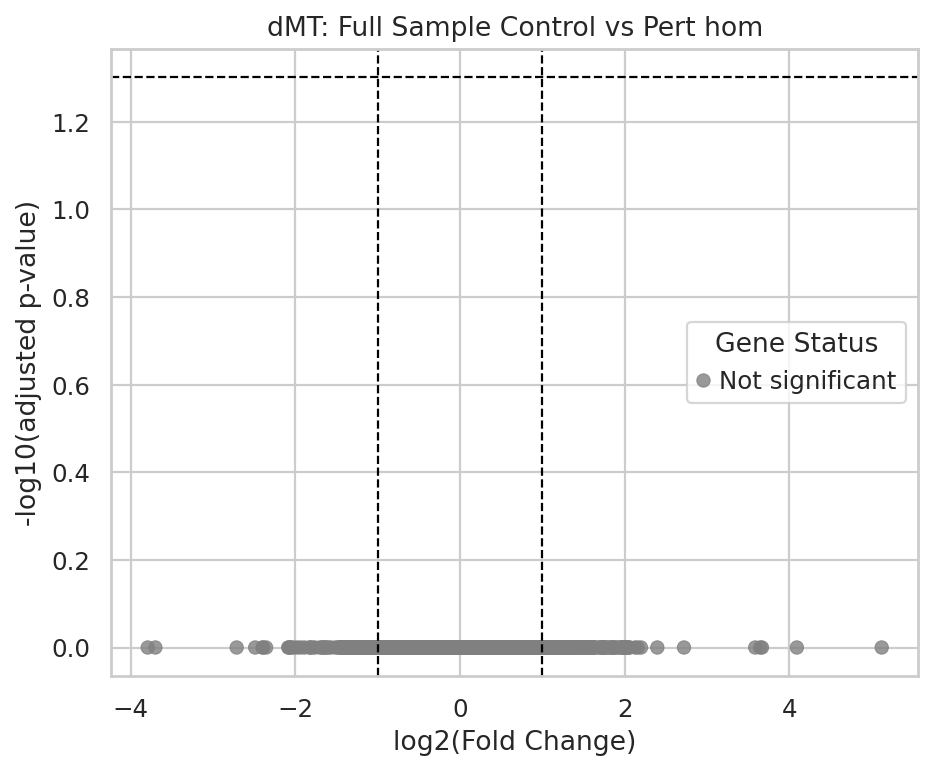


dMT
Cell counts: [24, 49, 79, 66]
Using None as control genes, passed at DeseqDataSet initialization


/scratch/jobs/60613130/ipykernel_3196038/145479499.py:14: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['het_hom_status'], ['het', 'hom'])]
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.40 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.48 seconds.

Fitting LFCs...
... done in 0.30 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.16 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        40.671258       -0.324054  0.514842 -0.629424  0.529071  0.999981
Alg-2       21.246056       -0.194618  0.662420 -0.293798  0.768912  0.999981
Tim17b      26.721673        0.434412  0.608018  0.714472  0.474935  0.999981
CG41128      6.373439       -0.179213  1.132694 -0.158218  0.874285  0.999981
Gfat1        3.972460        1.716601  1.656896  1.036034  0.300186  0.999981
...               ...             ...       ...       ...       ...       ...
mt:ND4      96.307377       -0.346438  0.423926 -0.817214  0.413806  0.999981
mt:ND4L     35.513454       -0.292470  0.543941 -0.537687  0.590793  0.999981
mt:ND6      39.593313       -0.900413  0.647623 -1.390335  0.164427  0.999981
mt:Cyt-b  1304.686868       -0.263027  0.406411 -0.647193  0.517507  0.999981
mt:ND1      54.559028       -0.453470  0.505680 -0.896753  0.369851  0.999981

[3

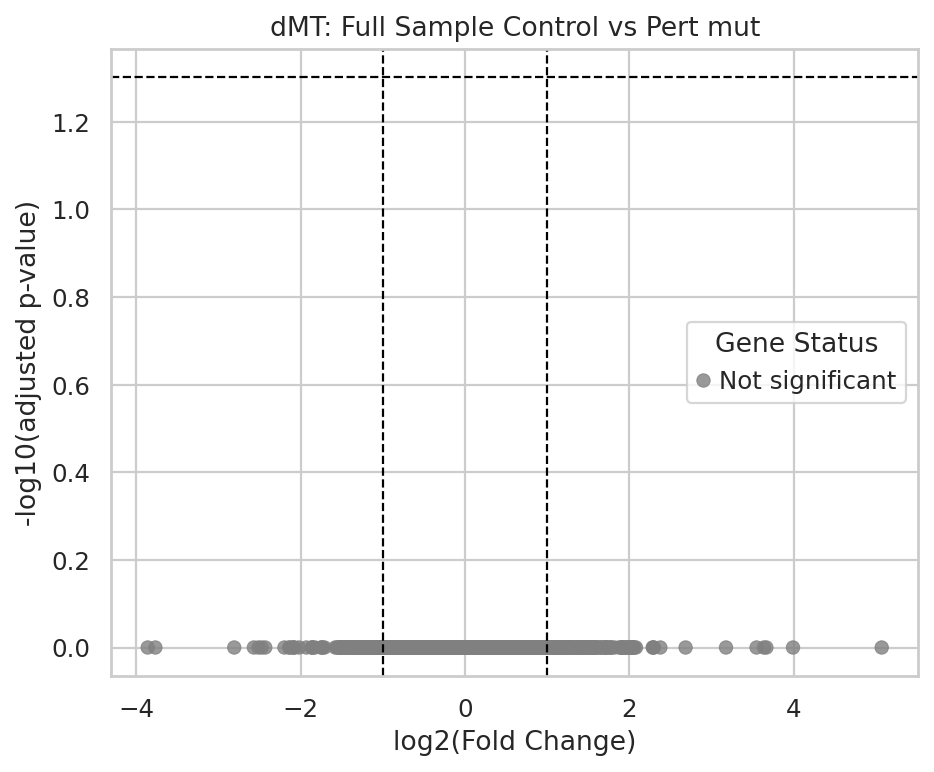


mEC
Cell counts: [44, 3, 46, 2]
Insufficient cells
mEC
Cell counts: [44, 0, 46, 1]
Insufficient cells
mEC
Cell counts: [44, 0, 46, 4]
Insufficient cells
mEC
Cell counts: [44, 0, 46, 5]
Insufficient cells
pEC
Cell counts: [402, 1, 219, 0]
Insufficient cells
pEC
Cell counts: [402, 0, 219, 0]
Insufficient cells
pEC
Cell counts: [402, 51, 219, 53]


/scratch/jobs/60613130/ipykernel_3196038/145479499.py:14: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['het_hom_status'], ['het', 'hom'])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.69 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.80 seconds.

Fitting LFCs...
... done in 0.62 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.27 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        33.557585       -0.782483  0.623383 -1.255219  0.209399  0.795698
Alg-2      105.233303       -0.485285  0.441952 -1.098050  0.272183  0.862744
Tim17b     137.614983       -0.477355  0.428582 -1.113800  0.265365  0.857532
CG41128     41.445134       -0.956650  0.550537 -1.737667  0.082269  0.536505
CG41099     17.871807       -0.415617  0.711630 -0.584035  0.559197  0.955534
...               ...             ...       ...       ...       ...       ...
mt:ND4     344.673393       -0.128562  0.388551 -0.330875  0.740739  0.967506
mt:ND4L     78.392050       -0.697950  0.506583 -1.377759  0.168278  0.740496
mt:ND6     105.823659       -0.797367  0.527852 -1.510589  0.130893  0.669271
mt:Cyt-b  4237.991171       -0.363007  0.430554 -0.843118  0.399163  0.910951
mt:ND1     201.246534       -0.488662  0.422895 -1.155515  0.247879  0.844236

[5

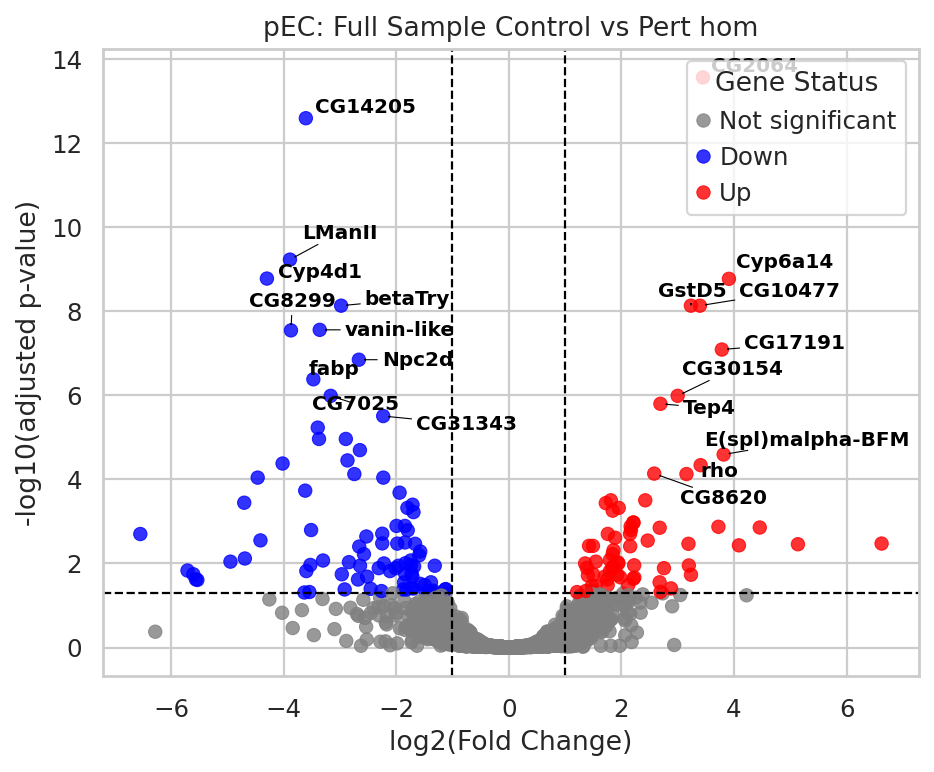


pEC
Cell counts: [402, 51, 219, 53]


/scratch/jobs/60613130/ipykernel_3196038/145479499.py:14: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['het_hom_status'], ['het', 'hom'])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.72 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.86 seconds.

Fitting LFCs...
... done in 0.46 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.26 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        33.557585       -0.782483  0.623383 -1.255219  0.209399  0.795698
Alg-2      105.233303       -0.485285  0.441952 -1.098050  0.272183  0.862744
Tim17b     137.614983       -0.477355  0.428582 -1.113800  0.265365  0.857532
CG41128     41.445134       -0.956650  0.550537 -1.737667  0.082269  0.536505
CG41099     17.871807       -0.415617  0.711630 -0.584035  0.559197  0.955534
...               ...             ...       ...       ...       ...       ...
mt:ND4     344.673393       -0.128562  0.388551 -0.330875  0.740739  0.967506
mt:ND4L     78.392050       -0.697950  0.506583 -1.377759  0.168278  0.740496
mt:ND6     105.823659       -0.797367  0.527852 -1.510589  0.130893  0.669271
mt:Cyt-b  4237.991171       -0.363007  0.430554 -0.843118  0.399163  0.910951
mt:ND1     201.246534       -0.488662  0.422895 -1.155515  0.247879  0.844236

[5

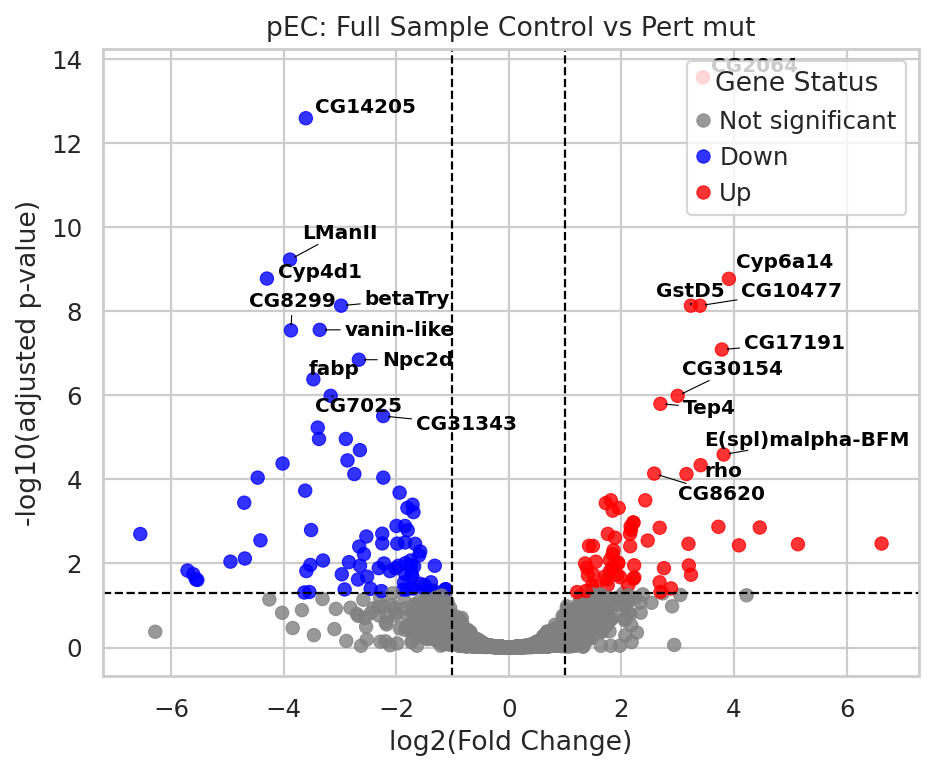


ISC/EB
Cell counts: [1917, 4, 3251, 11]
Insufficient cells
ISC/EB
Cell counts: [1917, 20, 3251, 13]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.29 seconds.

Fitting dispersion trend curve...
/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:805: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.09 seconds.

Fitting LFCs...
... done in 0.65 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.36 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       8.577109        0.117801  1.198129  0.098321  0.921678  0.999249
Pzl          1.766917       -1.102614  2.465209 -0.447270  0.654680  0.999249
Parp       291.570653       -0.452050  0.616101 -0.733726  0.463116  0.999249
Alg-2      208.582532        0.213217  0.609812  0.349644  0.726606  0.999249
Tim17b     316.131430       -0.023047  0.596162 -0.038659  0.969162  0.999249
...               ...             ...       ...       ...       ...       ...
mt:ND4     883.716841       -0.506930  0.634763 -0.798614  0.424515  0.999249
mt:ND4L    328.800970       -0.696973  0.644804 -1.080907  0.279738  0.999249
mt:ND6     335.098095       -0.740444  0.698327 -1.060312  0.289003  0.999249
mt:Cyt-b  9599.295924       -0.731632  0.671887 -1.088921  0.276189  0.999249
mt:ND1     441.259921       -0.829905  0.681992 -1.216884  0.223648  0.999249

[7

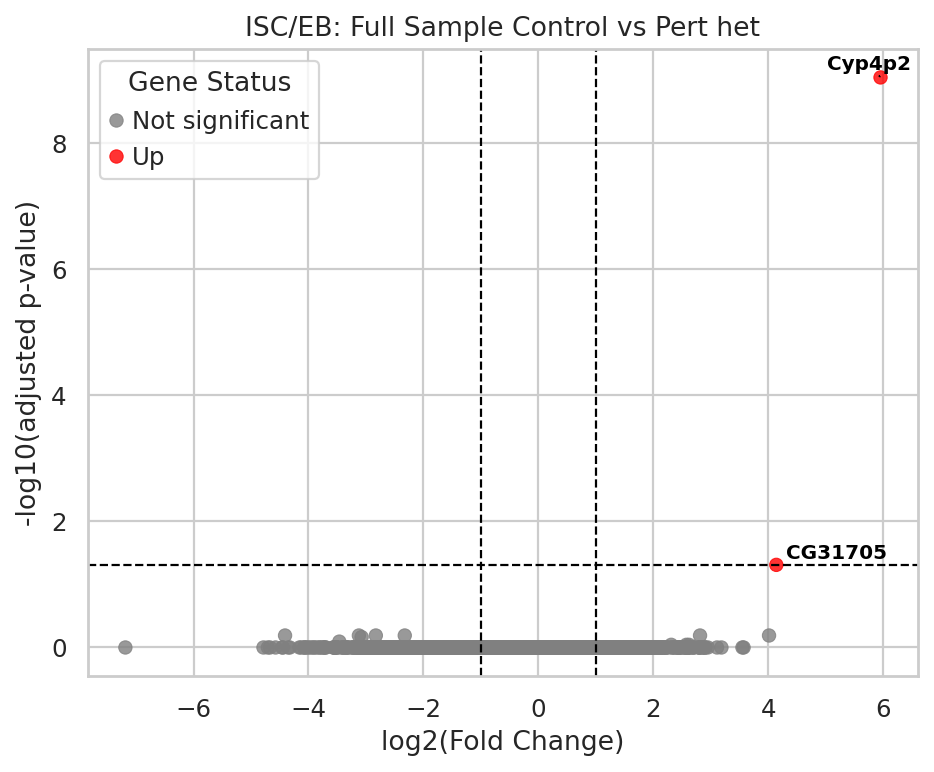


ISC/EB
Cell counts: [1917, 885, 3251, 1151]


Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.29 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.15 seconds.

Fitting LFCs...
... done in 0.65 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.30 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       54.359181       -0.171826  0.537447 -0.319708  0.749189  0.999991
Pzl          17.737118       -1.190602  0.832459 -1.430223  0.152653  0.999991
Parp       2110.863755       -0.326533  0.336816 -0.969470  0.332311  0.999991
Alg-2      1241.778030       -0.245718  0.339159 -0.724494  0.468763  0.999991
Tim17b     2178.359842       -0.058643  0.336208 -0.174424  0.861532  0.999991
...                ...             ...       ...       ...       ...       ...
mt:ND4     6010.575469       -0.590454  0.398495 -1.481711  0.138417  0.999991
mt:ND4L    2149.274475       -0.949853  0.389506 -2.438612  0.014744  0.520034
mt:ND6     2171.313894       -1.033594  0.454989 -2.271691  0.023105  0.626886
mt:Cyt-b  67470.809615       -0.693960  0.450347 -1.540945  0.123330  0.999991
mt:ND1     3191.022002       -0.682590  0.419099 -1.628709  0.103375  

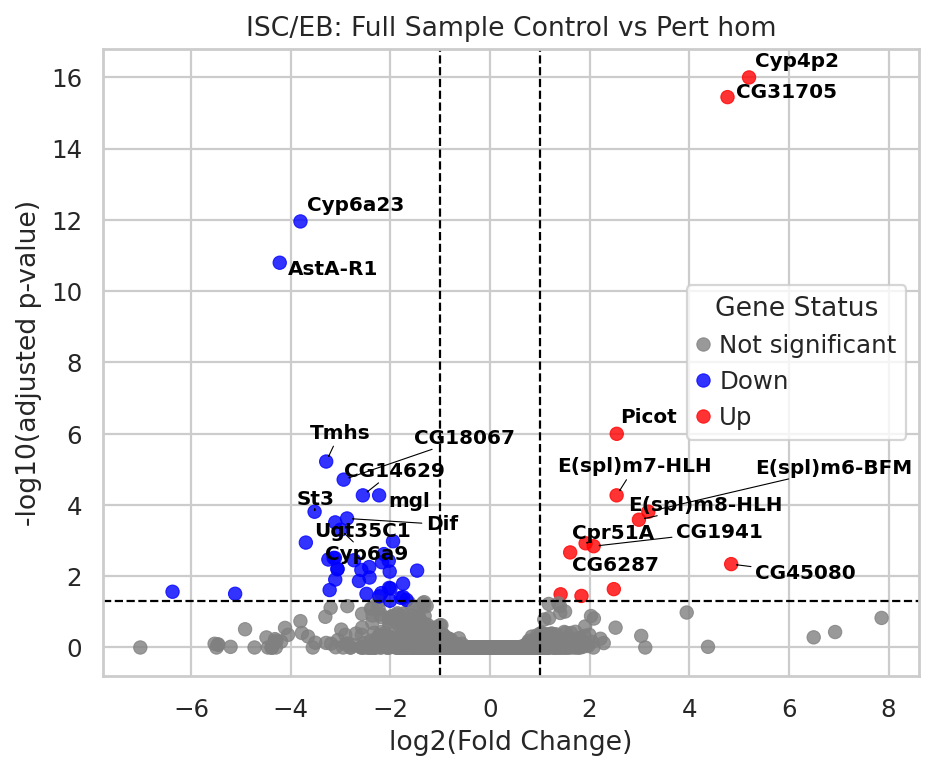


ISC/EB
Cell counts: [1917, 905, 3251, 1164]


/scratch/jobs/60613130/ipykernel_3196038/145479499.py:14: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['het_hom_status'], ['het', 'hom'])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.13 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.30 seconds.

Fitting LFCs...
... done in 0.61 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.36 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       55.152530       -0.159670  0.537124 -0.297269  0.766261  0.999379
Pzl          17.806118       -1.220168  0.834159 -1.462752  0.143535  0.999379
Parp       2131.718922       -0.327686  0.336950 -0.972506  0.330799  0.999379
Alg-2      1259.416708       -0.233387  0.339108 -0.688239  0.491303  0.999379
Tim17b     2201.893796       -0.056952  0.336192 -0.169402  0.865480  0.999379
...                ...             ...       ...       ...       ...       ...
mt:ND4     6076.436718       -0.588009  0.398908 -1.474046  0.140469  0.999379
mt:ND4L    2174.835420       -0.943088  0.389594 -2.420694  0.015491  0.521762
mt:ND6     2197.151884       -1.026623  0.455286 -2.254898  0.024140  0.636567
mt:Cyt-b  68159.003004       -0.694305  0.450734 -1.540388  0.123466  0.999379
mt:ND1     3222.322344       -0.684347  0.419678 -1.630648  0.102965  

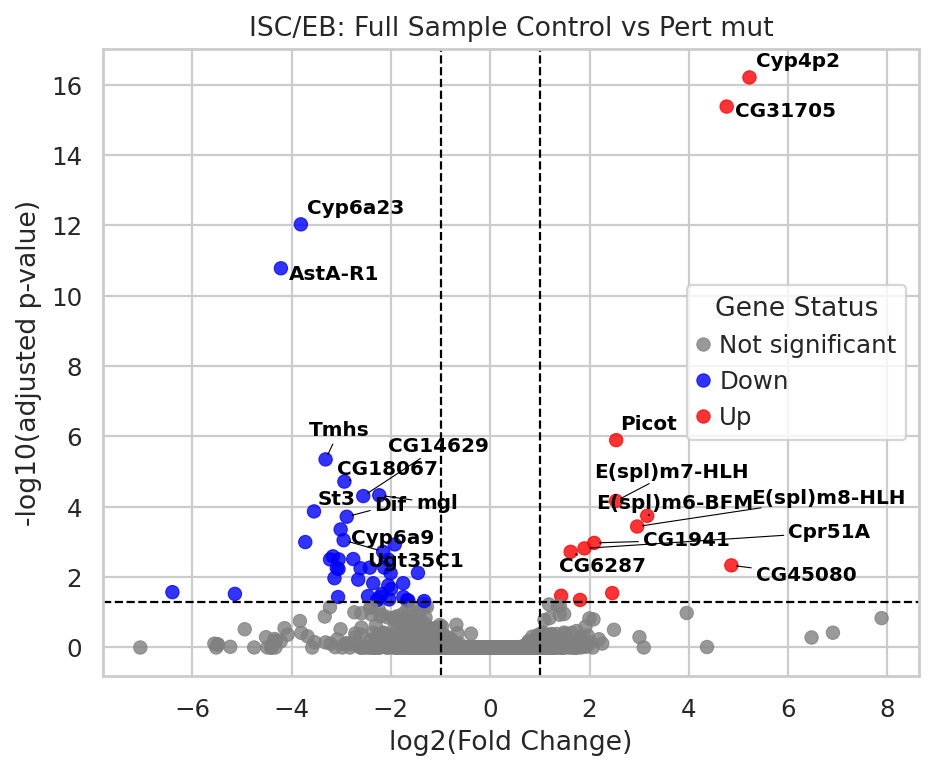

In [29]:
for ct in cluster_celltypes:
    for comp_val in ['wt', 'het', 'hom', 'mut']:
        fig_title = f'{ct}: Full Sample Control vs Pert {comp_val}'
        comparison = fig_title.replace(':', '').replace(' ', '_')
        print(ct)
        X = np.zeros((4, raw_comb_adata.X.shape[1]))
        n_cells = []
        meta_index, meta_vals = [], []
        for i, run_label in enumerate(run_labels):
            tmp = raw_comb_adata[raw_comb_adata.obs['batch'] == run_label]
            tmp = tmp[np.isin(tmp.obs['celltype'], ct.split('/'))]
            if run_label in pert_run_labels:
                if comp_val == 'mut':
                    tmp = tmp[np.in1d(tmp.obs['het_hom_status'], ['het', 'hom'])]
                else:
                    tmp = tmp[tmp.obs['het_hom_status'] == comp_val]
            meta_index.append(run_label)
            meta_vals.append(run_label.split()[-1])
            n_cells.append(len(tmp))
            X[i] = tmp.X.sum(axis=0)
        metadata = pd.DataFrame(meta_vals, index=meta_index, columns=['condition'])
        n_cells_given_comparison[comparison] = n_cells
        print(f'Cell counts: {n_cells}')
        if min(n_cells) < min_cells_per_condition:
            print('Insufficient cells')
            continue
    
        counts_df = pd.DataFrame(X, index=meta_index, columns=tmp.var.index)
        counts_df = counts_df[counts_df.columns[counts_df.max() > min_max_reads_per_gene]]
    
        inference = DefaultInference(n_cpus=4)
        dds = DeseqDataSet(
            counts=counts_df,
            metadata=metadata,
            design="~condition",  # compare samples based on the "condition"
            refit_cooks=True,
            inference=inference,
            n_cpus=4,
        )
    
        dds.deseq2()

        ref_name, var_name = comp_vals
        ds = DeseqStats(dds, contrast=['condition', 'LamC', 'ctrl'], inference=inference)
        ds.summary()
        results_df = ds.results_df
        results_df_given_comparison[comparison] = results_df
        plot_volcano(results_df, fig_title=fig_title)
    
        print()


### Wt-like and Het-like

CC
Cell counts: [97, 18, 94, 7]
Insufficient cells
CC
Cell counts: [97, 4, 94, 2]
Insufficient cells
CC
Cell counts: [97, 1, 94, 2]
Insufficient cells
CC
Cell counts: [97, 5, 94, 4]
Insufficient cells
EB
Cell counts: [942, 158, 1385, 211]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.01 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.05 seconds.

Fitting LFCs...
... done in 0.74 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.35 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
Myo81F       15.440965        0.035387  0.859076  0.041192  0.967143  0.99965
Pzl           4.600528       -1.015945  1.490157 -0.681771  0.495384  0.99965
Parp        682.591705       -0.300480  0.354561 -0.847471  0.396733  0.99965
Alg-2       434.788889       -0.237995  0.360257 -0.660625  0.508853  0.99965
Tim17b      762.431125       -0.074750  0.347488 -0.215114  0.829678  0.99965
...                ...             ...       ...       ...       ...      ...
mt:ND4     2113.576145       -0.599162  0.409341 -1.463721  0.143270  0.99965
mt:ND4L     786.928518       -0.783637  0.398932 -1.964335  0.049491  0.99965
mt:ND6      784.174867       -0.937976  0.468172 -2.003487  0.045125  0.99965
mt:Cyt-b  24416.474285       -0.580778  0.450475 -1.289256  0.197309  0.99965
mt:ND1     1164.909837       -0.603532  0.438014 -1.377882  0.168240  0.99965

[7

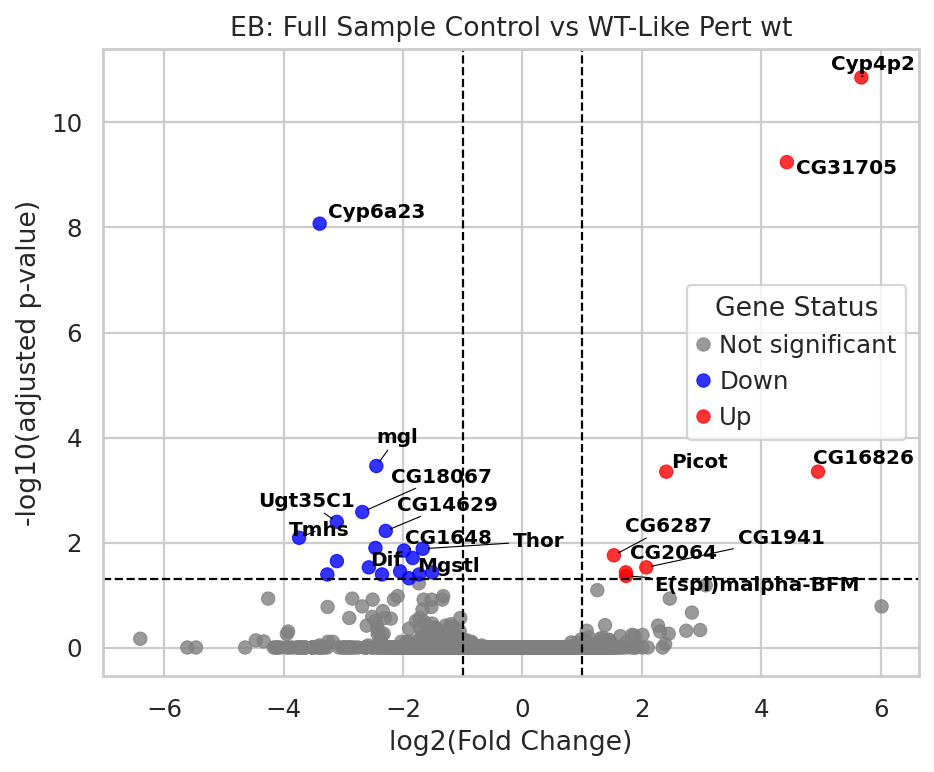


EB
Cell counts: [942, 156, 1385, 198]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.03 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.08 seconds.

Fitting LFCs...
... done in 0.75 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.29 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       17.029279        0.311384  0.799384  0.389530  0.696884       NaN
Pzl           3.747180       -2.571105  2.001934 -1.284310  0.199033       NaN
Parp        681.536443       -0.365576  0.349107 -1.047174  0.295019  0.999333
Alg-2       446.268298       -0.213950  0.354045 -0.604301  0.545644  0.999333
Tim17b      810.000914        0.047204  0.342016  0.138017  0.890227  0.999333
...                ...             ...       ...       ...       ...       ...
mt:ND4     2128.441121       -0.640823  0.397757 -1.611093  0.107160  0.999333
mt:ND4L     781.404584       -0.886114  0.392757 -2.256138  0.024062  0.543125
mt:ND6      765.359791       -1.126098  0.461833 -2.438323  0.014756  0.433435
mt:Cyt-b  23579.893439       -0.781623  0.432977 -1.805229  0.071039  0.909321
mt:ND1     1134.458633       -0.772340  0.422444 -1.828265  0.067510  

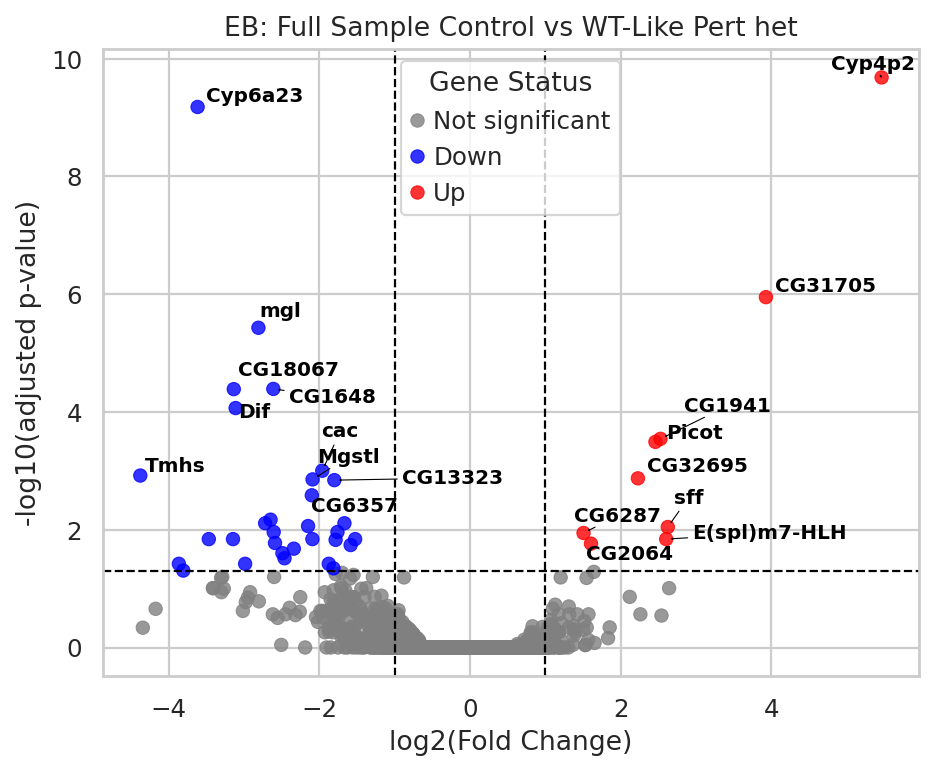


EB
Cell counts: [942, 93, 1385, 105]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.07 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.07 seconds.

Fitting LFCs...
... done in 0.78 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.34 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       10.574024       -0.284580  1.012535 -0.281057  0.778667  0.999291
Pzl           3.100589       -1.803249  2.066189 -0.872742  0.382804       NaN
Parp        518.986446       -0.351596  0.385669 -0.911651  0.361953  0.999291
Alg-2       350.577302       -0.106322  0.388459 -0.273703  0.784313  0.999291
Tim17b      605.930864        0.008777  0.385837  0.022747  0.981852  0.999291
...                ...             ...       ...       ...       ...       ...
mt:ND4     1642.614798       -0.577306  0.432611 -1.334467  0.182051  0.999291
mt:ND4L     574.857121       -1.015081  0.425607 -2.385019  0.017078  0.736350
mt:ND6      587.900554       -1.068567  0.499796 -2.138009  0.032516  0.858141
mt:Cyt-b  18200.947559       -0.713166  0.471693 -1.511929  0.130552  0.999291
mt:ND1      914.205509       -0.546553  0.465595 -1.173881  0.240443  

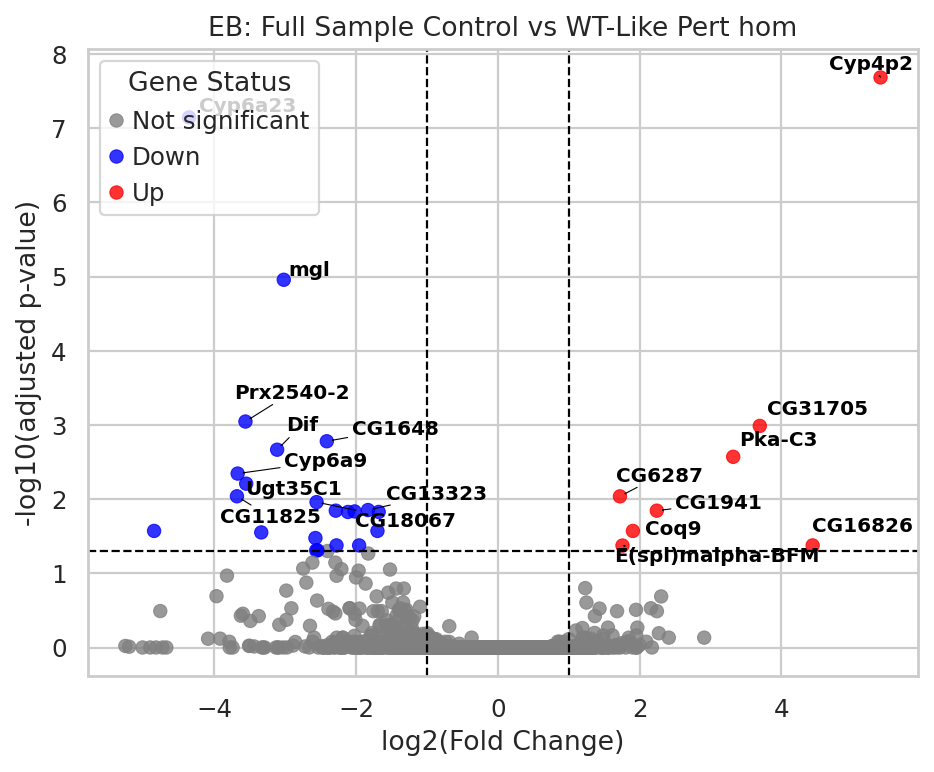


EB
Cell counts: [942, 249, 1385, 303]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.99 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.05 seconds.

Fitting LFCs...
... done in 0.58 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.33 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       20.061946        0.125093  0.743466  0.168256  0.866382  0.999963
Pzl           4.873729       -2.203835  1.640524 -1.343372  0.179151  0.999963
Parp        856.025126       -0.368125  0.345138 -1.066602  0.286152  0.999963
Alg-2       567.612564       -0.177804  0.348895 -0.509620  0.610317  0.999963
Tim17b     1009.400919        0.022362  0.336966  0.066363  0.947089  0.999963
...                ...             ...       ...       ...       ...       ...
mt:ND4     2692.163176       -0.617199  0.399989 -1.543041  0.122821  0.999963
mt:ND4L     970.620759       -0.935017  0.390865 -2.392172  0.016749  0.477602
mt:ND6      966.773634       -1.102104  0.460854 -2.391438  0.016783  0.477602
mt:Cyt-b  29825.961630       -0.755846  0.438639 -1.723163  0.084859  0.999963
mt:ND1     1459.287888       -0.682858  0.426054 -1.602751  0.108990  

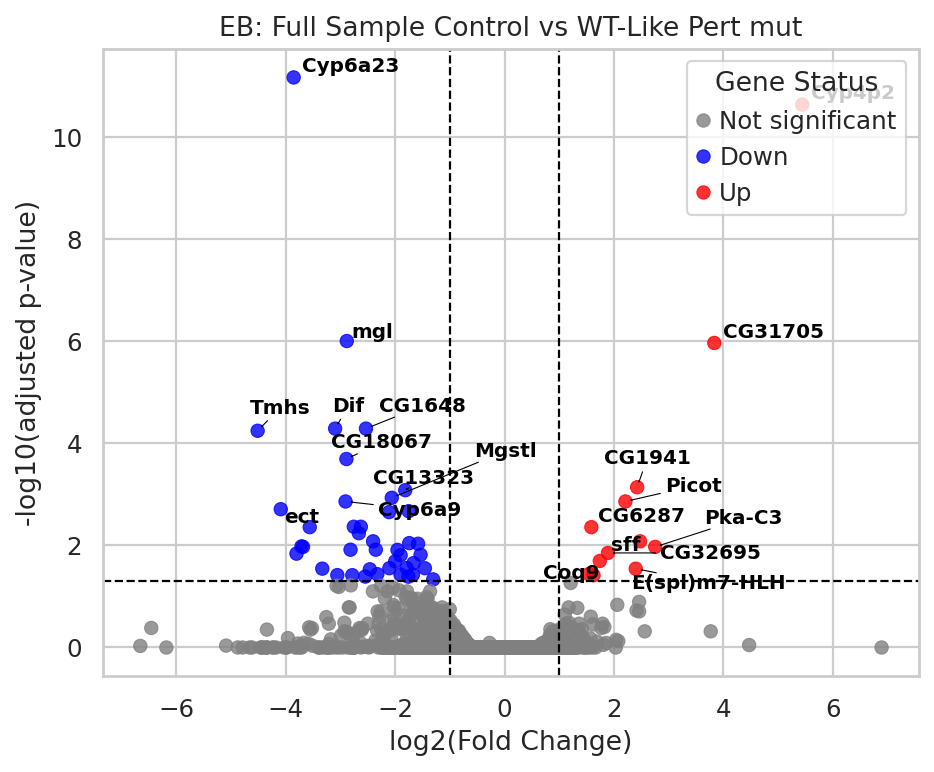


EE
Cell counts: [23, 7, 131, 8]
Insufficient cells
EE
Cell counts: [23, 3, 131, 7]
Insufficient cells
EE
Cell counts: [23, 2, 131, 8]
Insufficient cells
EE
Cell counts: [23, 5, 131, 15]
Insufficient cells
EEP
Cell counts: [27, 11, 194, 10]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.73 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.68 seconds.

Fitting LFCs...
... done in 0.46 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.23 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F      1.298573       -0.614349  2.472779 -0.248445  0.803790  0.998986
Parp       26.285575       -1.198995  0.645613 -1.857144  0.063291  0.998986
Alg-2      15.627676       -0.381486  0.752537 -0.506933  0.612202  0.998986
Tim17b     22.973651       -0.422897  0.644200 -0.656470  0.511522  0.998986
CG41128    10.553665        0.848171  0.874276  0.970141  0.331976  0.998986
...              ...             ...       ...       ...       ...       ...
mt:ND4     64.703514       -0.569217  0.485920 -1.171422  0.241429  0.998986
mt:ND4L    19.775945       -1.379815  0.736516 -1.873434  0.061008  0.998986
mt:ND6     25.664793       -0.932648  0.715089 -1.304240  0.192152  0.998986
mt:Cyt-b  793.621849       -0.591383  0.366409 -1.613995  0.106529  0.998986
mt:ND1     38.018496       -0.680273  0.568886 -1.195798  0.231775  0.998986

[4577 rows x 6

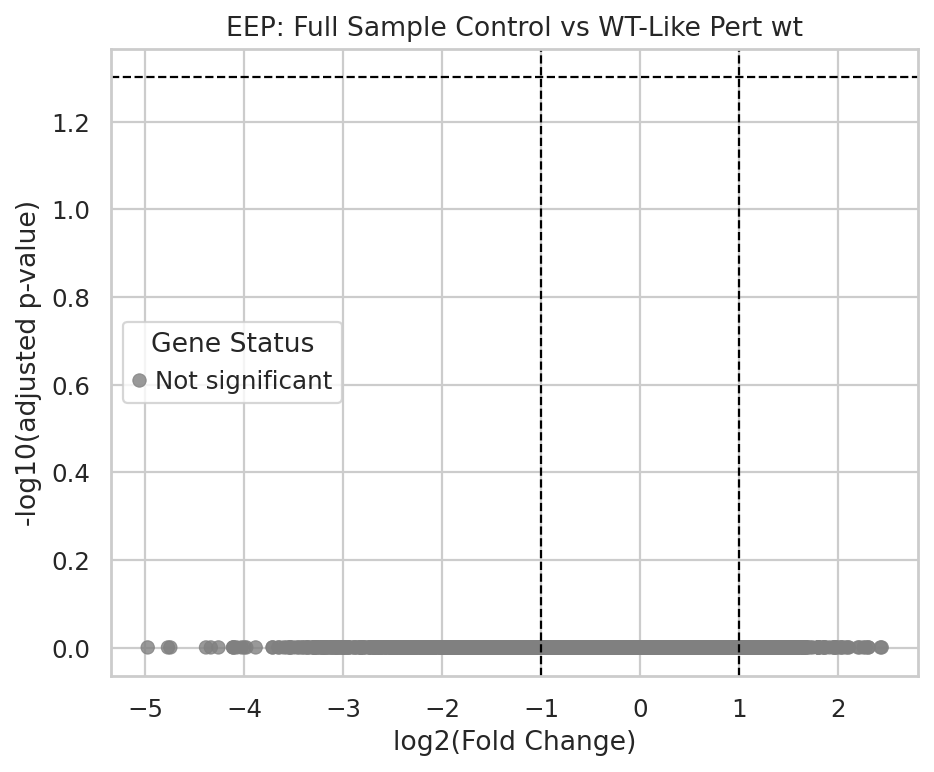


EEP
Cell counts: [27, 12, 194, 9]
Insufficient cells
EEP
Cell counts: [27, 3, 194, 15]
Insufficient cells
EEP
Cell counts: [27, 15, 194, 24]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.55 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.66 seconds.

Fitting LFCs...
... done in 0.45 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.22 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       1.409494       -1.602565  2.531948 -0.632938  0.526774  0.999689
Parp        45.433894       -0.286096  0.494989 -0.577984  0.563275  0.999689
Alg-2       23.970683       -0.017948  0.622925 -0.028813  0.977014  0.999689
Tim17b      35.340483       -0.068320  0.548072 -0.124655  0.900797  0.999689
CG41128      8.511620       -0.821512  1.046124 -0.785291  0.432283  0.999689
...               ...             ...       ...       ...       ...       ...
mt:ND4      91.890776       -0.482257  0.414272 -1.164107  0.244381  0.999689
mt:ND4L     34.495611       -0.439946  0.544029 -0.808682  0.418698  0.999689
mt:ND6      39.965598       -0.517235  0.611881 -0.845321  0.397932  0.999689
mt:Cyt-b  1141.790350       -0.446417  0.600855 -0.742970  0.457500  0.999689
mt:ND1      50.536552       -0.822978  0.516156 -1.594437  0.110838  0.999689

[4

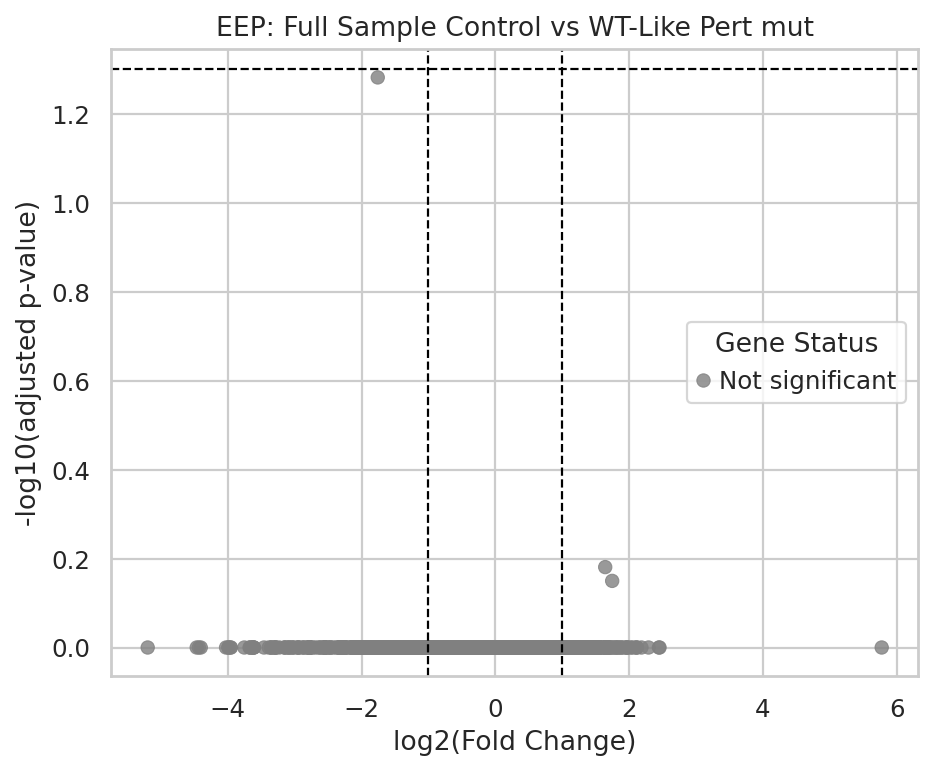


ISC
Cell counts: [975, 193, 1866, 277]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.11 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.05 seconds.

Fitting LFCs...
... done in 0.59 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.33 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       18.780076       -0.403713  0.735524 -0.548879  0.583089  0.999745
Pzl           6.387983       -1.340538  1.217261 -1.101274  0.270778  0.999745
Parp        640.634119       -0.305035  0.385979 -0.790288  0.429360  0.999745
Alg-2       326.969885       -0.334926  0.408448 -0.819997  0.412218  0.999745
Tim17b      562.691792       -0.148387  0.394152 -0.376470  0.706567  0.999745
...                ...             ...       ...       ...       ...       ...
mt:ND4     1644.811391       -0.518661  0.435595 -1.190695  0.233773  0.999745
mt:ND4L     576.077664       -0.983544  0.439915 -2.235756  0.025368  0.999745
mt:ND6      589.148945       -0.966573  0.502204 -1.924662  0.054272  0.999745
mt:Cyt-b  18495.700200       -0.666971  0.498478 -1.338014  0.180892  0.999745
mt:ND1      842.345354       -0.651319  0.451755 -1.441750  0.149373  

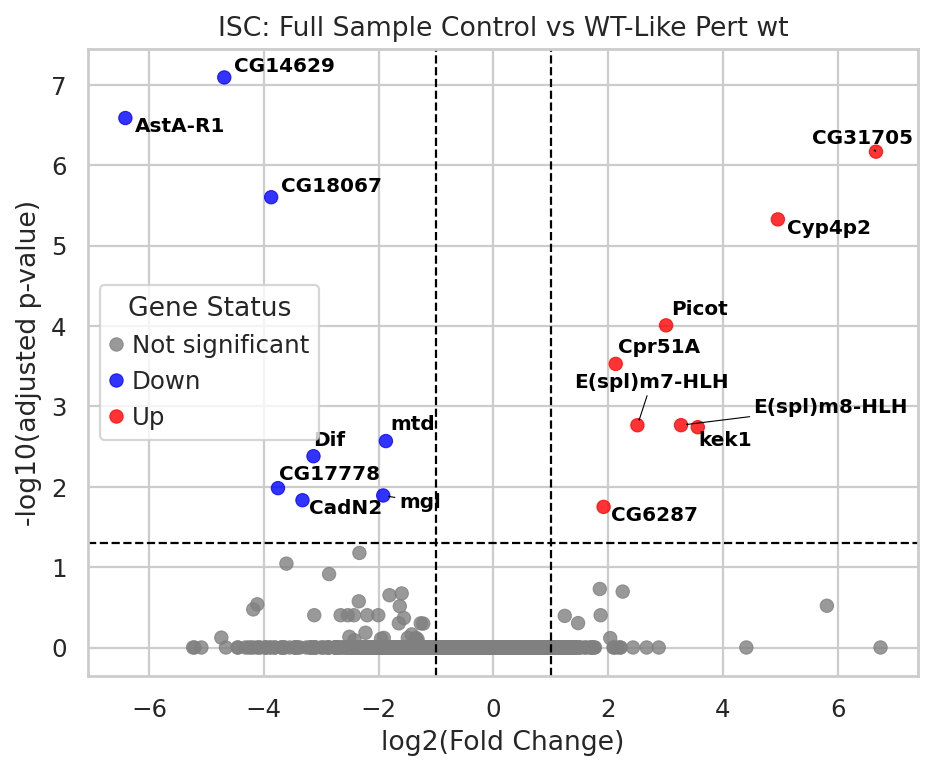


ISC
Cell counts: [975, 190, 1866, 240]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.99 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.06 seconds.

Fitting LFCs...
... done in 0.79 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.34 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       19.757672       -0.182612  0.729730 -0.250247  0.802397  0.999986
Pzl           7.463059       -0.612514  1.099399 -0.557135  0.577435       NaN
Parp        632.859803       -0.280598  0.384042 -0.730645  0.464996  0.999986
Alg-2       325.536479       -0.287643  0.406012 -0.708459  0.478660  0.999986
Tim17b      549.183869       -0.162788  0.394129 -0.413033  0.679583  0.999986
...                ...             ...       ...       ...       ...       ...
mt:ND4     1587.564198       -0.571875  0.431542 -1.325189  0.185109  0.999986
mt:ND4L     559.747084       -1.020789  0.440641 -2.316601  0.020525  0.999986
mt:ND6      576.648394       -0.967799  0.491515 -1.969013  0.048952  0.999986
mt:Cyt-b  17819.031772       -0.730712  0.488898 -1.494611  0.135016  0.999986
mt:ND1      801.532517       -0.761753  0.448226 -1.699485  0.089228  

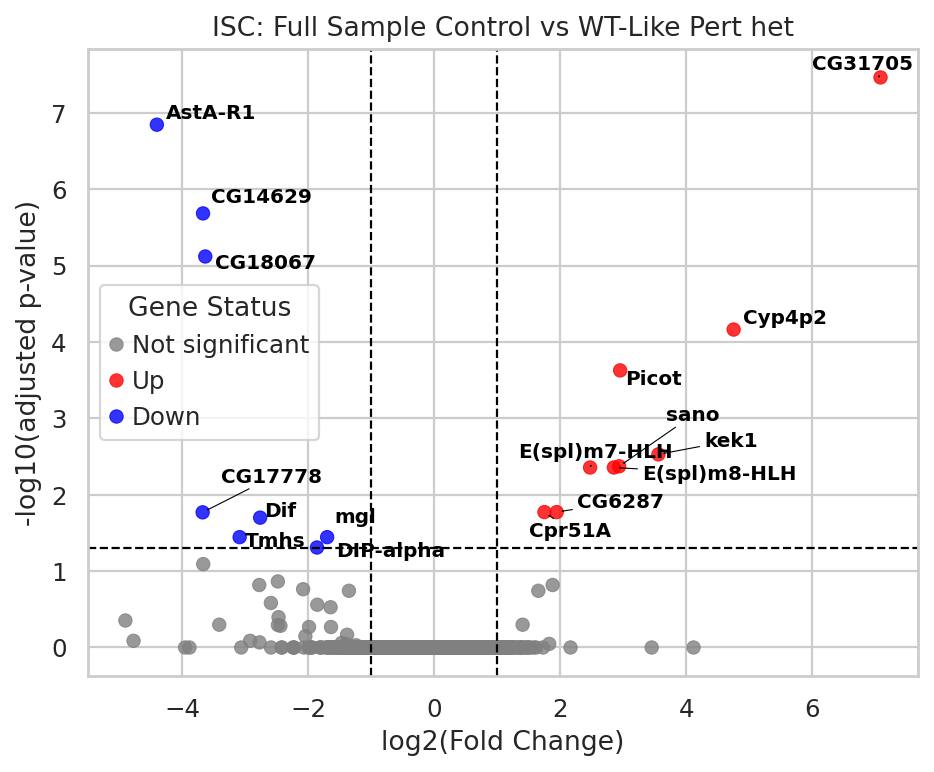


ISC
Cell counts: [975, 119, 1866, 144]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.01 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.03 seconds.

Fitting LFCs...
... done in 0.75 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.35 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       13.215141       -0.693148  0.901403 -0.768966  0.441914  0.999754
Pzl           4.879305       -1.459727  1.502801 -0.971337  0.331380       NaN
Parp        484.981305       -0.341570  0.396885 -0.860628  0.389443  0.999754
Alg-2       266.749030       -0.143655  0.410228 -0.350184  0.726201  0.999754
Tim17b      469.248797        0.097973  0.398864  0.245630  0.805969  0.999754
...                ...             ...       ...       ...       ...       ...
mt:ND4     1264.535338       -0.502887  0.438373 -1.147165  0.251313  0.999754
mt:ND4L     435.374239       -1.040347  0.448069 -2.321845  0.020241  0.999754
mt:ND6      443.610599       -1.033788  0.502410 -2.057660  0.039623  0.999754
mt:Cyt-b  14236.249015       -0.644458  0.493665 -1.305456  0.191738  0.999754
mt:ND1      644.041853       -0.654601  0.456452 -1.434107  0.151542  

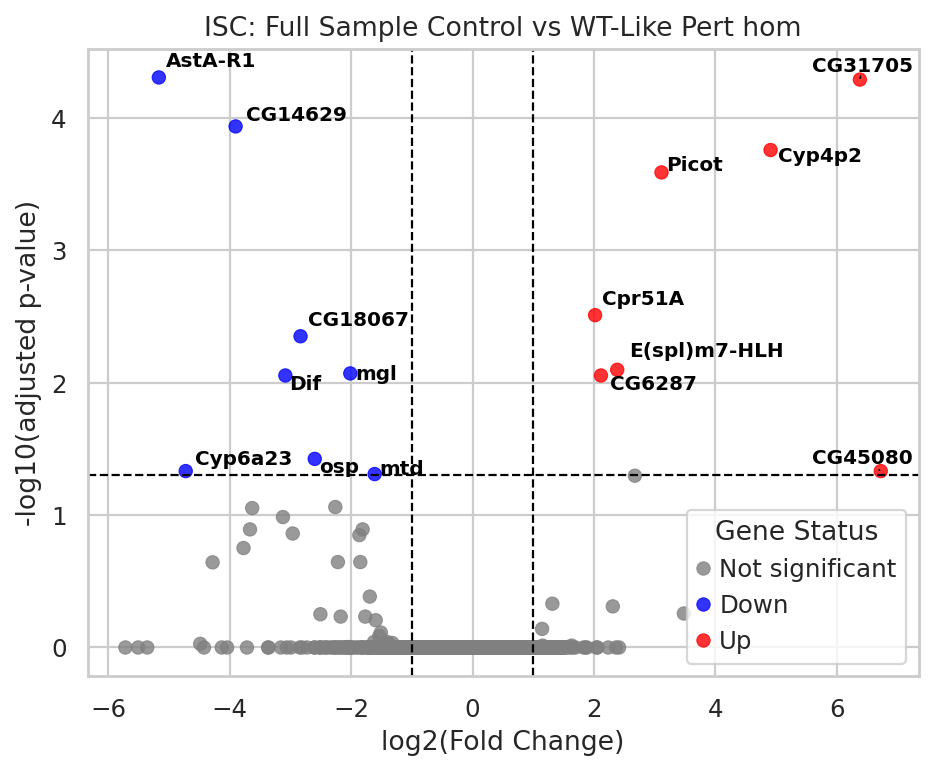


ISC
Cell counts: [975, 309, 1866, 384]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.97 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.06 seconds.

Fitting LFCs...
... done in 0.62 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.29 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       23.783598       -0.358770  0.673238 -0.532903  0.594101  0.999949
Pzl           8.887525       -0.888892  1.008368 -0.881515  0.378039       NaN
Parp        799.320182       -0.309840  0.376877 -0.822124  0.411006  0.999949
Alg-2       421.081943       -0.242247  0.388041 -0.624281  0.532443  0.999949
Tim17b      722.816186       -0.066134  0.384661 -0.171928  0.863494  0.999949
...                ...             ...       ...       ...       ...       ...
mt:ND4     2034.423363       -0.555044  0.427963 -1.296944  0.194650  0.999949
mt:ND4L     711.040235       -1.039018  0.431431 -2.408305  0.016027  0.999949
mt:ND6      729.882363       -1.001927  0.485582 -2.063354  0.039079  0.999949
mt:Cyt-b  22872.589687       -0.707663  0.487046 -1.452969  0.146232  0.999949
mt:ND1     1030.928923       -0.729554  0.443009 -1.646815  0.099596  

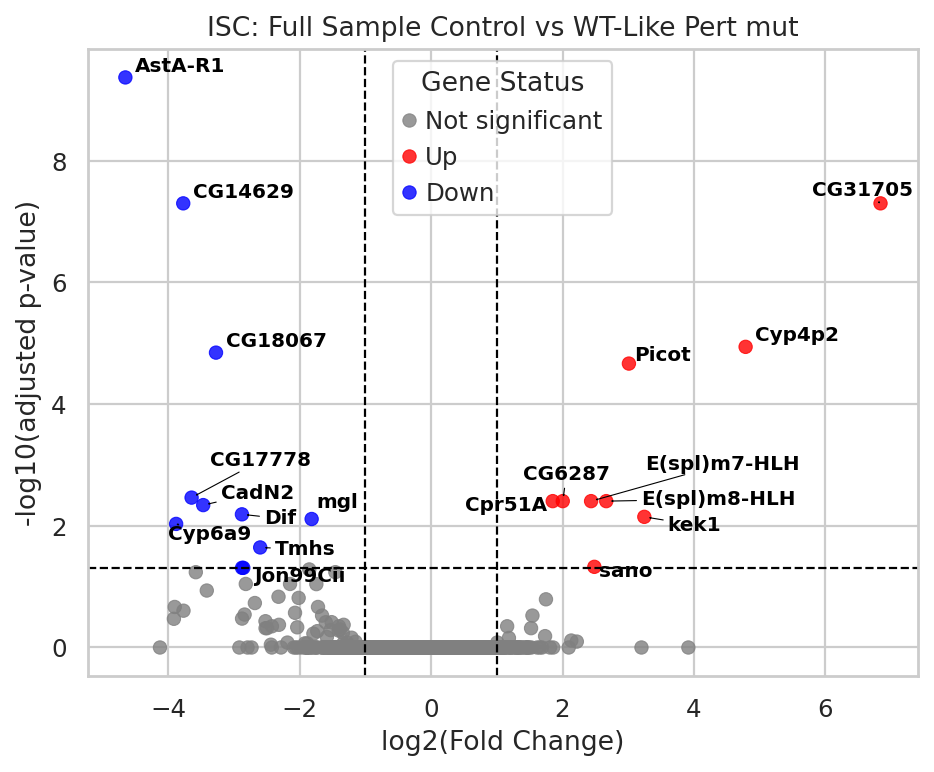


LFC
Cell counts: [282, 12, 298, 8]
Insufficient cells
LFC
Cell counts: [282, 8, 298, 9]
Insufficient cells
LFC
Cell counts: [282, 8, 298, 12]
Insufficient cells
LFC
Cell counts: [282, 16, 298, 21]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.88 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.89 seconds.

Fitting LFCs...
... done in 0.67 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.29 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        22.550341       -0.451537  0.633471 -0.712798  0.475971  0.917389
Alg-2       98.052175       -0.152033  0.462441 -0.328761  0.742337  0.979846
Tim17b     102.243263       -0.857692  0.445385 -1.925734  0.054138  0.545357
CG41128     46.580981       -0.574415  0.766615 -0.749287  0.453684  0.913873
CG41099     10.673855       -0.860607  0.872831 -0.985994  0.324136  0.869394
...               ...             ...       ...       ...       ...       ...
mt:ND4     210.923632       -0.579207  0.546483 -1.059881  0.289199  0.865372
mt:ND4L     48.353757       -1.365002  0.751024 -1.817520  0.069138  0.587846
mt:ND6      58.402832       -0.986619  0.720855 -1.368679  0.171100  0.766558
mt:Cyt-b  2608.072766       -0.508409  0.572384 -0.888231  0.374417  0.892200
mt:ND1     137.786883       -0.652725  0.544813 -1.198072  0.230889  0.826780

[5

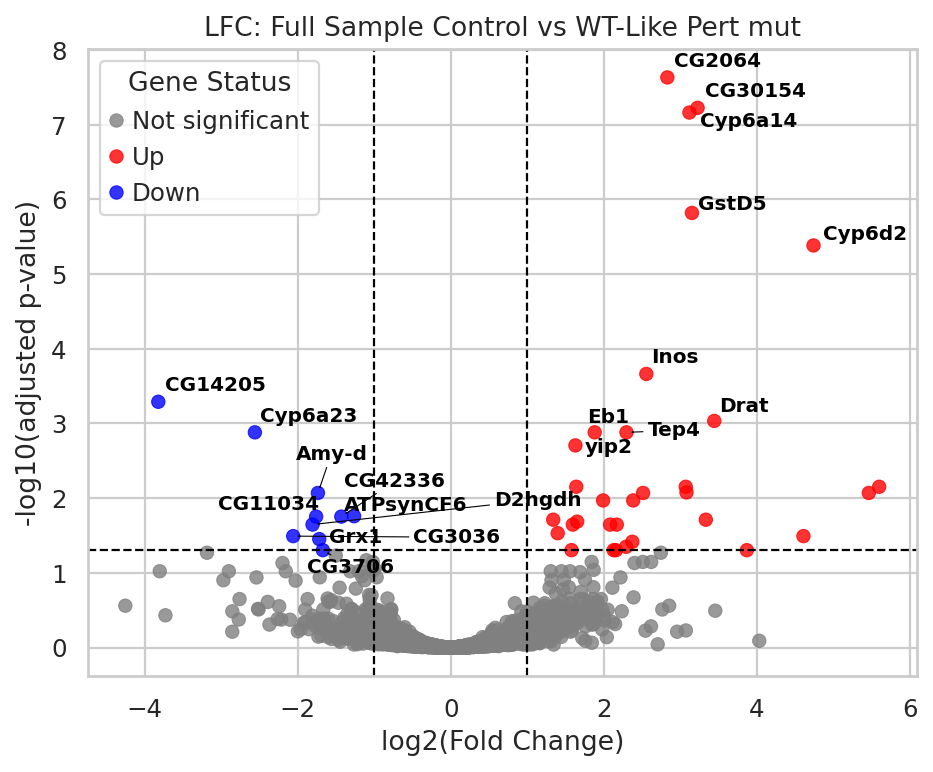


MT
Cell counts: [5, 15, 51, 22]
Insufficient cells
MT
Cell counts: [5, 7, 51, 9]
Insufficient cells
MT
Cell counts: [5, 0, 51, 0]
Insufficient cells
MT
Cell counts: [5, 7, 51, 9]
Insufficient cells
VM
Cell counts: [92, 5, 38, 2]
Insufficient cells
VM
Cell counts: [92, 5, 38, 3]
Insufficient cells
VM
Cell counts: [92, 2, 38, 3]
Insufficient cells
VM
Cell counts: [92, 7, 38, 6]
Insufficient cells
aEC
Cell counts: [764, 14, 407, 3]
Insufficient cells
aEC
Cell counts: [764, 18, 407, 8]
Insufficient cells
aEC
Cell counts: [764, 9, 407, 10]
Insufficient cells
aEC
Cell counts: [764, 27, 407, 18]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.87 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.85 seconds.

Fitting LFCs...
... done in 0.67 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.26 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       3.514575       -0.399777  1.571759 -0.254350  0.799225       NaN
Parp        41.423413        0.943902  0.705182  1.338523  0.180726  0.854278
Alg-2       78.843166       -0.428160  0.568667 -0.752919  0.451498  0.985873
Tim17b     103.498523       -0.526337  0.557496 -0.944108  0.345115  0.976320
CG41128     45.397943        0.165105  0.647755  0.254888  0.798810  0.989190
...               ...             ...       ...       ...       ...       ...
mt:ND4     292.456107       -0.608955  0.598646 -1.017221  0.309048  0.946970
mt:ND4L     82.493367       -1.656487  0.761456 -2.175420  0.029599  0.395379
mt:ND6     106.973922       -1.327682  0.735188 -1.805909  0.070933  0.610735
mt:Cyt-b  3819.434548       -1.019244  0.675199 -1.509546  0.131159  0.778651
mt:ND1     183.474369       -0.813071  0.586670 -1.385908  0.165775  0.834734

[5

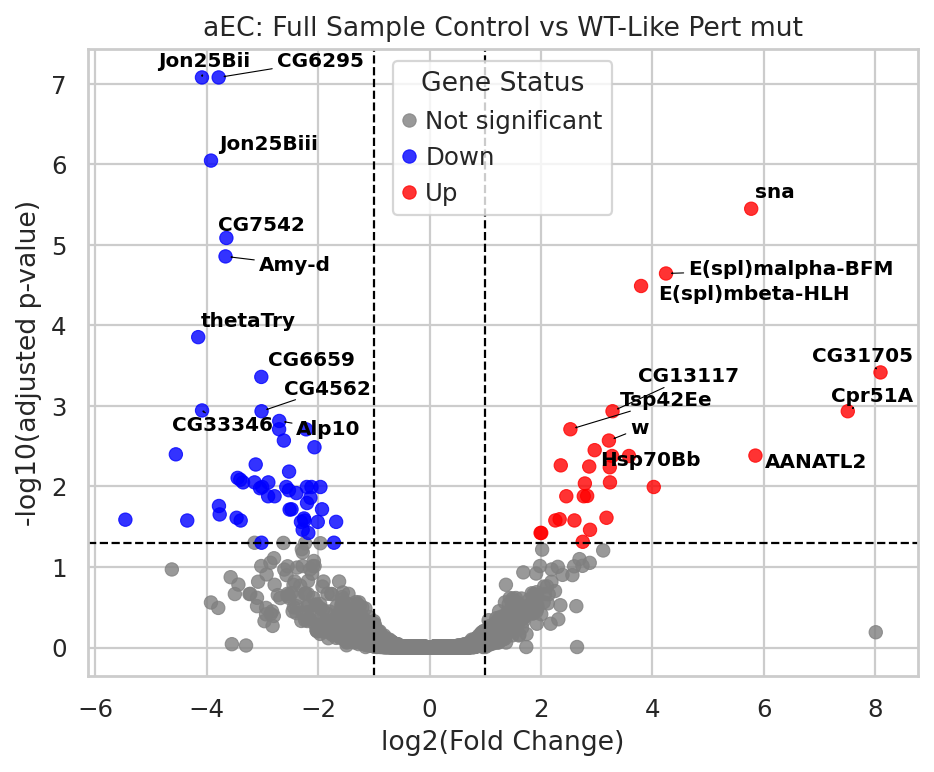


dEC
Cell counts: [146, 83, 398, 111]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.88 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.98 seconds.

Fitting LFCs...
... done in 0.58 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.27 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        359.406324       -0.481850  0.299415 -1.609307  0.107549  0.999594
Alg-2       506.217057       -0.312930  0.305045 -1.025850  0.304962  0.999594
Tim17b      613.919308       -0.232939  0.282167 -0.825537  0.409067  0.999594
CG41128     251.953866       -0.452722  0.386559 -1.171159  0.241535  0.999594
CG41099      76.093284        0.254936  0.404661  0.630000  0.528694  0.999594
...                ...             ...       ...       ...       ...       ...
mt:ND4     1276.101525       -0.278099  0.262699 -1.058624  0.289771  0.999594
mt:ND4L     399.967871       -0.117009  0.323289 -0.361934  0.717401  0.999594
mt:ND6      386.852635       -0.549251  0.333460 -1.647125  0.099532  0.999594
mt:Cyt-b  13119.313655       -0.156959  0.346675 -0.452757  0.650724  0.999594
mt:ND1      788.604357       -0.579651  0.271745 -2.133070  0.032919  

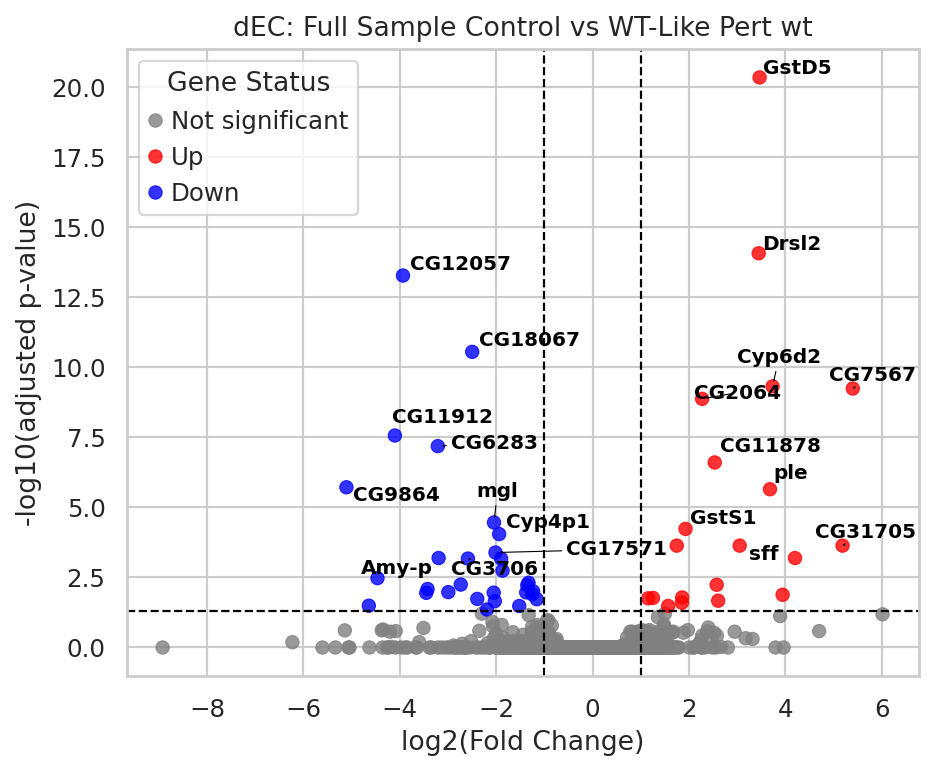


dEC
Cell counts: [146, 82, 398, 90]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.02 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.98 seconds.

Fitting LFCs...
... done in 0.55 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.33 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        337.904497       -0.552708  0.309415 -1.786297  0.074051  0.999994
Alg-2       488.826764       -0.290185  0.320903 -0.904276  0.365849  0.999994
Tim17b      579.140157       -0.285216  0.290573 -0.981564  0.326315  0.999994
CG41128     256.399952       -0.252061  0.372332 -0.676978  0.498420  0.999994
CG41099      67.104455        0.023779  0.431283  0.055135  0.956031  0.999994
...                ...             ...       ...       ...       ...       ...
mt:ND4     1193.320048       -0.359389  0.273761 -1.312784  0.189256  0.999994
mt:ND4L     361.249273       -0.304985  0.322389 -0.946016  0.344141  0.999994
mt:ND6      369.240635       -0.562459  0.340067 -1.653964  0.098135  0.999994
mt:Cyt-b  12234.690143       -0.242121  0.355905 -0.680296  0.496317  0.999994
mt:ND1      748.829569       -0.614494  0.281065 -2.186304  0.028793  

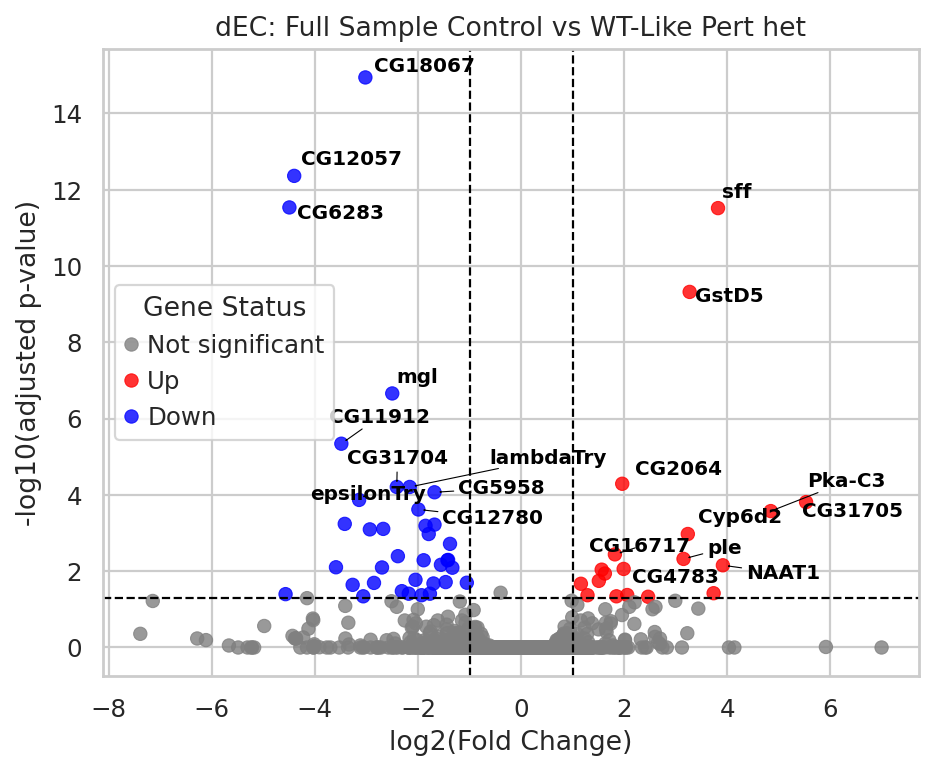


dEC
Cell counts: [146, 36, 398, 58]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.91 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.97 seconds.

Fitting LFCs...
... done in 0.71 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.33 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
Parp       238.949491       -0.585659  0.314954 -1.859503  0.062956  0.99985
Alg-2      354.145426       -0.240225  0.319066 -0.752902  0.451509  0.99985
Tim17b     427.457728       -0.180497  0.295417 -0.610990  0.541206  0.99985
CG41128    187.616874       -0.187715  0.369900 -0.507474  0.611822  0.99985
CG41099     47.747591        0.023392  0.482858  0.048444  0.961362  0.99985
...               ...             ...       ...       ...       ...      ...
mt:ND4     882.010720       -0.248636  0.281146 -0.884366  0.376498  0.99985
mt:ND4L    254.140177       -0.341480  0.336331 -1.015310  0.309958  0.99985
mt:ND6     263.610348       -0.572532  0.360208 -1.589448  0.111959  0.99985
mt:Cyt-b  8821.158738       -0.209534  0.350765 -0.597362  0.550265  0.99985
mt:ND1     552.404707       -0.502150  0.295956 -1.696703  0.089753  0.99985

[6621 rows x 6

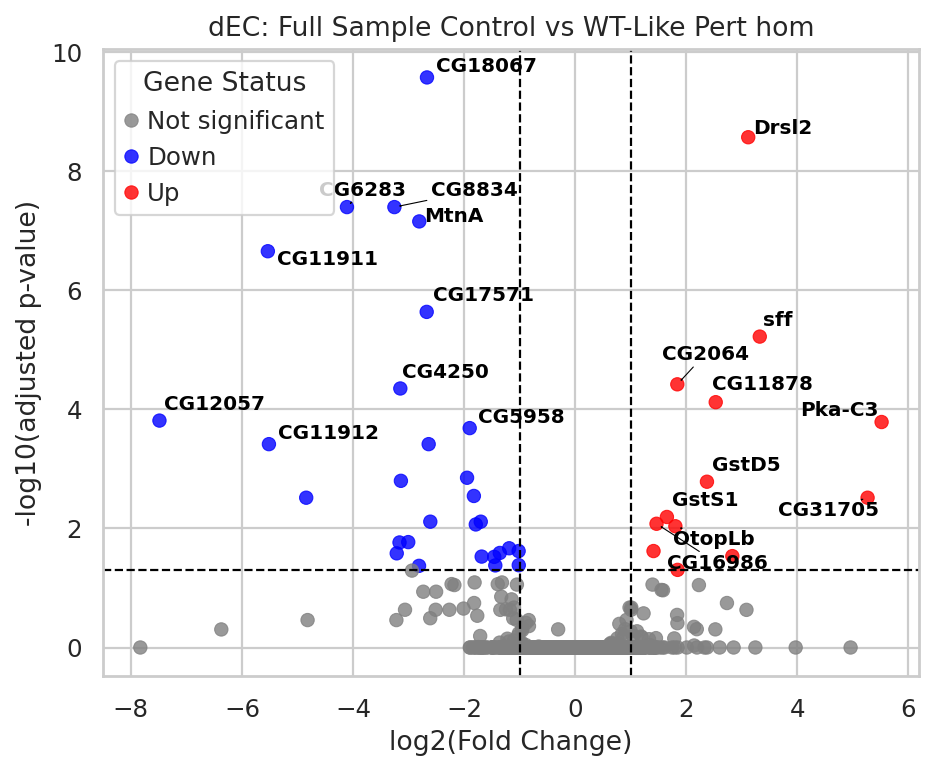


dEC
Cell counts: [146, 118, 398, 148]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.91 seconds.

Fitting dispersion trend curve...
... done in 0.11 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.99 seconds.

Fitting LFCs...
... done in 0.72 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.32 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        415.733200       -0.584880  0.288012 -2.030747  0.042281  0.999883
Alg-2       609.775438       -0.275170  0.301339 -0.913160  0.361159  0.999883
Tim17b      724.062702       -0.263054  0.275690 -0.954167  0.339999  0.999883
CG41128     320.231356       -0.234436  0.350309 -0.669226  0.503351  0.999883
CG41099      83.274821        0.022738  0.398336  0.057083  0.954479  0.999883
...                ...             ...       ...       ...       ...       ...
mt:ND4     1491.013817       -0.338684  0.261785 -1.293746  0.195753  0.999883
mt:ND4L     445.201981       -0.328459  0.308838 -1.063530  0.287542  0.999883
mt:ND6      454.589458       -0.593945  0.323123 -1.838141  0.066042  0.999883
mt:Cyt-b  15178.382229       -0.245343  0.344716 -0.711723  0.476636  0.999883
mt:ND1      933.739232       -0.599157  0.267015 -2.243910  0.024838  

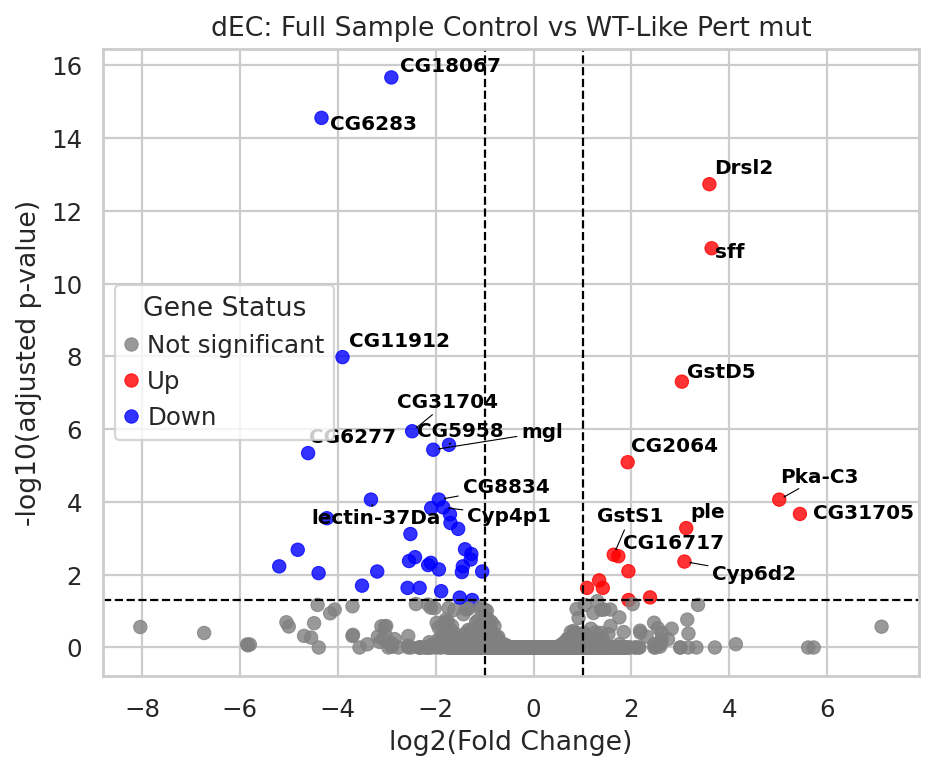


dMT
Cell counts: [24, 18, 79, 29]
Using None as control genes, passed at DeseqDataSet initialization


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.36 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.43 seconds.

Fitting LFCs...
... done in 0.30 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.13 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp       20.781396       -0.697617  0.708485 -0.984661  0.324791  0.999576
Alg-2      10.562751       -0.581013  0.969731 -0.599149  0.549074  0.999576
Tim17b     13.963525        0.208797  0.817899  0.255284  0.798504  0.999576
CG41128     4.018426        0.029383  1.427247  0.020587  0.983575  0.999576
beta-Man    5.168154        0.863182  1.301749  0.663094  0.507270  0.999576
...              ...             ...       ...       ...       ...       ...
mt:ND4     57.589882       -0.320337  0.504815 -0.634562  0.525714  0.999576
mt:ND4L    23.380923        0.011551  0.659489  0.017514  0.986026  0.999576
mt:ND6     24.205183       -0.748984  0.766947 -0.976579  0.328778  0.999576
mt:Cyt-b  795.113065       -0.146377  0.426132 -0.343501  0.731222  0.999576
mt:ND1     34.823917       -0.205249  0.598702 -0.342823  0.731732  0.999576

[2640 rows x 6

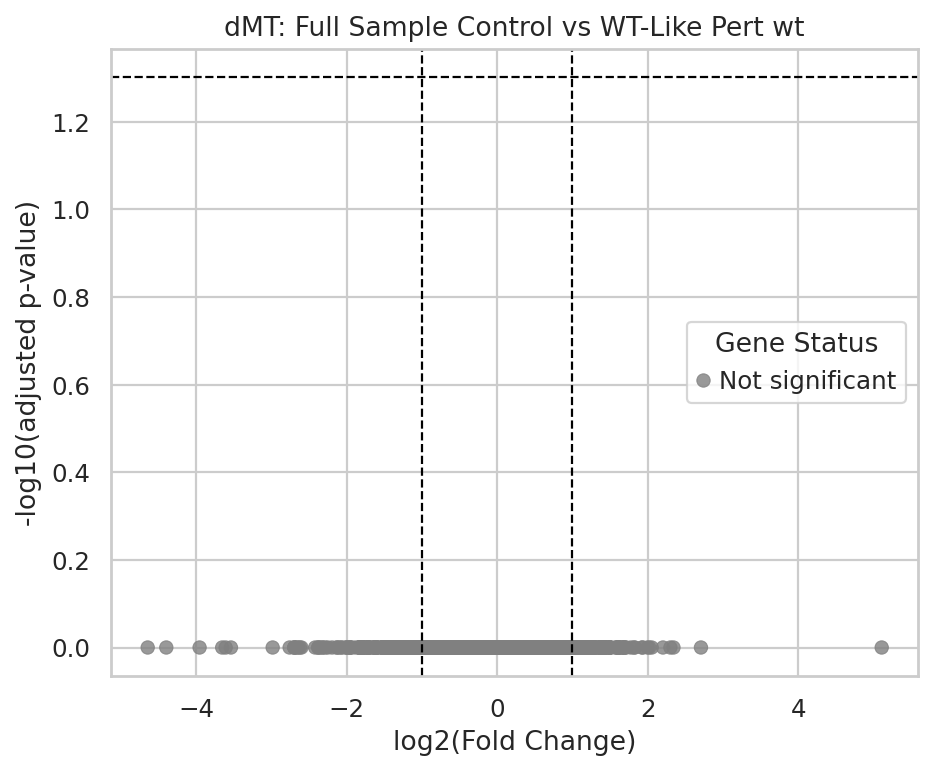


dMT
Cell counts: [24, 23, 79, 22]
Using None as control genes, passed at DeseqDataSet initialization


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.33 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.40 seconds.

Fitting LFCs...
... done in 0.25 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.14 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp       29.286103        0.019312  0.586998  0.032899  0.973755  0.999973
Alg-2      15.964378        0.231778  0.757315  0.306052  0.759565  0.999973
Tim17b     19.191096        0.691697  0.698741  0.989919  0.322214  0.999973
CG41128     3.531568       -0.579369  1.532935 -0.377947  0.705470  0.999973
beta-Man    6.579936        1.036704  1.135491  0.913000  0.361242  0.999973
...              ...             ...       ...       ...       ...       ...
mt:ND4     64.865902       -0.203378  0.461206 -0.440969  0.659235  0.999973
mt:ND4L    23.678665       -0.191680  0.671325 -0.285524  0.775242  0.999973
mt:ND6     25.143126       -0.990243  0.760633 -1.301867  0.192962  0.999973
mt:Cyt-b  857.464576       -0.206014  0.379721 -0.542541  0.587446  0.999973
mt:ND1     36.292512       -0.353448  0.573724 -0.616059  0.537856  0.999973

[2619 rows x 6

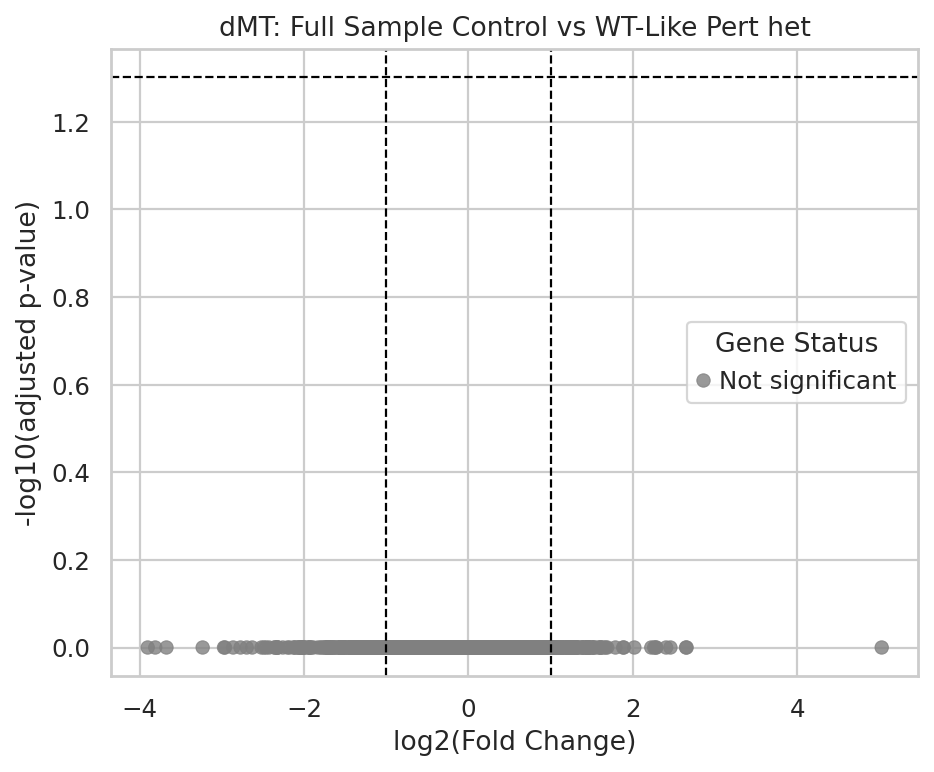


dMT
Cell counts: [24, 8, 79, 15]
Insufficient cells
dMT
Cell counts: [24, 31, 79, 37]
Using None as control genes, passed at DeseqDataSet initialization


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.34 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.41 seconds.

Fitting LFCs...
... done in 0.26 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.15 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        33.818234       -0.106063  0.549321 -0.193080  0.846897  0.999778
Alg-2       17.824452        0.029150  0.712918  0.040888  0.967385  0.999778
Tim17b      22.317175        0.613072  0.654295  0.936996  0.348761  0.999778
CG41128      4.650433       -0.339044  1.349857 -0.251170  0.801682  0.999778
beta-Man     7.804369        1.015524  1.063369  0.955006  0.339575  0.999778
...               ...             ...       ...       ...       ...       ...
mt:ND4      76.287023       -0.278688  0.439183 -0.634559  0.525716  0.999778
mt:ND4L     27.348421       -0.307812  0.620503 -0.496069  0.619846  0.999778
mt:ND6      30.015343       -1.036903  0.711861 -1.456609  0.145224  0.999778
mt:Cyt-b  1016.156322       -0.258899  0.386783 -0.669366  0.503262  0.999778
mt:ND1      41.039747       -0.576938  0.550974 -1.047124  0.295042  0.999778

[2

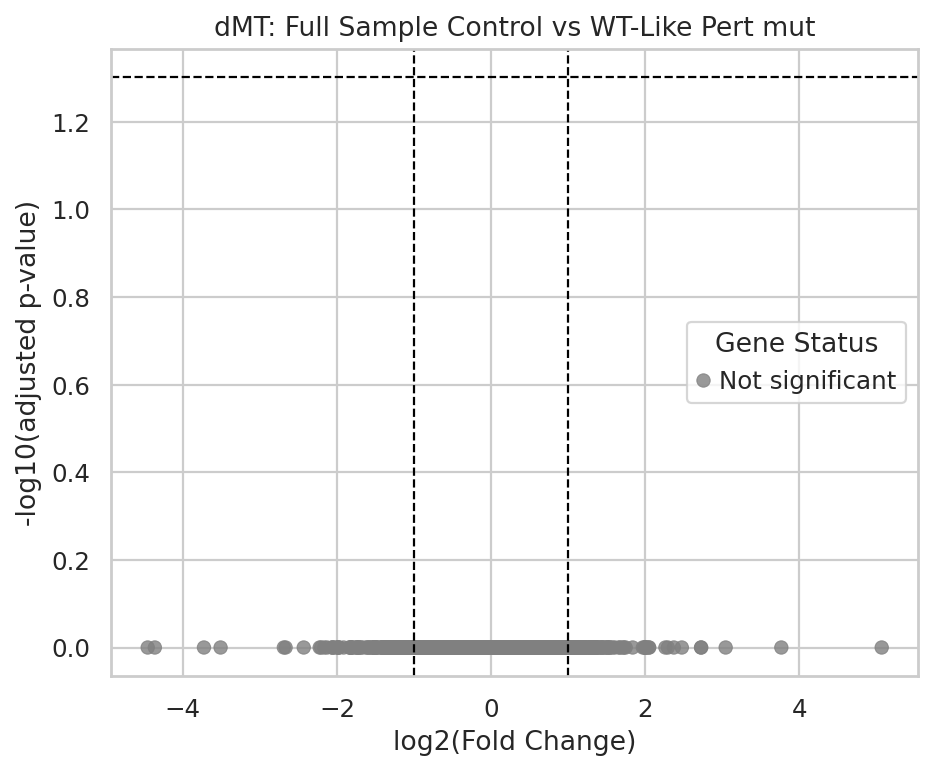


mEC
Cell counts: [44, 3, 46, 3]
Insufficient cells
mEC
Cell counts: [44, 0, 46, 3]
Insufficient cells
mEC
Cell counts: [44, 0, 46, 1]
Insufficient cells
mEC
Cell counts: [44, 0, 46, 4]
Insufficient cells
pEC
Cell counts: [402, 14, 219, 19]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.92 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.77 seconds.

Fitting LFCs...
... done in 0.53 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.27 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        18.117001       -1.056074  0.797179 -1.324763  0.185250  0.526253
Alg-2       51.513478       -1.089652  0.539287 -2.020542  0.043327  0.230967
Tim17b      79.219923       -0.455558  0.509974 -0.893297  0.371698  0.715151
CG41128     22.153867       -1.270054  0.716043 -1.773713  0.076111  0.330264
CG41099      8.030354       -1.430985  1.104513 -1.295580  0.195120       NaN
...               ...             ...       ...       ...       ...       ...
mt:ND4     205.998001        0.008373  0.433436  0.019318  0.984587  0.992768
mt:ND4L     40.947031       -1.042193  0.661576 -1.575318  0.115183  0.409833
mt:ND6      62.492005       -0.664415  0.641006 -1.036521  0.299959  0.651400
mt:Cyt-b  2389.016966       -0.407431  0.480389 -0.848126  0.396368  0.730602
mt:ND1     113.396665       -0.533020  0.490908 -1.085784  0.277575  0.626643

[5

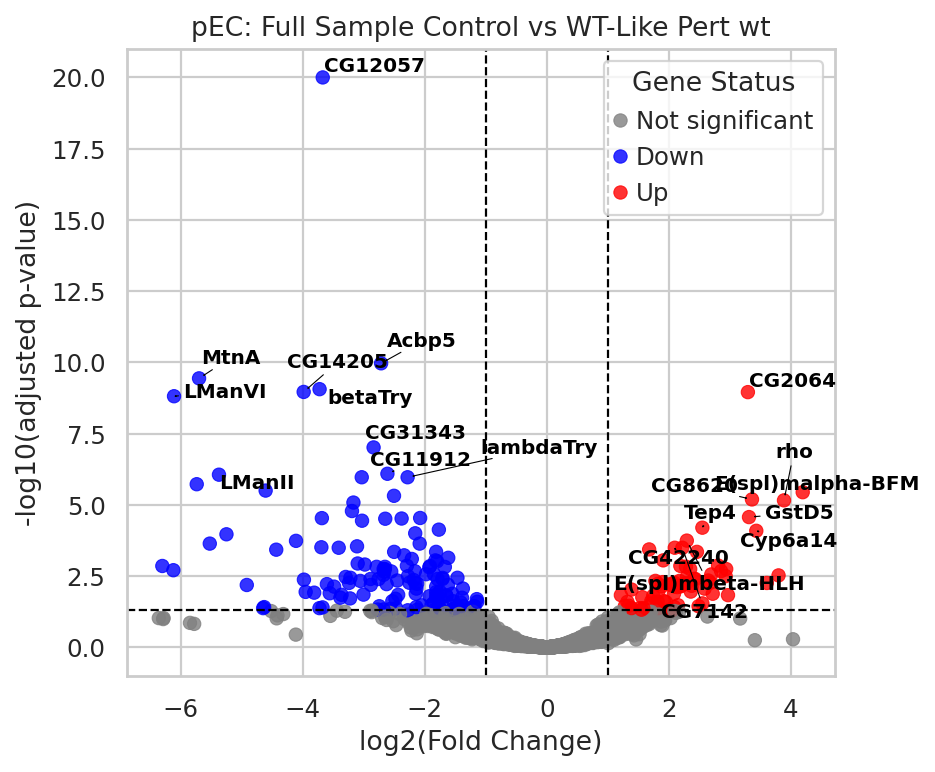


pEC
Cell counts: [402, 20, 219, 24]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.80 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.79 seconds.

Fitting LFCs...
... done in 0.65 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.27 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        25.105913       -0.250758  0.750162 -0.334272  0.738174  0.999227
Alg-2       65.558702       -0.595900  0.573103 -1.039778  0.298443  0.989352
Tim17b      86.506359       -0.554923  0.558465 -0.993657  0.320390  0.992700
CG41128     28.405801       -0.701076  0.689909 -1.016185  0.309541  0.992224
CG41099     12.935385       -0.045954  0.854943 -0.053751  0.957133  0.999227
...               ...             ...       ...       ...       ...       ...
mt:ND4     199.713630       -0.459793  0.508436 -0.904328  0.365821  0.999227
mt:ND4L     55.355883       -0.365645  0.620092 -0.589662  0.555417  0.999227
mt:ND6      66.123997       -0.917777  0.658097 -1.394591  0.163139  0.861767
mt:Cyt-b  2658.091648       -0.450157  0.532645 -0.845135  0.398035  0.999227
mt:ND1     130.909229       -0.448548  0.549387 -0.816451  0.414242  0.999227

[5

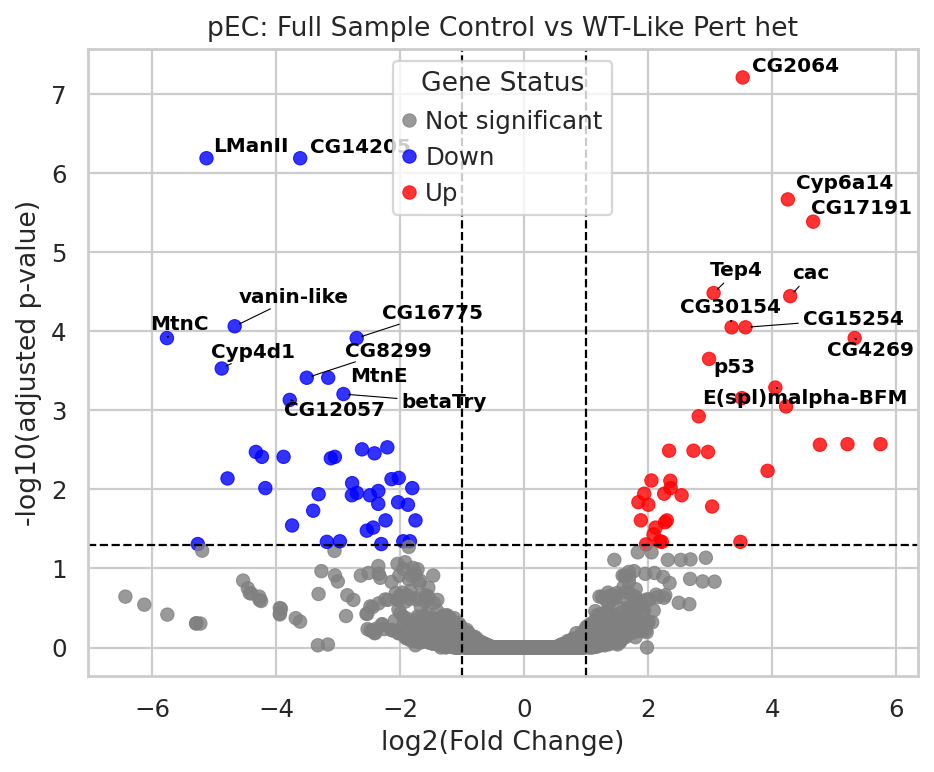


pEC
Cell counts: [402, 18, 219, 10]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.76 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.80 seconds.

Fitting LFCs...
... done in 0.53 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.28 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        15.324555       -1.682173  0.948891 -1.772778  0.076266       NaN
Alg-2       64.172937       -0.093510  0.594306 -0.157343  0.874975  0.997053
Tim17b      77.733813       -0.359512  0.581117 -0.618657  0.536142  0.997053
CG41128     21.764471       -1.024102  0.788753 -1.298381  0.194156  0.997053
CG41099      9.249465       -0.477157  1.002479 -0.475977  0.634090       NaN
...               ...             ...       ...       ...       ...       ...
mt:ND4     198.082338        0.018649  0.533796  0.034936  0.972131  0.997053
mt:ND4L     38.097247       -1.162792  0.710379 -1.636860  0.101660  0.846372
mt:ND6      56.413254       -0.911463  0.696453 -1.308722  0.190629  0.997053
mt:Cyt-b  2271.164522       -0.424533  0.559350 -0.758976  0.447867  0.997053
mt:ND1     103.878381       -0.672528  0.579898 -1.159736  0.246156  0.997053

[5

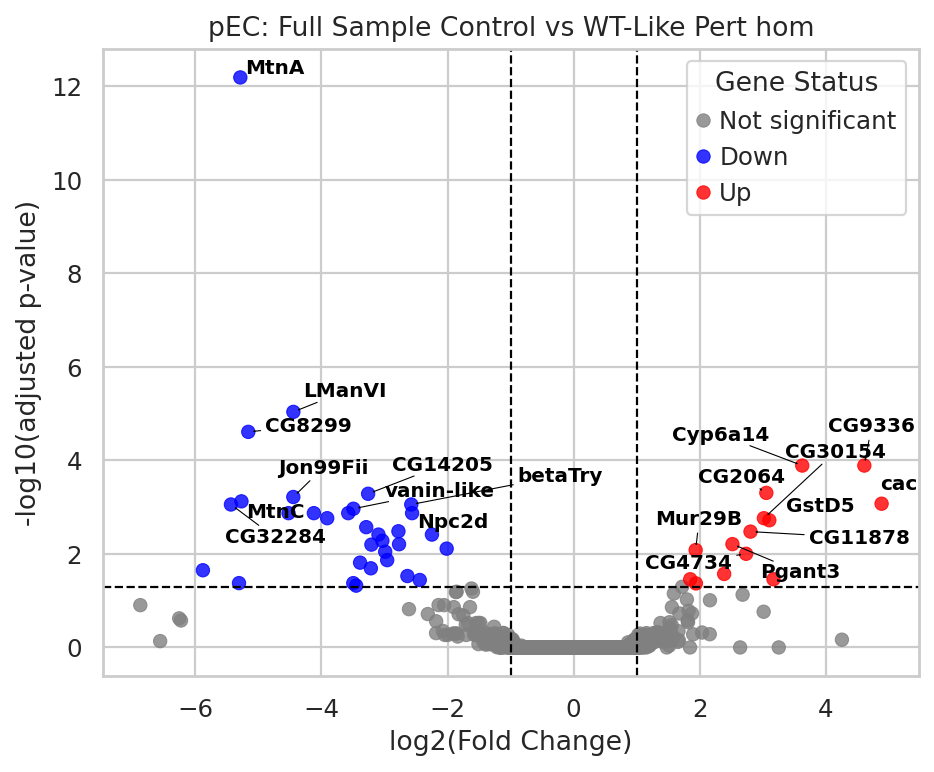


pEC
Cell counts: [402, 38, 219, 34]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.72 seconds.

Fitting dispersion trend curve...
... done in 0.09 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.79 seconds.

Fitting LFCs...
... done in 0.62 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.26 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Parp        28.311782       -0.743426  0.656612 -1.132216  0.257544  0.911557
Alg-2       92.576545       -0.324525  0.477483 -0.679657  0.496722  0.997951
Tim17b     116.882031       -0.441943  0.465754 -0.948877  0.342683  0.955721
CG41128     36.101895       -0.800329  0.590954 -1.354299  0.175641  0.815189
CG41099     16.281863       -0.163699  0.743532 -0.220164  0.825743  0.998899
...               ...             ...       ...       ...       ...       ...
mt:ND4     278.903624       -0.244071  0.421231 -0.579422  0.562304  0.997951
mt:ND4L     67.493919       -0.611652  0.539968 -1.132757  0.257316  0.911557
mt:ND6      86.506589       -0.910353  0.568094 -1.602470  0.109052  0.699914
mt:Cyt-b  3514.099188       -0.408783  0.460655 -0.887396  0.374866  0.973601
mt:ND1     167.096587       -0.526626  0.463855 -1.135324  0.256240  0.911557

[5

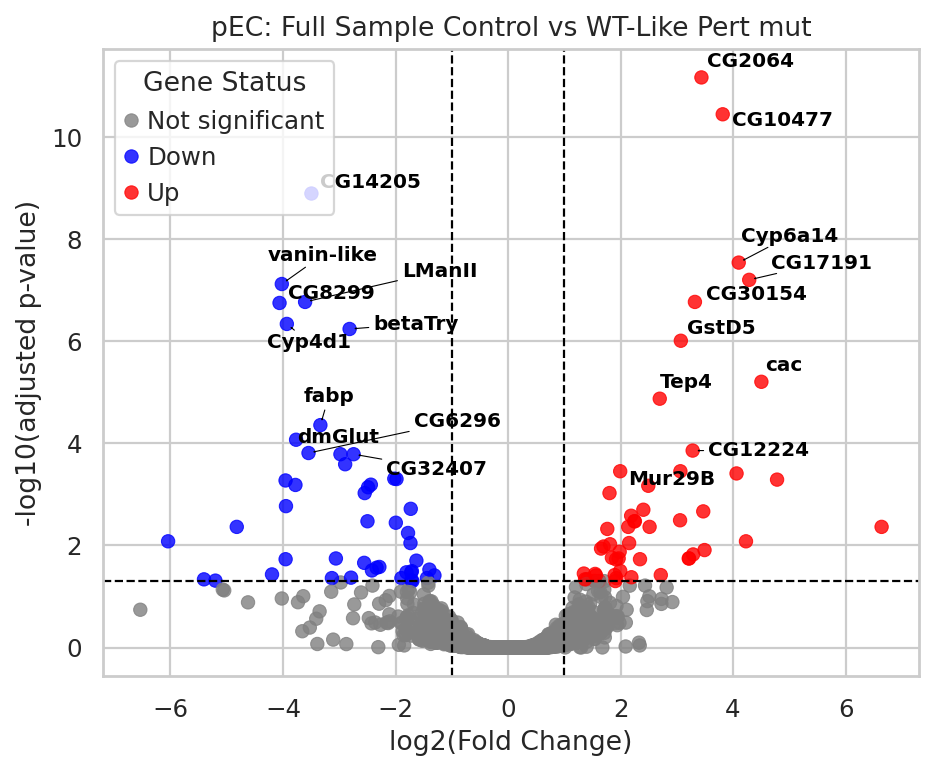


ISC/EB
Cell counts: [1917, 351, 3251, 488]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.13 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.19 seconds.

Fitting LFCs...
... done in 0.80 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.37 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       34.464905       -0.164840  0.635178 -0.259517  0.795236  0.999455
Pzl          11.055217       -1.188660  1.038276 -1.144841  0.252275  0.999455
Parp       1334.908836       -0.301358  0.345080 -0.873300  0.382500  0.999455
Alg-2       769.963953       -0.283085  0.352052 -0.804100  0.421339  0.999455
Tim17b     1339.953402       -0.117955  0.344852 -0.342046  0.732316  0.999455
...                ...             ...       ...       ...       ...       ...
mt:ND4     3794.981375       -0.567807  0.405386 -1.400658  0.161316  0.999455
mt:ND4L    1373.403876       -0.873451  0.396501 -2.202897  0.027602  0.925296
mt:ND6     1384.344391       -0.964154  0.464192 -2.077056  0.037796  0.986601
mt:Cyt-b  43186.140354       -0.619127  0.459264 -1.348086  0.177631  0.999455
mt:ND1     2030.406755       -0.630642  0.428000 -1.473463  0.140626  

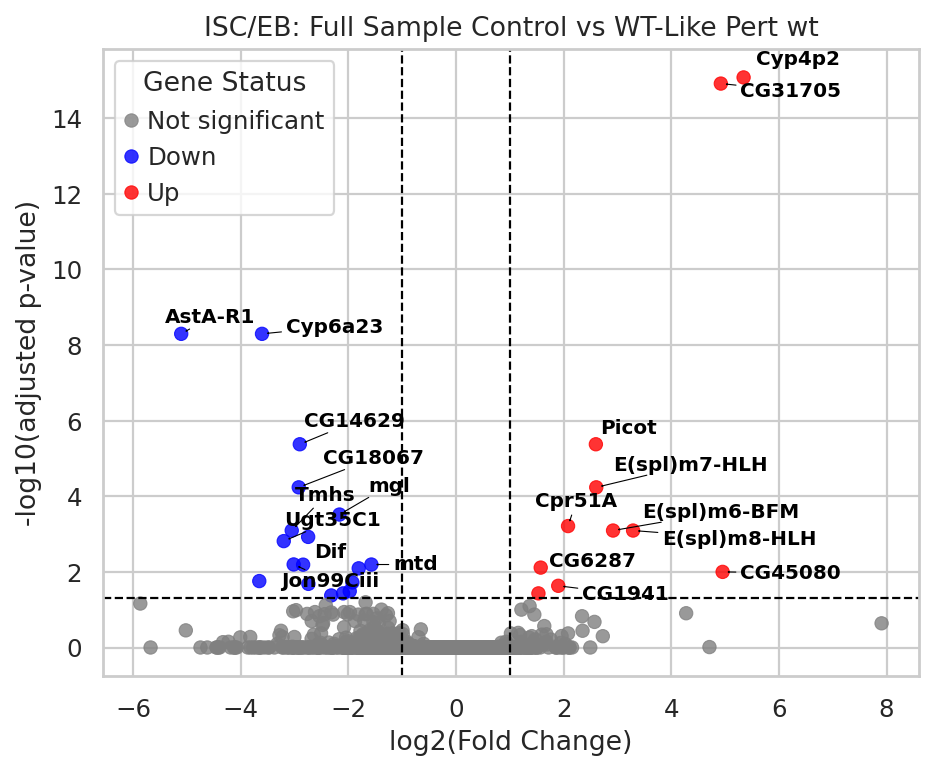


ISC/EB
Cell counts: [1917, 346, 3251, 438]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.10 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.14 seconds.

Fitting LFCs...
... done in 0.64 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.32 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       36.782537        0.050053  0.603100  0.082994  0.933857  0.999804
Pzl          11.311470       -1.122512  1.017478 -1.103230  0.269927  0.999804
Parp       1323.827974       -0.334457  0.342172 -0.977455  0.328344  0.999804
Alg-2       777.620903       -0.257529  0.346560 -0.743102  0.457420  0.999804
Tim17b     1370.952713       -0.055068  0.338719 -0.162578  0.870851  0.999804
...                ...             ...       ...       ...       ...       ...
mt:ND4     3744.796303       -0.624178  0.399333 -1.563051  0.118041  0.999804
mt:ND4L    1350.438434       -0.952960  0.394759 -2.414027  0.015777  0.649777
mt:ND6     1353.892446       -1.071824  0.457918 -2.340647  0.019250  0.692262
mt:Cyt-b  41628.792817       -0.767483  0.446837 -1.717590  0.085871  0.999804
mt:ND1     1954.113613       -0.784684  0.419212 -1.871806  0.061233  

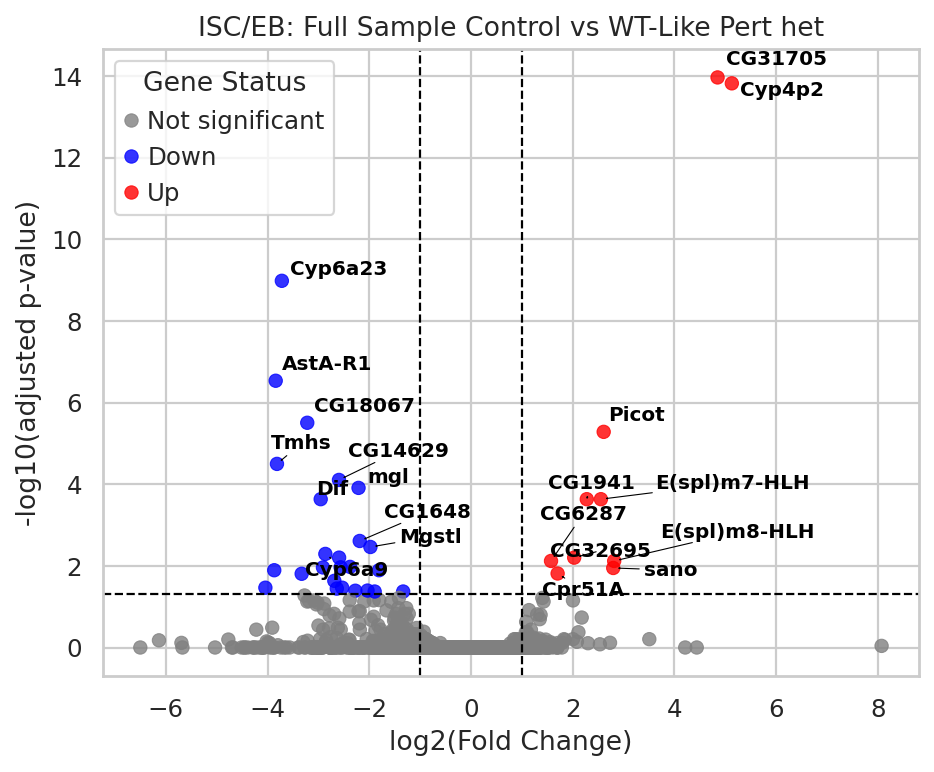


ISC/EB
Cell counts: [1917, 212, 3251, 249]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.14 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.11 seconds.

Fitting LFCs...
... done in 0.63 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.36 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       23.907356       -0.477971  0.742093 -0.644085  0.519520  0.999866
Pzl           8.059505       -1.549303  1.292344 -1.198832  0.230593       NaN
Parp       1013.734216       -0.345176  0.367657 -0.938851  0.347807  0.999866
Alg-2       623.374249       -0.127666  0.369217 -0.345774  0.729513  0.999866
Tim17b     1086.220464        0.034083  0.369042  0.092355  0.926416  0.999866
...                ...             ...       ...       ...       ...       ...
mt:ND4     2940.823996       -0.545741  0.420538 -1.297720  0.194383  0.999866
mt:ND4L    1019.467178       -1.029522  0.414076 -2.486309  0.012908  0.600387
mt:ND6     1044.400720       -1.054677  0.481315 -2.191239  0.028435  0.869321
mt:Cyt-b  32725.610871       -0.679860  0.469725 -1.447358  0.147797  0.999866
mt:ND1     1580.305515       -0.592345  0.445337 -1.330106  0.183483  

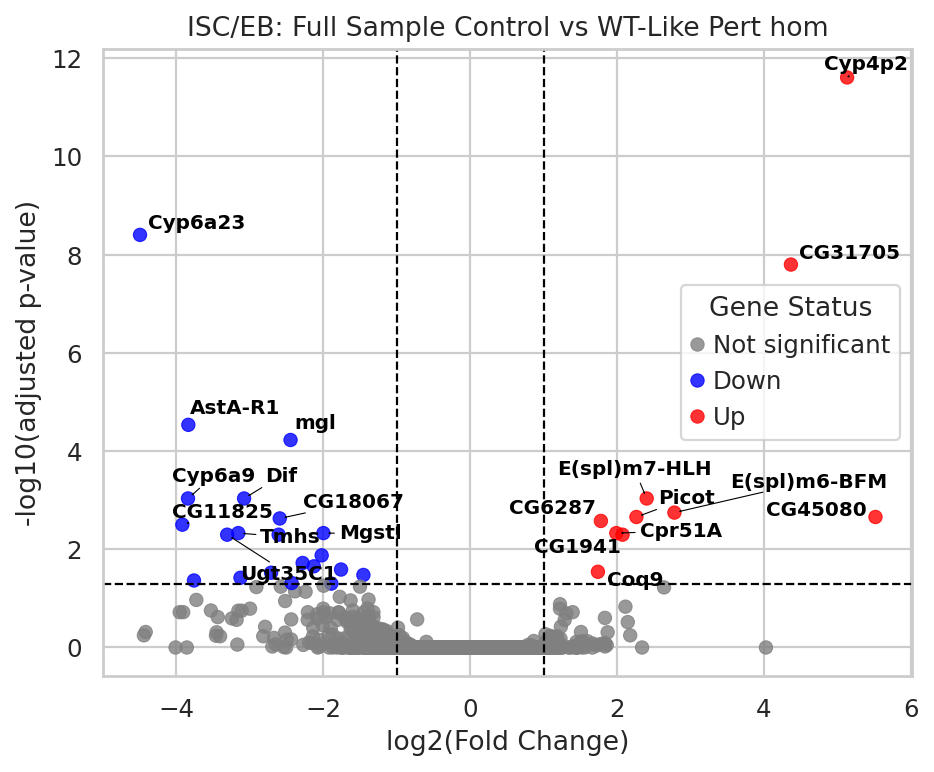


ISC/EB
Cell counts: [1917, 558, 3251, 687]


/scratch/jobs/60613130/ipykernel_3196038/3893562421.py:13: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.10 seconds.

Fitting dispersion trend curve...
... done in 0.12 seconds.

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/pydeseq2/dds.py:542: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 1.31 seconds.

Fitting LFCs...
... done in 0.66 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.38 seconds.



Log2 fold change & Wald test p-value: condition LamC vs ctrl
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
Myo81F       43.743780       -0.125816  0.577217 -0.217971  0.827452  0.999872
Pzl          13.891631       -1.262284  0.941521 -1.340687  0.180022  0.999872
Parp       1667.047243       -0.341547  0.339470 -1.006119  0.314359  0.999872
Alg-2       996.683585       -0.209491  0.342406 -0.611820  0.540657  0.999872
Tim17b     1748.414450       -0.024575  0.338120 -0.072682  0.942059  0.999872
...                ...             ...       ...       ...       ...       ...
mt:ND4     4762.246976       -0.595895  0.399406 -1.491955  0.135711  0.999872
mt:ND4L    1692.423902       -0.982478  0.392144 -2.505400  0.012231  0.530375
mt:ND6     1710.403169       -1.066297  0.456808 -2.334234  0.019583  0.604875
mt:Cyt-b  52954.598519       -0.735988  0.448857 -1.639693  0.101069  0.999872
mt:ND1     2513.164097       -0.711063  0.420055 -1.692784  0.090497  

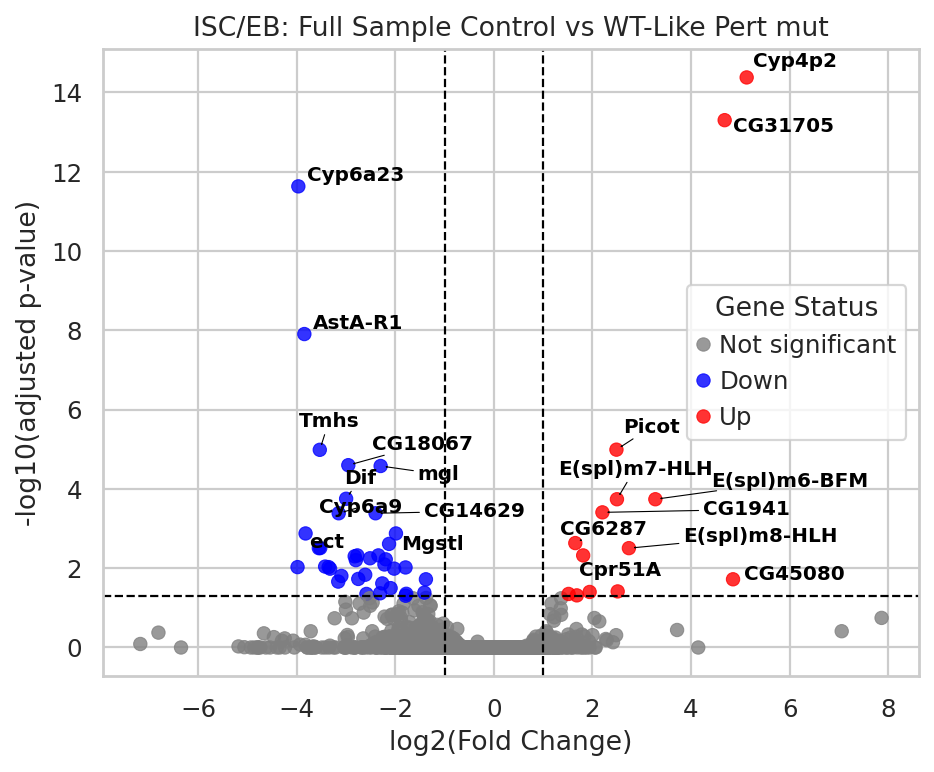

In [30]:
for ct in cluster_celltypes:
    for comp_val in ['wt', 'het', 'hom', 'mut']:
        fig_title = f'{ct}: Full Sample Control vs WT-Like Pert {comp_val}'
        comparison = fig_title.replace(':', '').replace(' ', '_')
        print(ct)
        X = np.zeros((4, raw_comb_adata.X.shape[1]))
        n_cells = []
        meta_index, meta_vals = [], []
        for i, run_label in enumerate(run_labels):
            tmp = raw_comb_adata[raw_comb_adata.obs['batch'] == run_label]
            tmp = tmp[np.isin(tmp.obs['celltype'], ct.split('/'))]
            if run_label in pert_run_labels:
                tmp = tmp[np.in1d(tmp.obs['wtlike_status'], wtlike_name_class[comp_val])]
            meta_index.append(run_label)
            meta_vals.append(run_label.split()[-1])
            n_cells.append(len(tmp))
            X[i] = tmp.X.sum(axis=0)
        metadata = pd.DataFrame(meta_vals, index=meta_index, columns=['condition'])
        n_cells_given_comparison[comparison] = n_cells
        print(f'Cell counts: {n_cells}')
        if min(n_cells) < min_cells_per_condition:
            print('Insufficient cells')
            continue
    
        counts_df = pd.DataFrame(X, index=meta_index, columns=tmp.var.index)
        counts_df = counts_df[counts_df.columns[counts_df.max() > min_max_reads_per_gene]]
    
        inference = DefaultInference(n_cpus=4)
        dds = DeseqDataSet(
            counts=counts_df,
            metadata=metadata,
            design="~condition",  # compare samples based on the "condition"
            refit_cooks=True,
            inference=inference,
            n_cpus=4,
        )
    
        dds.deseq2()

        ref_name, var_name = comp_vals
        ds = DeseqStats(dds, contrast=['condition', 'LamC', 'ctrl'], inference=inference)
        ds.summary()
        results_df = ds.results_df
        results_df_given_comparison[comparison] = results_df
        plot_volcano(results_df, fig_title=fig_title)
    
        print()


# Write significant genes

In [31]:
len(results_df_given_comparison.keys())

87

In [32]:
for name, results_df in results_df_given_comparison.items():
    name = name.replace('.', '').replace('/', '-')
    out_fpath = os.path.join(results_dir, f'{name}.csv')
    get_significant_genes(results_df, output_file=out_fpath)

Saved to: results/LamC/CC_Full_Sample_Control_vs_Perturbation.csv
Saved to: results/LamC/EB_Full_Sample_Control_vs_Perturbation.csv
Saved to: results/LamC/EE_Full_Sample_Control_vs_Perturbation.csv
Saved to: results/LamC/EEP_Full_Sample_Control_vs_Perturbation.csv
Saved to: results/LamC/ISC_Full_Sample_Control_vs_Perturbation.csv
Saved to: results/LamC/LFC_Full_Sample_Control_vs_Perturbation.csv
Saved to: results/LamC/VM_Full_Sample_Control_vs_Perturbation.csv
Saved to: results/LamC/aEC_Full_Sample_Control_vs_Perturbation.csv
Saved to: results/LamC/dEC_Full_Sample_Control_vs_Perturbation.csv
Saved to: results/LamC/dMT_Full_Sample_Control_vs_Perturbation.csv
Saved to: results/LamC/mEC_Full_Sample_Control_vs_Perturbation.csv
Saved to: results/LamC/pEC_Full_Sample_Control_vs_Perturbation.csv
Saved to: results/LamC/ISC-EB_Full_Sample_Control_vs_Perturbation.csv
Saved to: results/LamC/EB_Pert_het_vs_Pert_hom.csv
Saved to: results/LamC/ISC-EB_Pert_het_vs_Pert_hom.csv
Saved to: results/LamC/E

In [33]:
full_results_dir = results_dir + '_full_T10'
if not os.path.exists(full_results_dir):
    os.mkdir(full_results_dir)

In [34]:
for name, results_df in results_df_given_comparison.items():
    name = name.replace('.', '').replace('/', '-')
    out_fpath = os.path.join(full_results_dir, f'{name}.csv')
    results_df.to_csv(out_fpath)